In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import os
import random
from joblib import Parallel, delayed
from torch.utils.data import DataLoader

from src.encoders_decoders import *
from src.losses import *
from src.useful_functions import *
from scipy.stats import pearsonr

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

# This script contains the main training loops.
# It saves a dictionary of N_trials models trained with different target rates, together with the training history
# The saved models can then be analyzed.

Using device: cuda


In [ ]:
def train_Rt(enc,dec,q,x_data,x_test,opt,Rt,N_EPOCHS=500,lr_b = 0.1):
    # Train parameters of VAE (enc + dec) stored in opt at a given target rate
    # by minimizing -ELBO (D+R).
    history = { "loss" : [],
                "distortion" : [],
                "rate" : [],
                "beta" : [1] ,
                "distortion_test" : [],
                "rate_test" : []}

    for e in range(N_EPOCHS):
        lav = dav = rav = 0
        beta = history["beta"][-1]
        for x_ in x_data:
            rate = q(enc,x_)
            distortion = distortion_analytical_linear(x_,enc,dec,q.r_all)
            loss =  distortion +beta*rate
            opt.zero_grad()
            loss.backward()
            opt.step()
            lav += distortion + rate
            dav += distortion
            rav += rate
            if torch.isnan(loss):
                break;
        history["loss"].append(lav.item()/len(x_data))
        history["rate"].append(rav.item()/len(x_data))
        history["distortion"].append(dav.item()/len(x_data))
        
        #Update constraint
        beta += lr_b*(history["rate"][-1]-Rt)
        beta = beta if beta>0 else 0
        history["beta"].append(beta)
        if not e % 100:
            # Test decoder on larger set of stimuli
            history["distortion_test"].append(distortion_analytical_linear(x_test,enc,dec,q.r_all).mean().item())
            history["rate_test"].append(q(enc,x_test).mean().item())
        print(f'Epoch: {e} ||Rate: {history["rate"][-1]}||',
            f'ELBO:{history["loss"][-1]}||',
            f'Distortion: {history["distortion"][-1]}||Beta = {history["beta"][-1]}')
    history["beta"].pop()
    return history

def vary_R(RtVec, x_test, p_x, optimizer_name="adamw"):
    resume = {}

    # ✅ 샘플링은 반드시 결과를 변수에 받기
    with torch.no_grad():
        x_samples = p_x.sample((N_SAMPLES,))[:, None].to(device)

    x_sorted, _ = x_samples.sort(dim=0)

    # 🔑 NumPy/encoder용은 CPU로
    x_sorted_cpu = x_sorted.detach().cpu()

    x_min, x_max = x_sorted_cpu[0].item(), x_sorted_cpu[-1].item()

    x_data = DataLoader(x_samples, batch_size=BATCH_SIZE, shuffle=True)

    for Rt in RtVec:
        lr = 1e-4 if Rt < 1.5 else 1e-3
        print(f"Rate = {Rt} || lr = {lr}")
        enc = BernoulliEncoder(
                N,
                x_min - 1,
                x_max + 1,
                x_sorted_cpu,   # 🔑 CPU tensor
                w=2
            ).to(device)

        #enc = BernoulliEncoder(N, x_min-1, x_max+1, x_sorted, w=2).to(device)
        dec = MLPDecoder(N, M).to(device)
        q = rate_ising(N).to(device)

        # 🔥 핵심: r_all 같은 상수 텐서도 같이 이동
        if hasattr(q, "r_all"):
            q.r_all = q.r_all.to(device)

        q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        #q = rate_ising(N).to(device)
        #q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        params = list(enc.parameters()) + list(dec.parameters()) + list(q.parameters())
        opt = make_optimizer(optimizer_name, params, lr)
        print("Optimizer:", optimizer_name, "| class:", opt.__class__)

        history = train_Rt(enc, dec, q, x_data, x_test, opt, Rt,
                           N_EPOCHS=N_EPOCHS, lr_b=0.1)

        resume[Rt] = {
            'encode': enc.state_dict(),
            'decoder': dec.state_dict(),
            'q': q.state_dict(),
            'history': history,
            'lr': lr
        }
    return resume

def make_optimizer(opt_name, params, lr, weight_decay=0.0):
    opt_name = opt_name.lower()

    if opt_name == "adam":
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay)

    if opt_name == "adamw":
        return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

    # "AdamGrad"는 보통 AMSGrad를 의미하는 경우가 많아서 이렇게 구현
    if opt_name in ["adamgrad", "amsgrad"]:
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay, amsgrad=True)

    if opt_name == "sgd":
        # (권장) momentum 사용. nesterov는 취향.
        return torch.optim.SGD(params, lr=lr, momentum=0.9, nesterov=True, weight_decay=weight_decay)

    if opt_name == "rmsprop":
        return torch.optim.RMSprop(params, lr=lr, alpha=0.99, momentum=0.0, weight_decay=weight_decay)

    raise ValueError(f"Unknown optimizer: {opt_name}")

# ---------------------------
# Load
# ---------------------------
def load_results(path):
    obj = torch.load(path, map_location="cpu")
    # 기대: dict(optimizer -> list(trials))
    return obj

# ---------------------------
# Helpers
# ---------------------------
def convergence_epoch(history, Rt, tol=0.05):
    rate = np.array(history["rate"])
    gap = np.abs(rate - Rt)
    idx = np.where(gap < tol)[0]
    if len(idx) == 0:
        return np.inf
    return idx[0]


def _sorted_Rts_from_results(all_results, optimizer=None):
    if optimizer is None:
        optimizer = list(all_results.keys())[0]
    trial0 = all_results[optimizer][0]
    rts = list(trial0.keys())
    rts = [float(r) for r in rts]
    return sorted(rts)

def _get_history(all_results, optimizer, trial_idx, Rt):
    trial = all_results[optimizer][trial_idx]
    keys = [float(k) for k in trial.keys()]
    Rt = float(Rt)
    closest = min(keys, key=lambda x: abs(x - Rt))
    entry = trial[closest]
    return entry["history"]

def _history_to_array(hist, metric):
    arr = np.array(hist[metric], dtype=float)
    return arr

def aggregate_metric(all_results, optimizer, Rt, metric):
    """Return epochs, mean, std across trials for a metric at a given Rt."""
    n_trials = len(all_results[optimizer])
    series = []
    min_len = None

    for t in range(n_trials):
        hist = _get_history(all_results, optimizer, t, Rt)
        arr = _history_to_array(hist, metric)
        if min_len is None:
            min_len = len(arr)
        else:
            min_len = min(min_len, len(arr))
        series.append(arr)

    # 길이가 다르면 최소 길이에 맞춰 자름
    series = np.stack([s[:min_len] for s in series], axis=0)  # (trials, epochs)
    mean = series.mean(axis=0)
    std = series.std(axis=0)
    epochs = np.arange(min_len)
    return epochs, mean, std

# ---------------------------
# Plot 1: "한 Rt"에서 optimizer 비교 (epoch별 비교 플롯)
# ---------------------------
def plot_epochwise_compare(all_results, Rt, metrics=("loss", "distortion", "rate"), 
                           optimizers=None, shade=True, title_prefix=""):
    if optimizers is None:
        optimizers = list(all_results.keys())

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for opt in optimizers:
            epochs, mean, std = aggregate_metric(all_results, opt, Rt, metric)
            plt.plot(epochs, mean, label=f"{opt}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.2)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{title_prefix}Rt={float(Rt):.3g} | metric={metric}")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_optimizer_with_multiple_Rts(all_results, optimizer, Rts=None,
                                     metrics=("loss", "distortion", "rate"),
                                     max_Rts=6, shade=False):
    if Rts is None:
        Rts = _sorted_Rts_from_results(all_results, optimizer)

    # 너무 많으면 일부만 뽑기
    if len(Rts) > max_Rts:
        idx = np.linspace(0, len(Rts)-1, max_Rts).astype(int)
        Rts = [Rts[i] for i in idx]

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for Rt in Rts:
            epochs, mean, std = aggregate_metric(all_results, optimizer, Rt, metric)
            plt.plot(epochs, mean, label=f"Rt={float(Rt):.2g}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{optimizer} | metric={metric} | (multiple Rt)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_rate_constraint_gap(all_results, Rt, optimizers=None, shade=True):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(8, 5))
    for opt in optimizers:
        epochs, mean_rate, std_rate = aggregate_metric(all_results, opt, Rt, "rate")
        gap = np.abs(mean_rate - float(Rt))
        plt.plot(epochs, gap, label=f"{opt}")
        if shade:
            # std를 gap에 정교하게 반영하려면 trial별로 |.| 계산해야하지만,
            # 간단 비교용으로 rate의 std를 그대로 gap에 사용(근사)
            plt.fill_between(epochs, np.abs((mean_rate-std_rate) - float(Rt)),
                             np.abs((mean_rate+std_rate) - float(Rt)),
                             alpha=0.2)
    plt.xlabel("Epoch")
    plt.ylabel("|rate - Rt|")
    plt.title(f"Constraint satisfaction speed | Rt={float(Rt):.3g}")
    plt.yscale("log")  # 보통 수렴 비교가 더 잘 보임 (원하면 주석)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_all_for_Rt(all_results, Rt, optimizers=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    # (1) loss/distortion/rate epochwise compare
    plot_epochwise_compare(all_results, Rt, metrics=("loss","distortion","rate","beta"), optimizers=optimizers, shade=True)

    # (2) constraint gap
    plot_rate_constraint_gap(all_results, Rt, optimizers=optimizers, shade=True)


def plot_rate_gap(all_results, Rt, optimizers=None, tol=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,5))

    for opt in optimizers:
        gaps = []
        min_len = None

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            rate = np.array(hist["rate"])
            gap = np.abs(rate - Rt)

            if min_len is None:
                min_len = len(gap)
            else:
                min_len = min(min_len, len(gap))

            gaps.append(gap[:min_len])

        gaps = np.stack(gaps)
        mean_gap = gaps.mean(axis=0)
        std_gap  = gaps.std(axis=0)

        epochs = np.arange(min_len)
        plt.plot(epochs, mean_gap, label=opt)
        plt.fill_between(epochs, mean_gap-std_gap, mean_gap+std_gap, alpha=0.2)

    if tol is not None:
        plt.axhline(tol, color="k", linestyle="--", alpha=0.6, label="tolerance")

    plt.yscale("log")
    plt.xlabel("Epoch")
    plt.ylabel("|rate − Rt|")
    plt.title(f"Constraint satisfaction speed (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_beta_gap_trajectory(all_results, Rt, optimizer, trial_idx=0, max_epochs=None):
    """
    Time-ordered trajectory: beta(t) vs |rate(t)-Rt|
    """
    hist = all_results[optimizer][trial_idx][float(Rt)]["history"]

    beta = np.array(hist["beta"])
    rate = np.array(hist["rate"])
    gap  = np.abs(rate - Rt)

    L = min(len(beta), len(gap))
    if max_epochs is not None:
        L = min(L, max_epochs)

    beta = beta[:L]
    gap  = gap[:L]

    plt.figure(figsize=(6,5))
    plt.plot(gap, beta, "-o", markersize=3, alpha=0.7)
    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"{optimizer} | β–gap trajectory (Rt={Rt}, trial={trial_idx})")
    plt.tight_layout()
    plt.show()


def plot_beta_vs_rate_gap(all_results, Rt, optimizers=None, max_epochs=None):
    """
    Scatter + trajectory plot of beta vs |rate - Rt|
    """
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,6))

    for opt in optimizers:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            if max_epochs is not None:
                L = min(L, max_epochs)

            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        plt.scatter(
            gaps_all, betas_all,
            s=10, alpha=0.3, label=opt
        )

    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"β vs |rate − Rt| (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()
    
def summarize_convergence(all_results, Rt, tol=0.05):
    summary = {}

    for opt in all_results:
        epochs = []
        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            ep = convergence_epoch(hist, Rt, tol)
            epochs.append(ep)

        summary[opt] = {
            "mean_epoch": np.mean(epochs),
            "std_epoch": np.std(epochs),
            "epochs": epochs
        }
    return summary

In [ ]:
def train_Rt(enc,dec,q,x_data,x_test,opt,Rt,N_EPOCHS=500,lr_b = 0.1):
    # Train parameters of VAE (enc + dec) stored in opt at a given target rate
    # by minimizing -ELBO (D+R).
    history = { "loss" : [],
                "distortion" : [],
                "rate" : [],
                "beta" : [1] ,
                "distortion_test" : [],
                "rate_test" : []}

    for e in range(N_EPOCHS):
        lav = dav = rav = 0
        beta = history["beta"][-1]
        for x_ in x_data:
            rate = q(enc,x_)
            distortion = distortion_analytical_linear(x_,enc,dec,q.r_all)
            loss =  distortion +beta*rate
            opt.zero_grad()
            loss.backward()
            opt.step()
            lav += distortion + rate
            dav += distortion
            rav += rate
            if torch.isnan(loss):
                break;
        history["loss"].append(lav.item()/len(x_data))
        history["rate"].append(rav.item()/len(x_data))
        history["distortion"].append(dav.item()/len(x_data))
        
        #Update constraint
        beta += lr_b*(history["rate"][-1]-Rt)
        beta = beta if beta>0 else 0
        history["beta"].append(beta)
        if not e % 100:
            # Test decoder on larger set of stimuli
            history["distortion_test"].append(distortion_analytical_linear(x_test,enc,dec,q.r_all).mean().item())
            history["rate_test"].append(q(enc,x_test).mean().item())
        print(f'Epoch: {e} ||Rate: {history["rate"][-1]}||',
            f'ELBO:{history["loss"][-1]}||',
            f'Distortion: {history["distortion"][-1]}||Beta = {history["beta"][-1]}')
    history["beta"].pop()
    return history

def vary_R(RtVec, x_test, p_x, optimizer_name="adamw"):
    resume = {}

    # ✅ 샘플링은 반드시 결과를 변수에 받기
    with torch.no_grad():
        x_samples = p_x.sample((N_SAMPLES,))[:, None].to(device)

    x_sorted, _ = x_samples.sort(dim=0)

    # 🔑 NumPy/encoder용은 CPU로
    x_sorted_cpu = x_sorted.detach().cpu()

    x_min, x_max = x_sorted_cpu[0].item(), x_sorted_cpu[-1].item()

    x_data = DataLoader(x_samples, batch_size=BATCH_SIZE, shuffle=True)

    for Rt in RtVec:
        lr = 1e-4 if Rt < 1.5 else 1e-3
        print(f"Rate = {Rt} || lr = {lr}")
        enc = BernoulliEncoder(
                N,
                x_min - 1,
                x_max + 1,
                x_sorted_cpu,   # 🔑 CPU tensor
                w=2
            ).to(device)

        #enc = BernoulliEncoder(N, x_min-1, x_max+1, x_sorted, w=2).to(device)
        dec = MLPDecoder(N, M).to(device)
        q = rate_ising(N).to(device)

        # 🔥 핵심: r_all 같은 상수 텐서도 같이 이동
        if hasattr(q, "r_all"):
            q.r_all = q.r_all.to(device)

        q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        #q = rate_ising(N).to(device)
        #q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        params = list(enc.parameters()) + list(dec.parameters()) + list(q.parameters())
        opt = make_optimizer(optimizer_name, params, lr)
        print("Optimizer:", optimizer_name, "| class:", opt.__class__)

        history = train_Rt(enc, dec, q, x_data, x_test, opt, Rt,
                           N_EPOCHS=N_EPOCHS, lr_b=0.1)

        resume[Rt] = {
            'encode': enc.state_dict(),
            'decoder': dec.state_dict(),
            'q': q.state_dict(),
            'history': history,
            'lr': lr
        }
    return resume

def make_optimizer(opt_name, params, lr, weight_decay=0.0):
    opt_name = opt_name.lower()

    if opt_name == "adam":
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay)

    if opt_name == "adamw":
        return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

    # "AdamGrad"는 보통 AMSGrad를 의미하는 경우가 많아서 이렇게 구현
    if opt_name in ["adamgrad", "amsgrad"]:
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay, amsgrad=True)

    if opt_name == "sgd":
        # (권장) momentum 사용. nesterov는 취향.
        return torch.optim.SGD(params, lr=lr, momentum=0.9, nesterov=True, weight_decay=weight_decay)

    if opt_name == "rmsprop":
        return torch.optim.RMSprop(params, lr=lr, alpha=0.99, momentum=0.0, weight_decay=weight_decay)

    raise ValueError(f"Unknown optimizer: {opt_name}")

# ---------------------------
# Load
# ---------------------------
def load_results(path):
    obj = torch.load(path, map_location="cpu")
    # 기대: dict(optimizer -> list(trials))
    return obj

# ---------------------------
# Helpers
# ---------------------------
def convergence_epoch(history, Rt, tol=0.05):
    rate = np.array(history["rate"])
    gap = np.abs(rate - Rt)
    idx = np.where(gap < tol)[0]
    if len(idx) == 0:
        return np.inf
    return idx[0]


def _sorted_Rts_from_results(all_results, optimizer=None):
    if optimizer is None:
        optimizer = list(all_results.keys())[0]
    trial0 = all_results[optimizer][0]
    rts = list(trial0.keys())
    rts = [float(r) for r in rts]
    return sorted(rts)

def _get_history(all_results, optimizer, trial_idx, Rt):
    trial = all_results[optimizer][trial_idx]
    keys = [float(k) for k in trial.keys()]
    Rt = float(Rt)
    closest = min(keys, key=lambda x: abs(x - Rt))
    entry = trial[closest]
    return entry["history"]

def _history_to_array(hist, metric):
    arr = np.array(hist[metric], dtype=float)
    return arr

def aggregate_metric(all_results, optimizer, Rt, metric):
    """Return epochs, mean, std across trials for a metric at a given Rt."""
    n_trials = len(all_results[optimizer])
    series = []
    min_len = None

    for t in range(n_trials):
        hist = _get_history(all_results, optimizer, t, Rt)
        arr = _history_to_array(hist, metric)
        if min_len is None:
            min_len = len(arr)
        else:
            min_len = min(min_len, len(arr))
        series.append(arr)

    # 길이가 다르면 최소 길이에 맞춰 자름
    series = np.stack([s[:min_len] for s in series], axis=0)  # (trials, epochs)
    mean = series.mean(axis=0)
    std = series.std(axis=0)
    epochs = np.arange(min_len)
    return epochs, mean, std

# ---------------------------
# Plot 1: "한 Rt"에서 optimizer 비교 (epoch별 비교 플롯)
# ---------------------------
def plot_epochwise_compare(all_results, Rt, metrics=("loss", "distortion", "rate"), 
                           optimizers=None, shade=True, title_prefix=""):
    if optimizers is None:
        optimizers = list(all_results.keys())

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for opt in optimizers:
            epochs, mean, std = aggregate_metric(all_results, opt, Rt, metric)
            plt.plot(epochs, mean, label=f"{opt}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.2)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{title_prefix}Rt={float(Rt):.3g} | metric={metric}")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_optimizer_with_multiple_Rts(all_results, optimizer, Rts=None,
                                     metrics=("loss", "distortion", "rate"),
                                     max_Rts=6, shade=False):
    if Rts is None:
        Rts = _sorted_Rts_from_results(all_results, optimizer)

    # 너무 많으면 일부만 뽑기
    if len(Rts) > max_Rts:
        idx = np.linspace(0, len(Rts)-1, max_Rts).astype(int)
        Rts = [Rts[i] for i in idx]

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for Rt in Rts:
            epochs, mean, std = aggregate_metric(all_results, optimizer, Rt, metric)
            plt.plot(epochs, mean, label=f"Rt={float(Rt):.2g}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{optimizer} | metric={metric} | (multiple Rt)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_rate_constraint_gap(all_results, Rt, optimizers=None, shade=True):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(8, 5))
    for opt in optimizers:
        epochs, mean_rate, std_rate = aggregate_metric(all_results, opt, Rt, "rate")
        gap = np.abs(mean_rate - float(Rt))
        plt.plot(epochs, gap, label=f"{opt}")
        if shade:
            # std를 gap에 정교하게 반영하려면 trial별로 |.| 계산해야하지만,
            # 간단 비교용으로 rate의 std를 그대로 gap에 사용(근사)
            plt.fill_between(epochs, np.abs((mean_rate-std_rate) - float(Rt)),
                             np.abs((mean_rate+std_rate) - float(Rt)),
                             alpha=0.2)
    plt.xlabel("Epoch")
    plt.ylabel("|rate - Rt|")
    plt.title(f"Constraint satisfaction speed | Rt={float(Rt):.3g}")
    plt.yscale("log")  # 보통 수렴 비교가 더 잘 보임 (원하면 주석)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_all_for_Rt(all_results, Rt, optimizers=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    # (1) loss/distortion/rate epochwise compare
    plot_epochwise_compare(all_results, Rt, metrics=("loss","distortion","rate","beta"), optimizers=optimizers, shade=True)

    # (2) constraint gap
    plot_rate_constraint_gap(all_results, Rt, optimizers=optimizers, shade=True)


def plot_rate_gap(all_results, Rt, optimizers=None, tol=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,5))

    for opt in optimizers:
        gaps = []
        min_len = None

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            rate = np.array(hist["rate"])
            gap = np.abs(rate - Rt)

            if min_len is None:
                min_len = len(gap)
            else:
                min_len = min(min_len, len(gap))

            gaps.append(gap[:min_len])

        gaps = np.stack(gaps)
        mean_gap = gaps.mean(axis=0)
        std_gap  = gaps.std(axis=0)

        epochs = np.arange(min_len)
        plt.plot(epochs, mean_gap, label=opt)
        plt.fill_between(epochs, mean_gap-std_gap, mean_gap+std_gap, alpha=0.2)

    if tol is not None:
        plt.axhline(tol, color="k", linestyle="--", alpha=0.6, label="tolerance")

    plt.yscale("log")
    plt.xlabel("Epoch")
    plt.ylabel("|rate − Rt|")
    plt.title(f"Constraint satisfaction speed (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()
    
def beta_gap_correlation(all_results, Rt):
    summary = {}

    for opt in all_results:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        r, p = pearsonr(np.log(gaps_all + 1e-8), betas_all)
        summary[opt] = {"pearson_r": r, "p_value": p}

    return summary


def plot_beta_gap_trajectory(all_results, Rt, optimizer, trial_idx=0, max_epochs=None):
    """
    Time-ordered trajectory: beta(t) vs |rate(t)-Rt|
    """
    hist = all_results[optimizer][trial_idx][float(Rt)]["history"]

    beta = np.array(hist["beta"])
    rate = np.array(hist["rate"])
    gap  = np.abs(rate - Rt)

    L = min(len(beta), len(gap))
    if max_epochs is not None:
        L = min(L, max_epochs)

    beta = beta[:L]
    gap  = gap[:L]

    plt.figure(figsize=(6,5))
    plt.plot(gap, beta, "-o", markersize=3, alpha=0.7)
    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"{optimizer} | β–gap trajectory (Rt={Rt}, trial={trial_idx})")
    plt.tight_layout()
    plt.show()


def plot_beta_vs_rate_gap(all_results, Rt, optimizers=None, max_epochs=None):
    """
    Scatter + trajectory plot of beta vs |rate - Rt|
    """
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,6))

    for opt in optimizers:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            if max_epochs is not None:
                L = min(L, max_epochs)

            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        plt.scatter(
            gaps_all, betas_all,
            s=10, alpha=0.3, label=opt
        )

    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"β vs |rate − Rt| (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def summarize_convergence(all_results, Rt, tol=0.05):
    summary = {}

    for opt in all_results:
        epochs = []
        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            ep = convergence_epoch(hist, Rt, tol)
            epochs.append(ep)

        summary[opt] = {
            "mean_epoch": np.mean(epochs),
            "std_epoch": np.std(epochs),
            "epochs": epochs
        }
    return summary

In [ ]:
def train_Rt(enc,dec,q,x_data,x_test,opt,Rt,N_EPOCHS=500,lr_b = 0.1):
    # Train parameters of VAE (enc + dec) stored in opt at a given target rate
    # by minimizing -ELBO (D+R).
    history = { "loss" : [],
                "distortion" : [],
                "rate" : [],
                "beta" : [1] ,
                "distortion_test" : [],
                "rate_test" : []}

    for e in range(N_EPOCHS):
        lav = dav = rav = 0
        beta = history["beta"][-1]
        for x_ in x_data:
            rate = q(enc,x_)
            distortion = distortion_analytical_linear(x_,enc,dec,q.r_all)
            loss =  distortion +beta*rate
            opt.zero_grad()
            loss.backward()
            opt.step()
            lav += distortion + rate
            dav += distortion
            rav += rate
            if torch.isnan(loss):
                break;
        history["loss"].append(lav.item()/len(x_data))
        history["rate"].append(rav.item()/len(x_data))
        history["distortion"].append(dav.item()/len(x_data))
        
        #Update constraint
        beta += lr_b*(history["rate"][-1]-Rt)
        beta = beta if beta>0 else 0
        history["beta"].append(beta)
        if not e % 100:
            # Test decoder on larger set of stimuli
            history["distortion_test"].append(distortion_analytical_linear(x_test,enc,dec,q.r_all).mean().item())
            history["rate_test"].append(q(enc,x_test).mean().item())
        print(f'Epoch: {e} ||Rate: {history["rate"][-1]}||',
            f'ELBO:{history["loss"][-1]}||',
            f'Distortion: {history["distortion"][-1]}||Beta = {history["beta"][-1]}')
    history["beta"].pop()
    return history

def vary_R(RtVec, x_test, p_x, optimizer_name="adamw"):
    resume = {}

    # ✅ 샘플링은 반드시 결과를 변수에 받기
    with torch.no_grad():
        x_samples = p_x.sample((N_SAMPLES,))[:, None].to(device)

    x_sorted, _ = x_samples.sort(dim=0)

    # 🔑 NumPy/encoder용은 CPU로
    x_sorted_cpu = x_sorted.detach().cpu()

    x_min, x_max = x_sorted_cpu[0].item(), x_sorted_cpu[-1].item()

    x_data = DataLoader(x_samples, batch_size=BATCH_SIZE, shuffle=True)

    for Rt in RtVec:
        lr = 1e-4 if Rt < 1.5 else 1e-3
        print(f"Rate = {Rt} || lr = {lr}")
        enc = BernoulliEncoder(
                N,
                x_min - 1,
                x_max + 1,
                x_sorted_cpu,   # 🔑 CPU tensor
                w=2
            ).to(device)

        #enc = BernoulliEncoder(N, x_min-1, x_max+1, x_sorted, w=2).to(device)
        dec = MLPDecoder(N, M).to(device)
        q = rate_ising(N).to(device)

        # 🔥 핵심: r_all 같은 상수 텐서도 같이 이동
        if hasattr(q, "r_all"):
            q.r_all = q.r_all.to(device)

        q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        #q = rate_ising(N).to(device)
        #q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        params = list(enc.parameters()) + list(dec.parameters()) + list(q.parameters())
        opt = make_optimizer(optimizer_name, params, lr)
        print("Optimizer:", optimizer_name, "| class:", opt.__class__)

        history = train_Rt(enc, dec, q, x_data, x_test, opt, Rt,
                           N_EPOCHS=N_EPOCHS, lr_b=0.1)

        resume[Rt] = {
            'encode': enc.state_dict(),
            'decoder': dec.state_dict(),
            'q': q.state_dict(),
            'history': history,
            'lr': lr
        }
    return resume

def make_optimizer(opt_name, params, lr, weight_decay=0.0):
    opt_name = opt_name.lower()

    if opt_name == "adam":
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay)

    if opt_name == "adamw":
        return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

    # "AdamGrad"는 보통 AMSGrad를 의미하는 경우가 많아서 이렇게 구현
    if opt_name in ["adamgrad", "amsgrad"]:
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay, amsgrad=True)

    if opt_name == "sgd":
        # (권장) momentum 사용. nesterov는 취향.
        return torch.optim.SGD(params, lr=lr, momentum=0.9, nesterov=True, weight_decay=weight_decay)

    if opt_name == "rmsprop":
        return torch.optim.RMSprop(params, lr=lr, alpha=0.99, momentum=0.0, weight_decay=weight_decay)

    raise ValueError(f"Unknown optimizer: {opt_name}")

# ---------------------------
# Load
# ---------------------------
def load_results(path):
    obj = torch.load(path, map_location="cpu")
    # 기대: dict(optimizer -> list(trials))
    return obj

# ---------------------------
# Helpers
# ---------------------------
def convergence_epoch(history, Rt, tol=0.05):
    rate = np.array(history["rate"])
    gap = np.abs(rate - Rt)
    idx = np.where(gap < tol)[0]
    if len(idx) == 0:
        return np.inf
    return idx[0]


def _sorted_Rts_from_results(all_results, optimizer=None):
    if optimizer is None:
        optimizer = list(all_results.keys())[0]
    trial0 = all_results[optimizer][0]
    rts = list(trial0.keys())
    rts = [float(r) for r in rts]
    return sorted(rts)

def _get_history(all_results, optimizer, trial_idx, Rt):
    trial = all_results[optimizer][trial_idx]
    keys = [float(k) for k in trial.keys()]
    Rt = float(Rt)
    closest = min(keys, key=lambda x: abs(x - Rt))
    entry = trial[closest]
    return entry["history"]

def _history_to_array(hist, metric):
    arr = np.array(hist[metric], dtype=float)
    return arr

def aggregate_metric(all_results, optimizer, Rt, metric):
    """Return epochs, mean, std across trials for a metric at a given Rt."""
    n_trials = len(all_results[optimizer])
    series = []
    min_len = None

    for t in range(n_trials):
        hist = _get_history(all_results, optimizer, t, Rt)
        arr = _history_to_array(hist, metric)
        if min_len is None:
            min_len = len(arr)
        else:
            min_len = min(min_len, len(arr))
        series.append(arr)

    # 길이가 다르면 최소 길이에 맞춰 자름
    series = np.stack([s[:min_len] for s in series], axis=0)  # (trials, epochs)
    mean = series.mean(axis=0)
    std = series.std(axis=0)
    epochs = np.arange(min_len)
    return epochs, mean, std

# ---------------------------
# Plot 1: "한 Rt"에서 optimizer 비교 (epoch별 비교 플롯)
# ---------------------------
def plot_epochwise_compare(all_results, Rt, metrics=("loss", "distortion", "rate"), 
                           optimizers=None, shade=True, title_prefix=""):
    if optimizers is None:
        optimizers = list(all_results.keys())

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for opt in optimizers:
            epochs, mean, std = aggregate_metric(all_results, opt, Rt, metric)
            plt.plot(epochs, mean, label=f"{opt}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.2)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{title_prefix}Rt={float(Rt):.3g} | metric={metric}")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_optimizer_with_multiple_Rts(all_results, optimizer, Rts=None,
                                     metrics=("loss", "distortion", "rate"),
                                     max_Rts=6, shade=False):
    if Rts is None:
        Rts = _sorted_Rts_from_results(all_results, optimizer)

    # 너무 많으면 일부만 뽑기
    if len(Rts) > max_Rts:
        idx = np.linspace(0, len(Rts)-1, max_Rts).astype(int)
        Rts = [Rts[i] for i in idx]

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for Rt in Rts:
            epochs, mean, std = aggregate_metric(all_results, optimizer, Rt, metric)
            plt.plot(epochs, mean, label=f"Rt={float(Rt):.2g}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{optimizer} | metric={metric} | (multiple Rt)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_rate_constraint_gap(all_results, Rt, optimizers=None, shade=True):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(8, 5))
    for opt in optimizers:
        epochs, mean_rate, std_rate = aggregate_metric(all_results, opt, Rt, "rate")
        gap = np.abs(mean_rate - float(Rt))
        plt.plot(epochs, gap, label=f"{opt}")
        if shade:
            # std를 gap에 정교하게 반영하려면 trial별로 |.| 계산해야하지만,
            # 간단 비교용으로 rate의 std를 그대로 gap에 사용(근사)
            plt.fill_between(epochs, np.abs((mean_rate-std_rate) - float(Rt)),
                             np.abs((mean_rate+std_rate) - float(Rt)),
                             alpha=0.2)
    plt.xlabel("Epoch")
    plt.ylabel("|rate - Rt|")
    plt.title(f"Constraint satisfaction speed | Rt={float(Rt):.3g}")
    plt.yscale("log")  # 보통 수렴 비교가 더 잘 보임 (원하면 주석)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_all_for_Rt(all_results, Rt, optimizers=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    # (1) loss/distortion/rate epochwise compare
    plot_epochwise_compare(all_results, Rt, metrics=("loss","distortion","rate","beta"), optimizers=optimizers, shade=True)

    # (2) constraint gap
    plot_rate_constraint_gap(all_results, Rt, optimizers=optimizers, shade=True)

    # (3) rate gap 관련 추가 분석
    plot_rate_gap(all_results, Rt, optimizers=optimizers, tol=0.05)
    plot_beta_vs_rate_gap(all_results, Rt, optimizers=optimizers, tol=0.05)

 
  


def plot_rate_gap(all_results, Rt, optimizers=None, tol=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,5))

    for opt in optimizers:
        gaps = []
        min_len = None

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            rate = np.array(hist["rate"])
            gap = np.abs(rate - Rt)

            if min_len is None:
                min_len = len(gap)
            else:
                min_len = min(min_len, len(gap))

            gaps.append(gap[:min_len])

        gaps = np.stack(gaps)
        mean_gap = gaps.mean(axis=0)
        std_gap  = gaps.std(axis=0)

        epochs = np.arange(min_len)
        plt.plot(epochs, mean_gap, label=opt)
        plt.fill_between(epochs, mean_gap-std_gap, mean_gap+std_gap, alpha=0.2)

    if tol is not None:
        plt.axhline(tol, color="k", linestyle="--", alpha=0.6, label="tolerance")

    plt.yscale("log")
    plt.xlabel("Epoch")
    plt.ylabel("|rate − Rt|")
    plt.title(f"Constraint satisfaction speed (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def beta_gap_correlation(all_results, Rt):
    summary = {}

    for opt in all_results:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        r, p = pearsonr(np.log(gaps_all + 1e-8), betas_all)
        summary[opt] = {"pearson_r": r, "p_value": p}

    return summary


def plot_beta_gap_trajectory(all_results, Rt, optimizer, trial_idx=0, max_epochs=None):
    """
    Time-ordered trajectory: beta(t) vs |rate(t)-Rt|
    """
    hist = all_results[optimizer][trial_idx][float(Rt)]["history"]

    beta = np.array(hist["beta"])
    rate = np.array(hist["rate"])
    gap  = np.abs(rate - Rt)

    L = min(len(beta), len(gap))
    if max_epochs is not None:
        L = min(L, max_epochs)

    beta = beta[:L]
    gap  = gap[:L]

    plt.figure(figsize=(6,5))
    plt.plot(gap, beta, "-o", markersize=3, alpha=0.7)
    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"{optimizer} | β–gap trajectory (Rt={Rt}, trial={trial_idx})")
    plt.tight_layout()
    plt.show()


def plot_beta_vs_rate_gap(all_results, Rt, optimizers=None, max_epochs=None):
    """
    Scatter + trajectory plot of beta vs |rate - Rt|
    """
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,6))

    for opt in optimizers:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            if max_epochs is not None:
                L = min(L, max_epochs)

            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        plt.scatter(
            gaps_all, betas_all,
            s=10, alpha=0.3, label=opt
        )

    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"β vs |rate − Rt| (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def summarize_convergence(all_results, Rt, tol=0.05):
    summary = {}

    for opt in all_results:
        epochs = []
        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            ep = convergence_epoch(hist, Rt, tol)
            epochs.append(ep)

        summary[opt] = {
            "mean_epoch": np.mean(epochs),
            "std_epoch": np.std(epochs),
            "epochs": epochs
        }
    return summary

In [ ]:
# Draw the plots for a given Rt
all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

Rt = 3.2
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

NameError: name 'PATH' is not defined

In [ ]:
PATH = os.getcwd() + f"/data/compare_opts_samples={N_SAMPLES}_N=12_q=Ising.pt"
torch.save(all_results, PATH)

NameError: name 'N_SAMPLES' is not defined

In [ ]:
# Draw the plots for a given Rt

PATH = "./data/compare_opts_samples=1000_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )


Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 3.2
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

<ipython-input-4-b4ae2b2a2178>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


FileNotFoundError: [Errno 2] No such file or directory: './data/compare_opts_samples=1000_N=12_q=Ising.pt'

In [ ]:
# Draw the plots for a given Rt

PATH = os.getcwd() + f"./data/compare_opts_samples=1000_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )


Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 3.2
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

<ipython-input-4-b4ae2b2a2178>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\opist\\Desktop\\VAE_project\\Team Project\\neural_VAE-main./data/compare_opts_samples=1000_N=12_q=Ising.pt'

<ipython-input-4-b4ae2b2a2178>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


optimizers: ['adam', 'adamgrad', 'adamw', 'sgd', 'rmsprop']
example Rts: [0.6, 1.5, 2.4, 3.3]


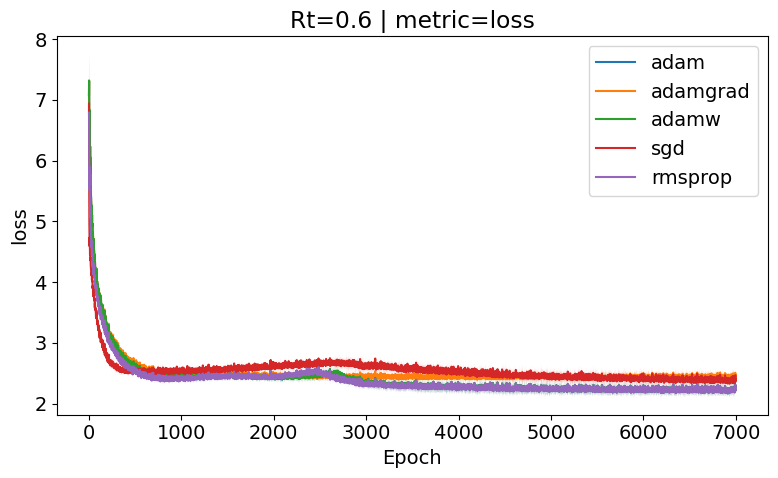

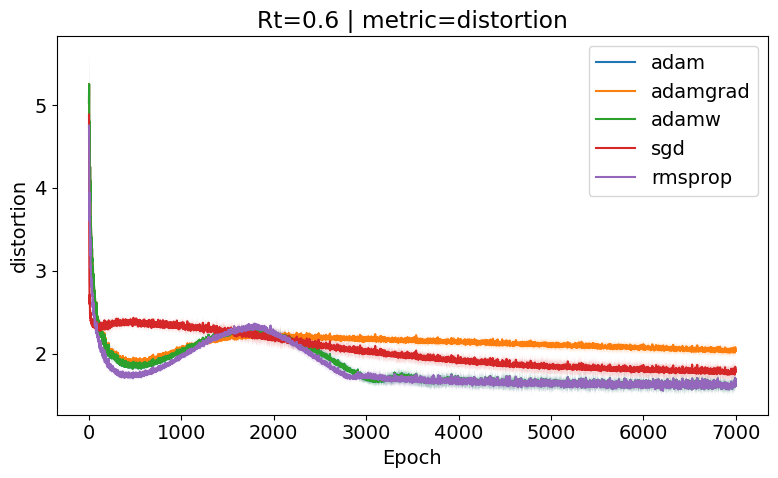

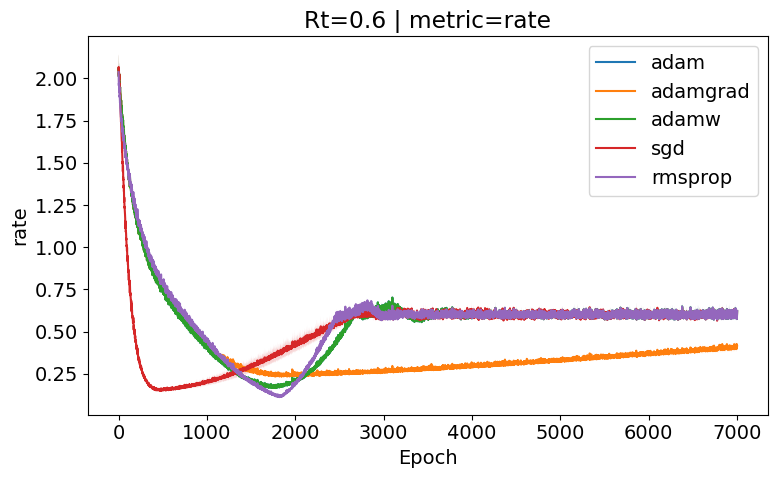

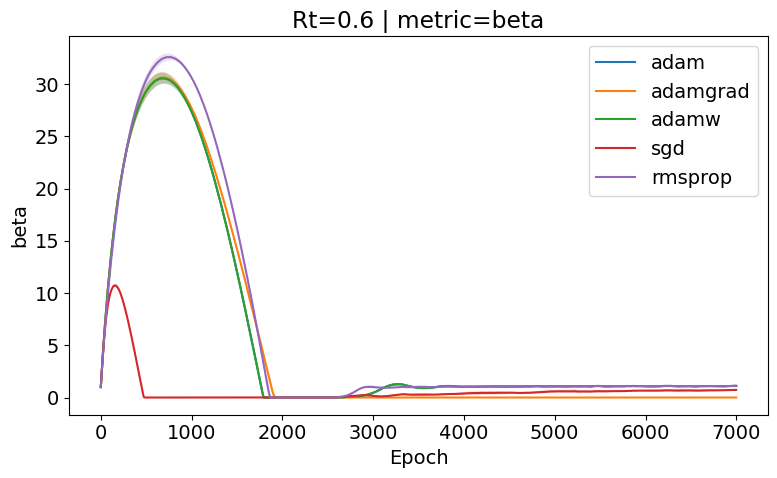

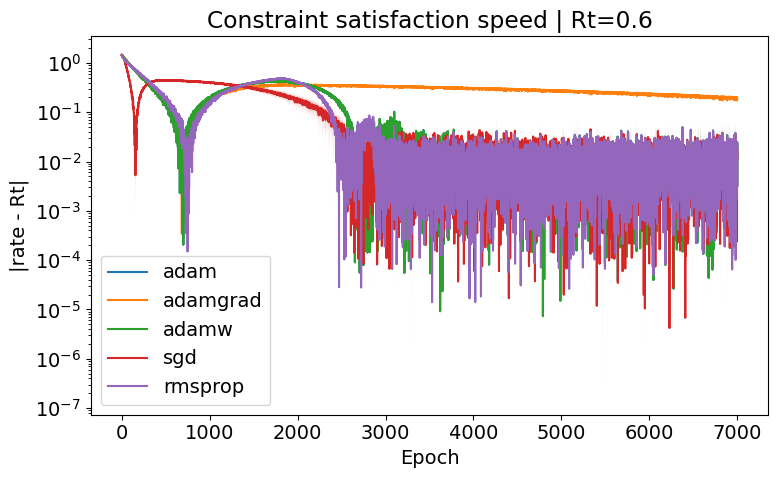

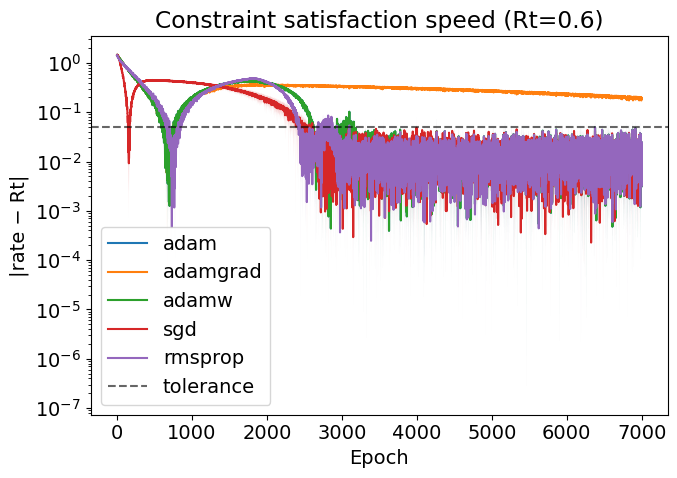

TypeError: plot_beta_vs_rate_gap() got an unexpected keyword argument 'tol'

In [ ]:
# Draw the plots for a given Rt

PATH = os.getcwd() + f"./data/compare_opts_samples=100_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )


Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 3.2
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

In [ ]:
def train_Rt(enc,dec,q,x_data,x_test,opt,Rt,N_EPOCHS=500,lr_b = 0.1):
    # Train parameters of VAE (enc + dec) stored in opt at a given target rate
    # by minimizing -ELBO (D+R).
    history = { "loss" : [],
                "distortion" : [],
                "rate" : [],
                "beta" : [1] ,
                "distortion_test" : [],
                "rate_test" : []}

    for e in range(N_EPOCHS):
        lav = dav = rav = 0
        beta = history["beta"][-1]
        for x_ in x_data:
            rate = q(enc,x_)
            distortion = distortion_analytical_linear(x_,enc,dec,q.r_all)
            loss =  distortion +beta*rate
            opt.zero_grad()
            loss.backward()
            opt.step()
            lav += distortion + rate
            dav += distortion
            rav += rate
            if torch.isnan(loss):
                break;
        history["loss"].append(lav.item()/len(x_data))
        history["rate"].append(rav.item()/len(x_data))
        history["distortion"].append(dav.item()/len(x_data))
        
        #Update constraint
        beta += lr_b*(history["rate"][-1]-Rt)
        beta = beta if beta>0 else 0
        history["beta"].append(beta)
        if not e % 100:
            # Test decoder on larger set of stimuli
            history["distortion_test"].append(distortion_analytical_linear(x_test,enc,dec,q.r_all).mean().item())
            history["rate_test"].append(q(enc,x_test).mean().item())
        print(f'Epoch: {e} ||Rate: {history["rate"][-1]}||',
            f'ELBO:{history["loss"][-1]}||',
            f'Distortion: {history["distortion"][-1]}||Beta = {history["beta"][-1]}')
    history["beta"].pop()
    return history

def vary_R(RtVec, x_test, p_x, optimizer_name="adamw"):
    resume = {}

    # ✅ 샘플링은 반드시 결과를 변수에 받기
    with torch.no_grad():
        x_samples = p_x.sample((N_SAMPLES,))[:, None].to(device)

    x_sorted, _ = x_samples.sort(dim=0)

    # 🔑 NumPy/encoder용은 CPU로
    x_sorted_cpu = x_sorted.detach().cpu()

    x_min, x_max = x_sorted_cpu[0].item(), x_sorted_cpu[-1].item()

    x_data = DataLoader(x_samples, batch_size=BATCH_SIZE, shuffle=True)

    for Rt in RtVec:
        lr = 1e-4 if Rt < 1.5 else 1e-3
        print(f"Rate = {Rt} || lr = {lr}")
        enc = BernoulliEncoder(
                N,
                x_min - 1,
                x_max + 1,
                x_sorted_cpu,   # 🔑 CPU tensor
                w=2
            ).to(device)

        #enc = BernoulliEncoder(N, x_min-1, x_max+1, x_sorted, w=2).to(device)
        dec = MLPDecoder(N, M).to(device)
        q = rate_ising(N).to(device)

        # 🔥 핵심: r_all 같은 상수 텐서도 같이 이동
        if hasattr(q, "r_all"):
            q.r_all = q.r_all.to(device)

        q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        #q = rate_ising(N).to(device)
        #q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        params = list(enc.parameters()) + list(dec.parameters()) + list(q.parameters())
        opt = make_optimizer(optimizer_name, params, lr)
        print("Optimizer:", optimizer_name, "| class:", opt.__class__)

        history = train_Rt(enc, dec, q, x_data, x_test, opt, Rt,
                           N_EPOCHS=N_EPOCHS, lr_b=0.1)

        resume[Rt] = {
            'encode': enc.state_dict(),
            'decoder': dec.state_dict(),
            'q': q.state_dict(),
            'history': history,
            'lr': lr
        }
    return resume

def make_optimizer(opt_name, params, lr, weight_decay=0.0):
    opt_name = opt_name.lower()

    if opt_name == "adam":
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay)

    if opt_name == "adamw":
        return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

    # "AdamGrad"는 보통 AMSGrad를 의미하는 경우가 많아서 이렇게 구현
    if opt_name in ["adamgrad", "amsgrad"]:
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay, amsgrad=True)

    if opt_name == "sgd":
        # (권장) momentum 사용. nesterov는 취향.
        return torch.optim.SGD(params, lr=lr, momentum=0.9, nesterov=True, weight_decay=weight_decay)

    if opt_name == "rmsprop":
        return torch.optim.RMSprop(params, lr=lr, alpha=0.99, momentum=0.0, weight_decay=weight_decay)

    raise ValueError(f"Unknown optimizer: {opt_name}")

# ---------------------------
# Load
# ---------------------------
def load_results(path):
    obj = torch.load(path, map_location="cpu")
    # 기대: dict(optimizer -> list(trials))
    return obj

# ---------------------------
# Helpers
# ---------------------------
def convergence_epoch(history, Rt, tol=0.05):
    rate = np.array(history["rate"])
    gap = np.abs(rate - Rt)
    idx = np.where(gap < tol)[0]
    if len(idx) == 0:
        return np.inf
    return idx[0]


def _sorted_Rts_from_results(all_results, optimizer=None):
    if optimizer is None:
        optimizer = list(all_results.keys())[0]
    trial0 = all_results[optimizer][0]
    rts = list(trial0.keys())
    rts = [float(r) for r in rts]
    return sorted(rts)

def _get_history(all_results, optimizer, trial_idx, Rt):
    trial = all_results[optimizer][trial_idx]
    keys = [float(k) for k in trial.keys()]
    Rt = float(Rt)
    closest = min(keys, key=lambda x: abs(x - Rt))
    entry = trial[closest]
    return entry["history"]

def _history_to_array(hist, metric):
    arr = np.array(hist[metric], dtype=float)
    return arr

def aggregate_metric(all_results, optimizer, Rt, metric):
    """Return epochs, mean, std across trials for a metric at a given Rt."""
    n_trials = len(all_results[optimizer])
    series = []
    min_len = None

    for t in range(n_trials):
        hist = _get_history(all_results, optimizer, t, Rt)
        arr = _history_to_array(hist, metric)
        if min_len is None:
            min_len = len(arr)
        else:
            min_len = min(min_len, len(arr))
        series.append(arr)

    # 길이가 다르면 최소 길이에 맞춰 자름
    series = np.stack([s[:min_len] for s in series], axis=0)  # (trials, epochs)
    mean = series.mean(axis=0)
    std = series.std(axis=0)
    epochs = np.arange(min_len)
    return epochs, mean, std

# ---------------------------
# Plot 1: "한 Rt"에서 optimizer 비교 (epoch별 비교 플롯)
# ---------------------------
def plot_epochwise_compare(all_results, Rt, metrics=("loss", "distortion", "rate"), 
                           optimizers=None, shade=True, title_prefix=""):
    if optimizers is None:
        optimizers = list(all_results.keys())

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for opt in optimizers:
            epochs, mean, std = aggregate_metric(all_results, opt, Rt, metric)
            plt.plot(epochs, mean, label=f"{opt}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.2)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{title_prefix}Rt={float(Rt):.3g} | metric={metric}")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_optimizer_with_multiple_Rts(all_results, optimizer, Rts=None,
                                     metrics=("loss", "distortion", "rate"),
                                     max_Rts=6, shade=False):
    if Rts is None:
        Rts = _sorted_Rts_from_results(all_results, optimizer)

    # 너무 많으면 일부만 뽑기
    if len(Rts) > max_Rts:
        idx = np.linspace(0, len(Rts)-1, max_Rts).astype(int)
        Rts = [Rts[i] for i in idx]

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for Rt in Rts:
            epochs, mean, std = aggregate_metric(all_results, optimizer, Rt, metric)
            plt.plot(epochs, mean, label=f"Rt={float(Rt):.2g}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{optimizer} | metric={metric} | (multiple Rt)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_rate_constraint_gap(all_results, Rt, optimizers=None, shade=True):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(8, 5))
    for opt in optimizers:
        epochs, mean_rate, std_rate = aggregate_metric(all_results, opt, Rt, "rate")
        gap = np.abs(mean_rate - float(Rt))
        plt.plot(epochs, gap, label=f"{opt}")
        if shade:
            # std를 gap에 정교하게 반영하려면 trial별로 |.| 계산해야하지만,
            # 간단 비교용으로 rate의 std를 그대로 gap에 사용(근사)
            plt.fill_between(epochs, np.abs((mean_rate-std_rate) - float(Rt)),
                             np.abs((mean_rate+std_rate) - float(Rt)),
                             alpha=0.2)
    plt.xlabel("Epoch")
    plt.ylabel("|rate - Rt|")
    plt.title(f"Constraint satisfaction speed | Rt={float(Rt):.3g}")
    plt.yscale("log")  # 보통 수렴 비교가 더 잘 보임 (원하면 주석)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_all_for_Rt(all_results, Rt, optimizers=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    # (1) loss/distortion/rate epochwise compare
    plot_epochwise_compare(all_results, Rt, metrics=("loss","distortion","rate","beta"), optimizers=optimizers, shade=True)

    # (2) constraint gap
    plot_rate_constraint_gap(all_results, Rt, optimizers=optimizers, shade=True)

    # (3) rate gap 관련 추가 분석
    plot_rate_gap(all_results, Rt, optimizers=optimizers, tol=0.05)
    plot_beta_vs_rate_gap(all_results, Rt, optimizers=optimizers, max_epochs=500)

 
  


def plot_rate_gap(all_results, Rt, optimizers=None, tol=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,5))

    for opt in optimizers:
        gaps = []
        min_len = None

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            rate = np.array(hist["rate"])
            gap = np.abs(rate - Rt)

            if min_len is None:
                min_len = len(gap)
            else:
                min_len = min(min_len, len(gap))

            gaps.append(gap[:min_len])

        gaps = np.stack(gaps)
        mean_gap = gaps.mean(axis=0)
        std_gap  = gaps.std(axis=0)

        epochs = np.arange(min_len)
        plt.plot(epochs, mean_gap, label=opt)
        plt.fill_between(epochs, mean_gap-std_gap, mean_gap+std_gap, alpha=0.2)

    if tol is not None:
        plt.axhline(tol, color="k", linestyle="--", alpha=0.6, label="tolerance")

    plt.yscale("log")
    plt.xlabel("Epoch")
    plt.ylabel("|rate − Rt|")
    plt.title(f"Constraint satisfaction speed (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def beta_gap_correlation(all_results, Rt):
    summary = {}

    for opt in all_results:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        r, p = pearsonr(np.log(gaps_all + 1e-8), betas_all)
        summary[opt] = {"pearson_r": r, "p_value": p}

    return summary


def plot_beta_gap_trajectory(all_results, Rt, optimizer, trial_idx=0, max_epochs=None):
    """
    Time-ordered trajectory: beta(t) vs |rate(t)-Rt|
    """
    hist = all_results[optimizer][trial_idx][float(Rt)]["history"]

    beta = np.array(hist["beta"])
    rate = np.array(hist["rate"])
    gap  = np.abs(rate - Rt)

    L = min(len(beta), len(gap))
    if max_epochs is not None:
        L = min(L, max_epochs)

    beta = beta[:L]
    gap  = gap[:L]

    plt.figure(figsize=(6,5))
    plt.plot(gap, beta, "-o", markersize=3, alpha=0.7)
    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"{optimizer} | β–gap trajectory (Rt={Rt}, trial={trial_idx})")
    plt.tight_layout()
    plt.show()


def plot_beta_vs_rate_gap(all_results, Rt, optimizers=None, max_epochs=None):
    """
    Scatter + trajectory plot of beta vs |rate - Rt|
    """
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,6))

    for opt in optimizers:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            if max_epochs is not None:
                L = min(L, max_epochs)

            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        plt.scatter(
            gaps_all, betas_all,
            s=10, alpha=0.3, label=opt
        )

    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"β vs |rate − Rt| (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def summarize_convergence(all_results, Rt, tol=0.05):
    summary = {}

    for opt in all_results:
        epochs = []
        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            ep = convergence_epoch(hist, Rt, tol)
            epochs.append(ep)

        summary[opt] = {
            "mean_epoch": np.mean(epochs),
            "std_epoch": np.std(epochs),
            "epochs": epochs
        }
    return summary

<ipython-input-10-8002f1113ccc>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


optimizers: ['adam', 'adamgrad', 'adamw', 'sgd', 'rmsprop']
example Rts: [0.6, 1.5, 2.4, 3.3]


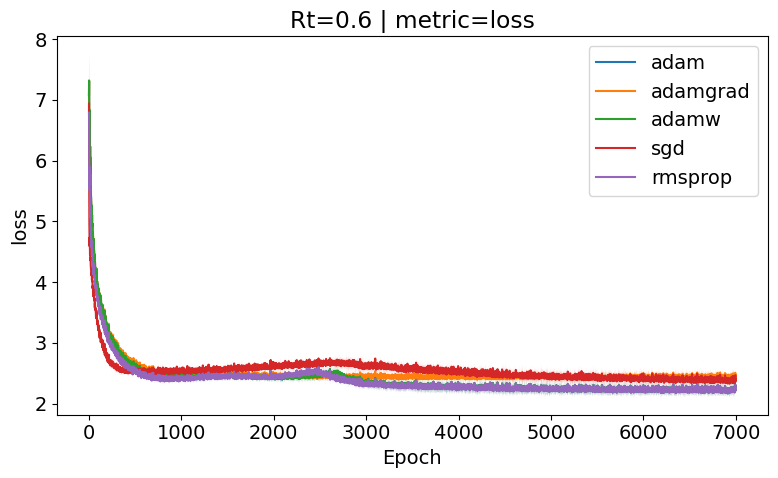

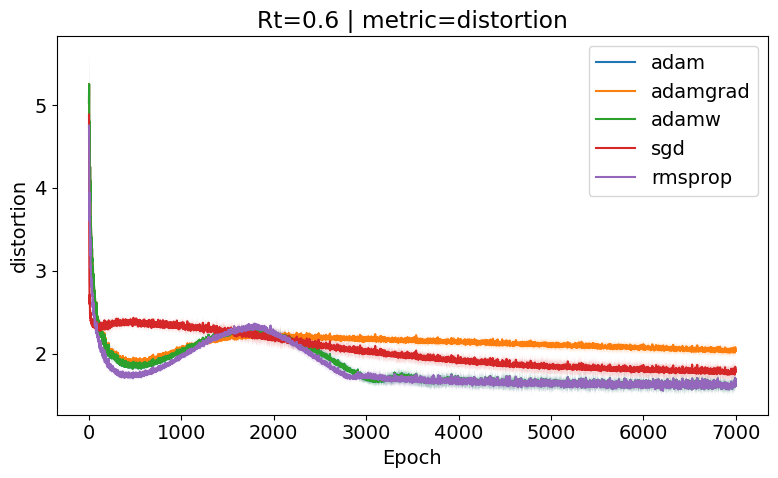

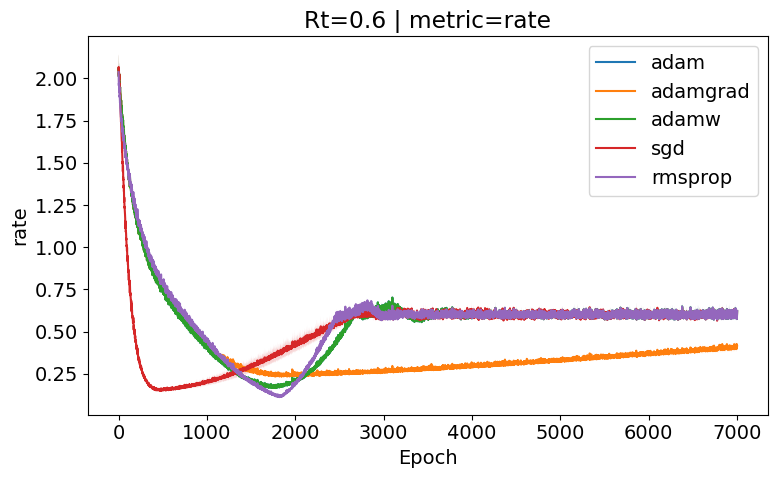

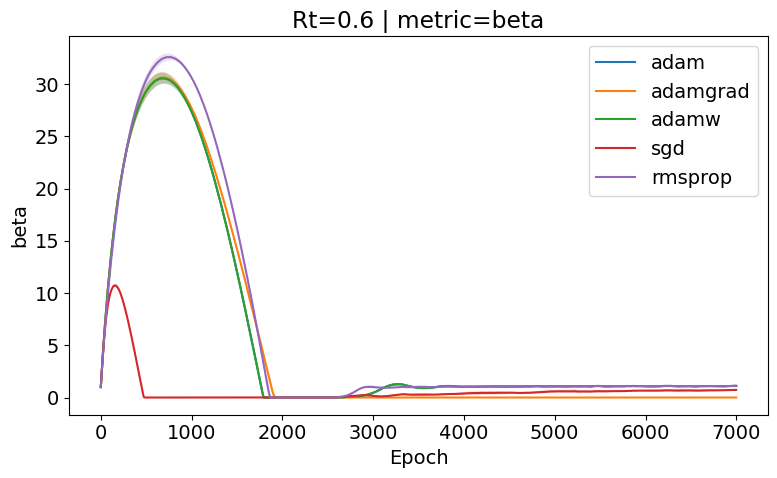

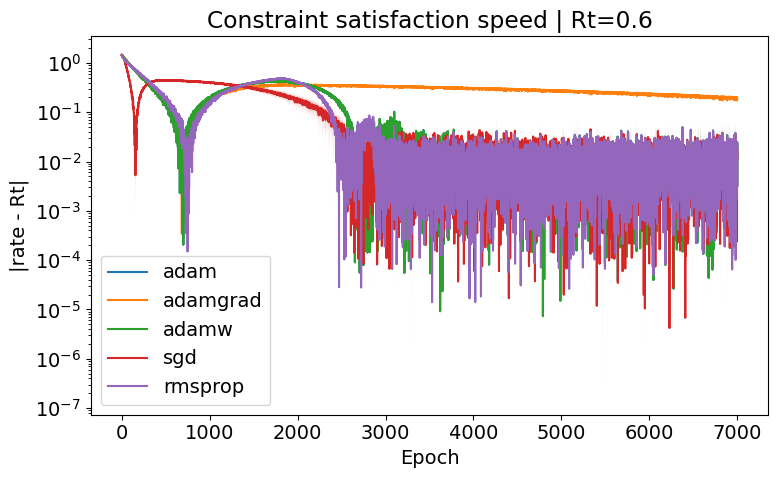

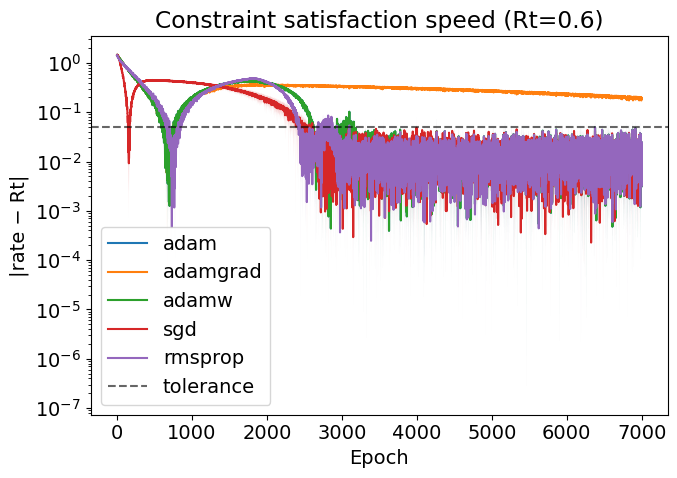

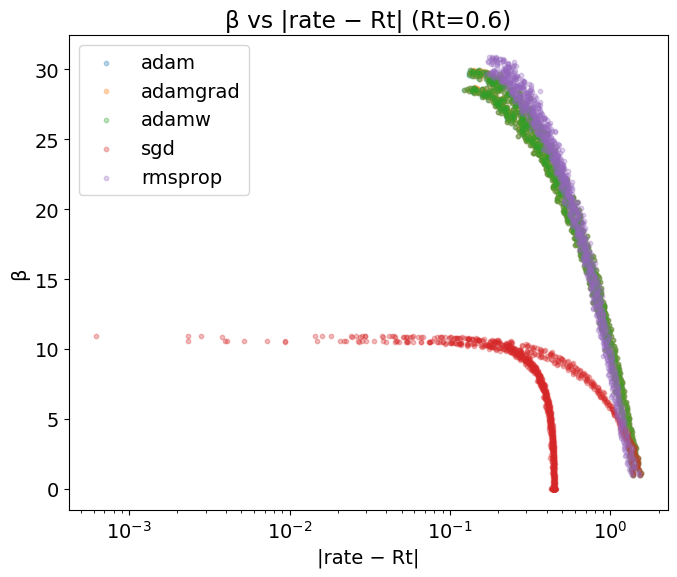

adam 592.0 ± 1.0
adamgrad 592.0 ± 1.0
adamw 592.0 ± 1.0
sgd 142.5 ± 2.5
rmsprop 640.5 ± 1.5
adam: r=0.428, p=0.0e+00
adamgrad: r=-0.447, p=0.0e+00
adamw: r=0.428, p=0.0e+00
sgd: r=0.177, p=1.9e-98
rmsprop: r=0.478, p=0.0e+00


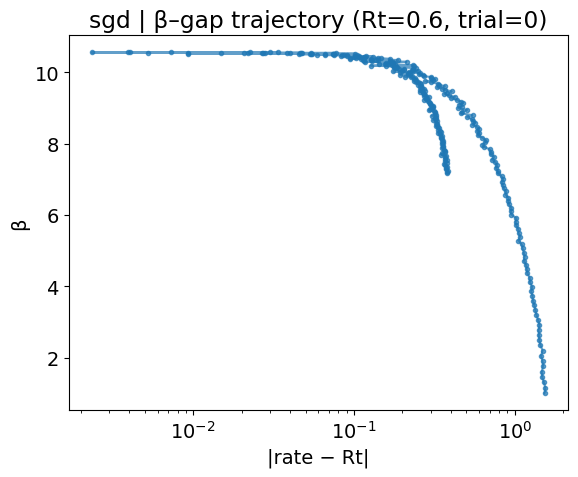

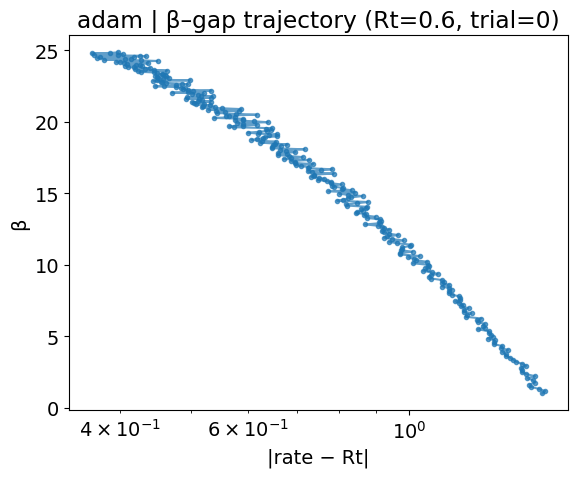

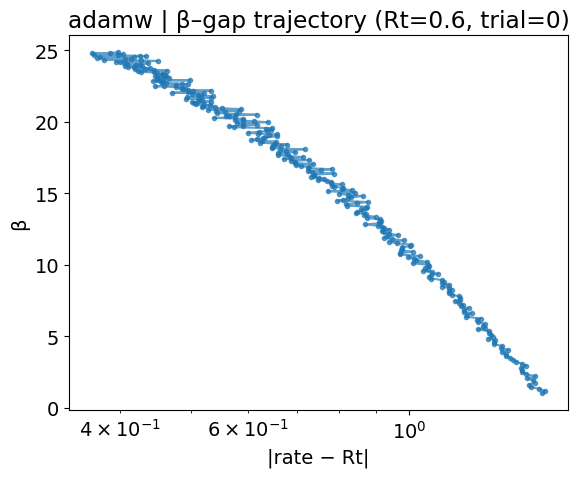

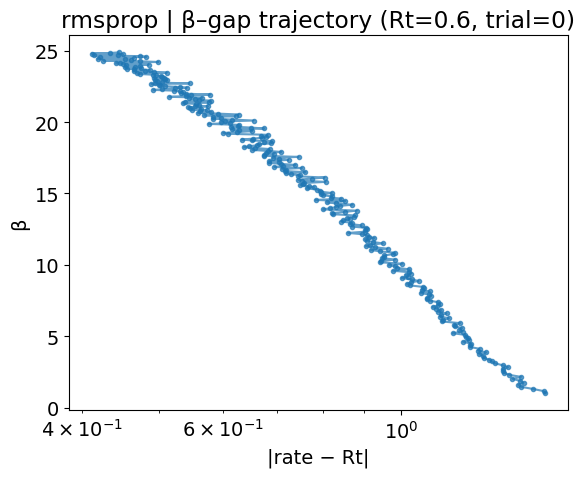

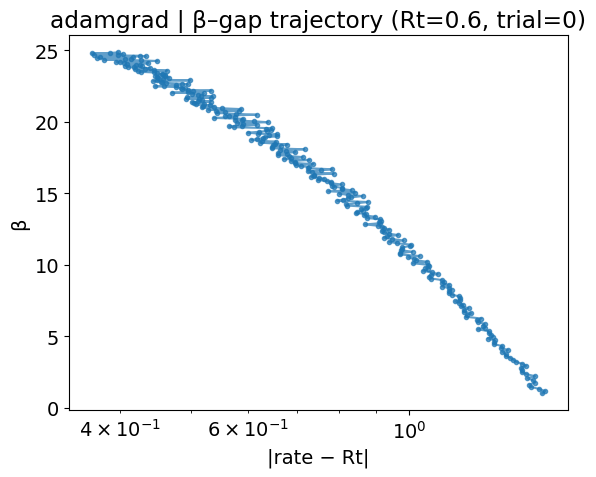

...

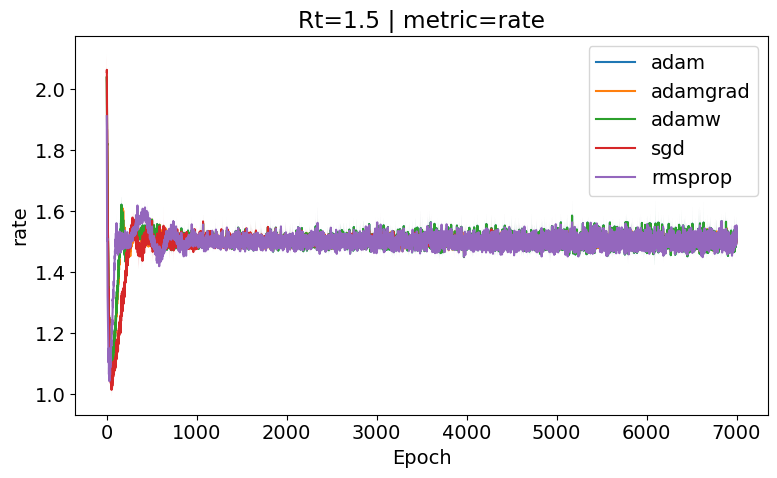

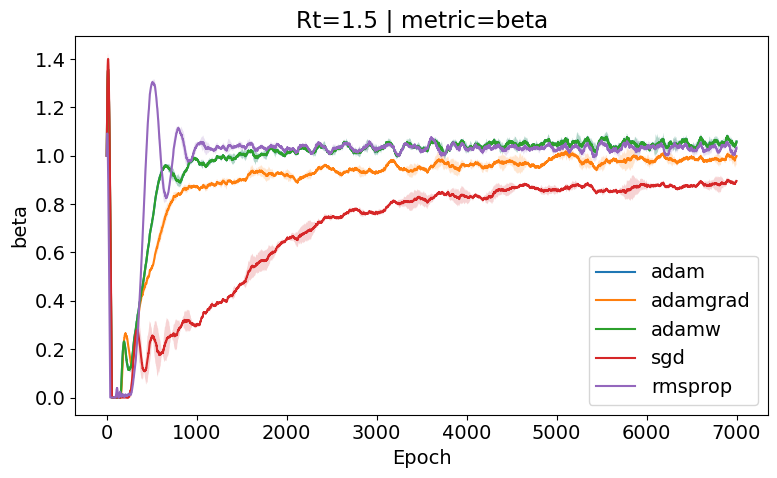

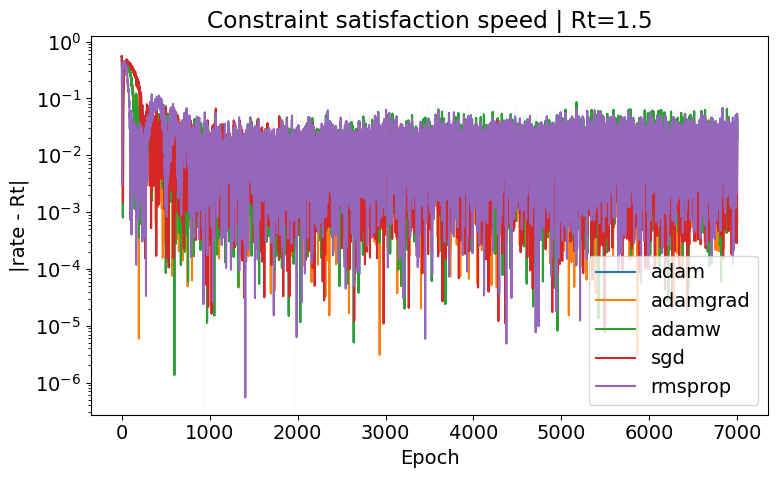

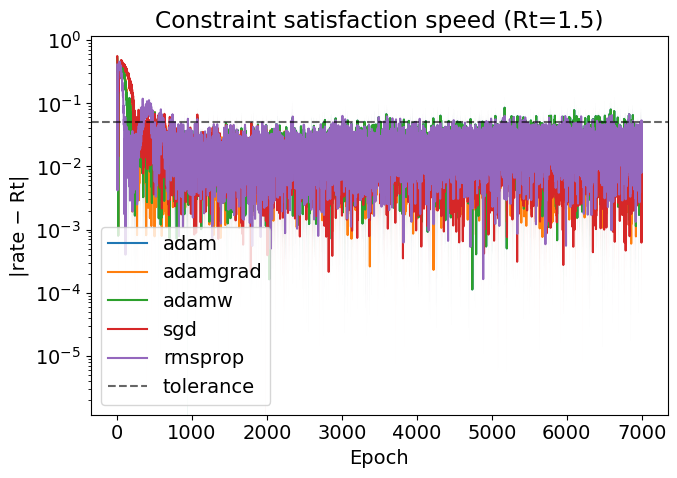

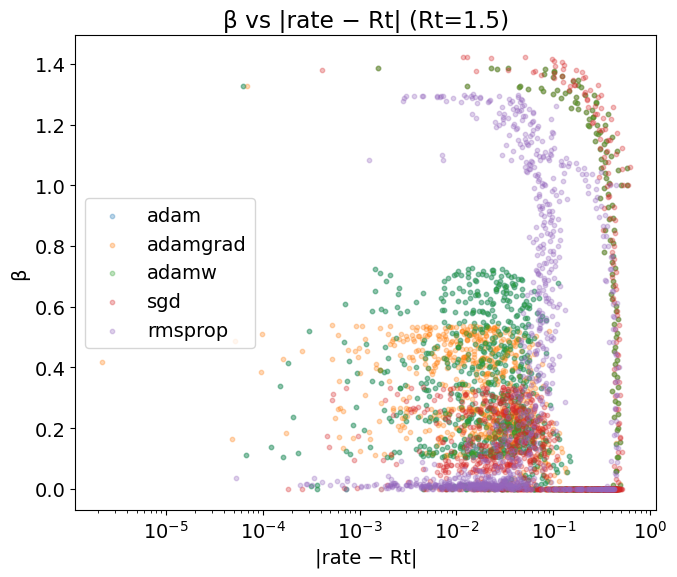

adam 12.5 ± 0.5
adamgrad 12.5 ± 0.5
adamw 12.5 ± 0.5
sgd 13.0 ± 1.0
rmsprop 4.0 ± 0.0
adam: r=-0.189, p=2.0e-112
adamgrad: r=-0.220, p=1.9e-152
adamw: r=-0.189, p=2.0e-112
sgd: r=-0.311, p=7.3e-311
rmsprop: r=-0.154, p=6.1e-75


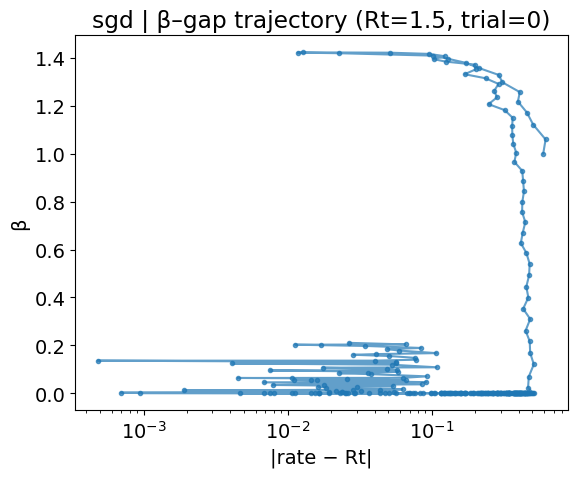

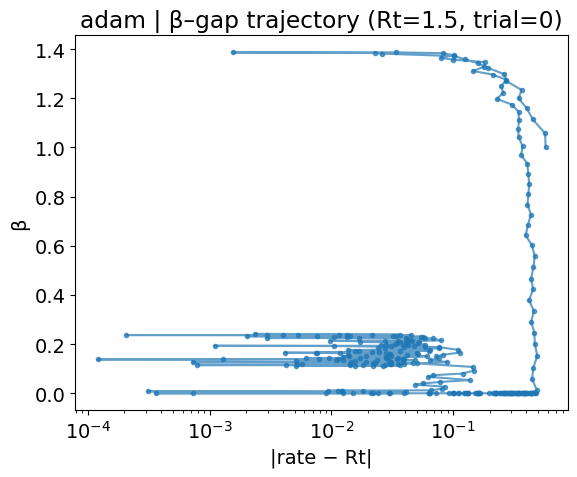

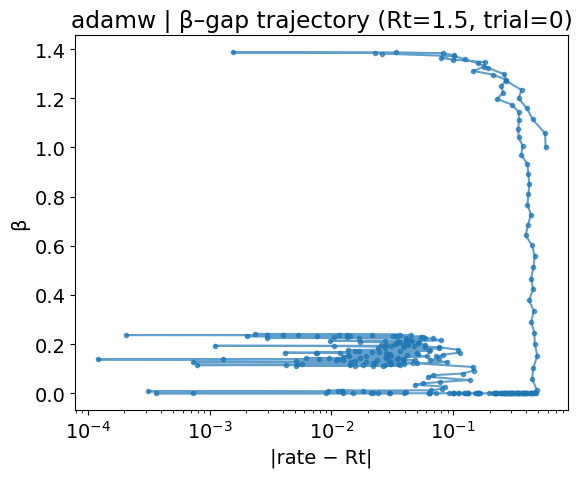

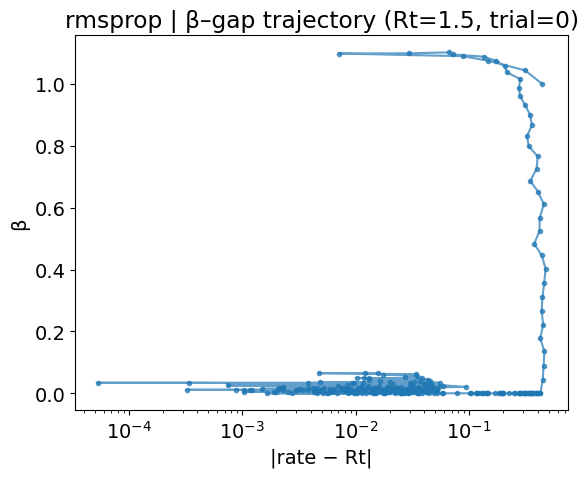

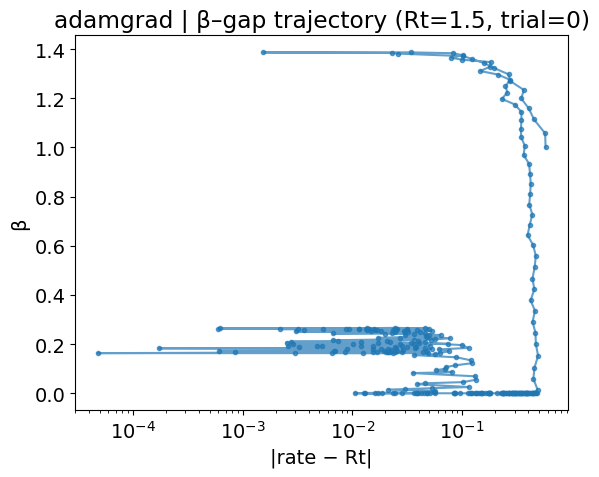

...

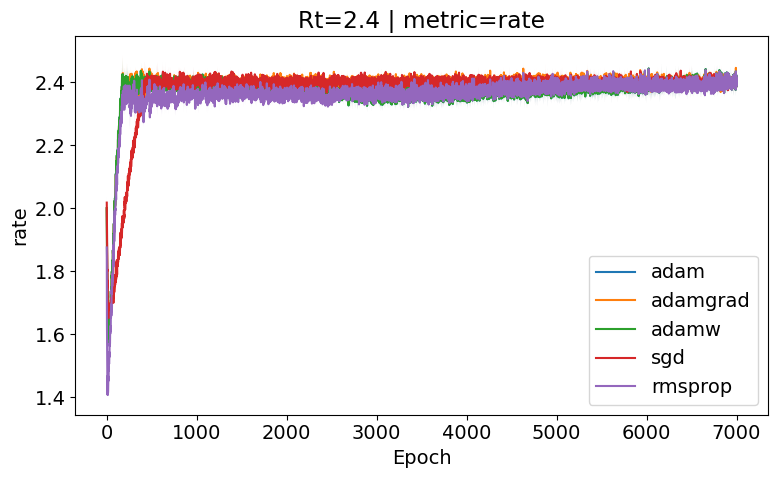

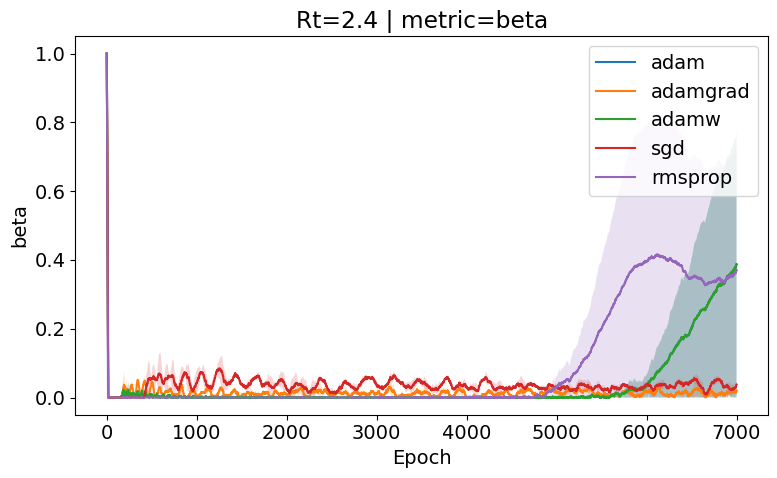

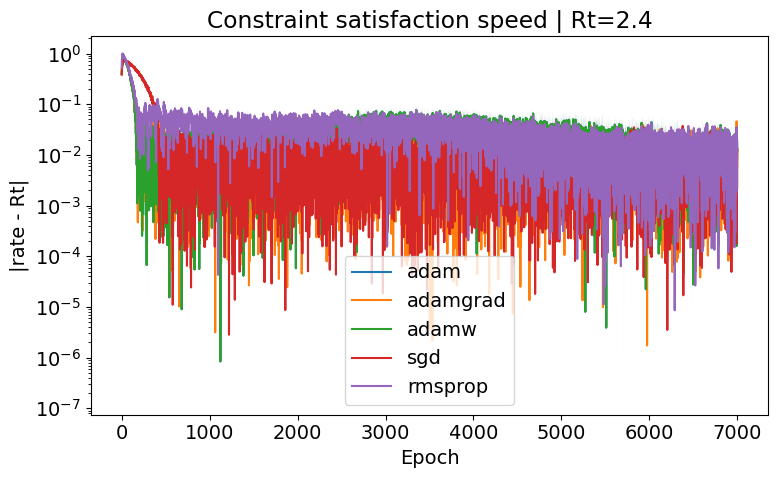

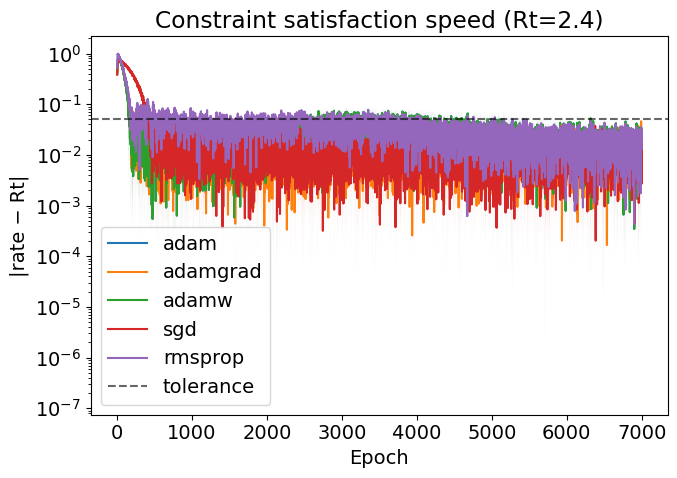

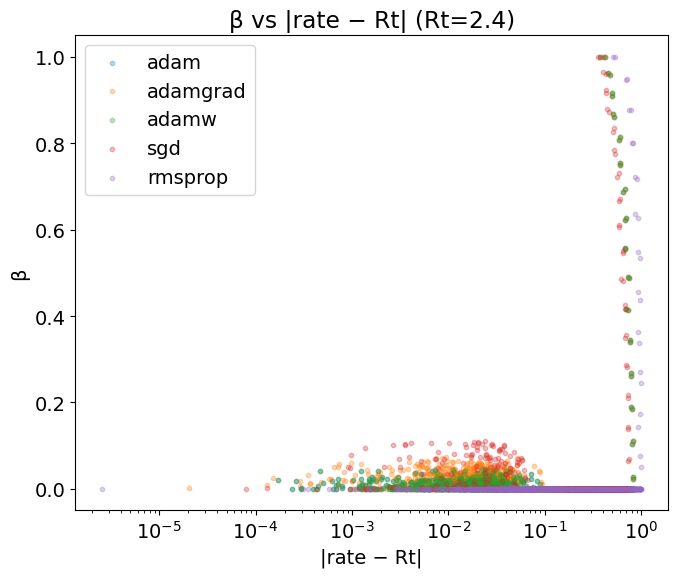

adam 157.5 ± 13.5
adamgrad 159.5 ± 11.5
adamw 157.5 ± 13.5
sgd 381.5 ± 26.5
rmsprop 174.0 ± 13.0
adam: r=-0.124, p=2.3e-49
adamgrad: r=0.111, p=1.1e-39
adamw: r=-0.124, p=2.3e-49
sgd: r=-0.020, p=1.7e-02
rmsprop: r=-0.328, p=0.0e+00


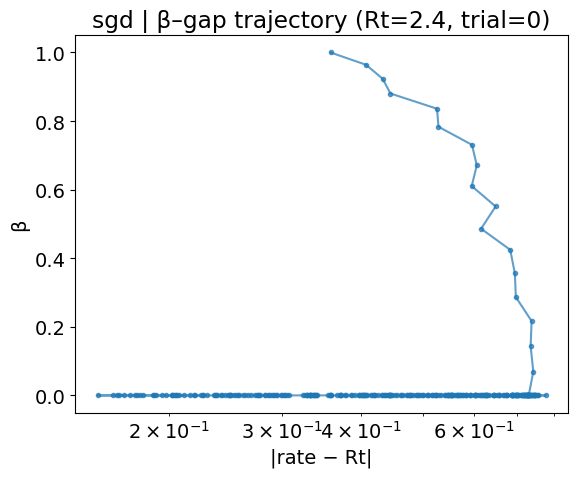

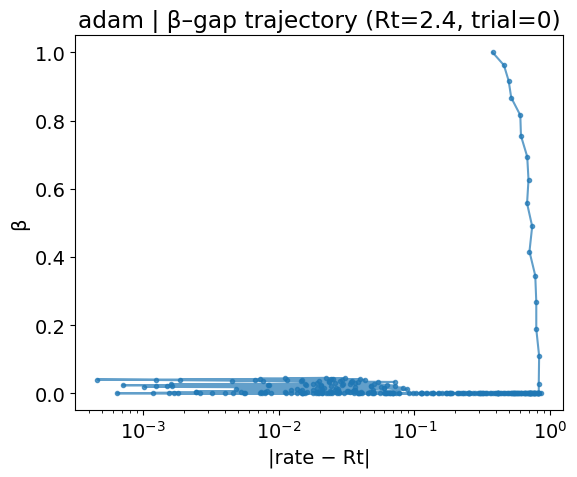

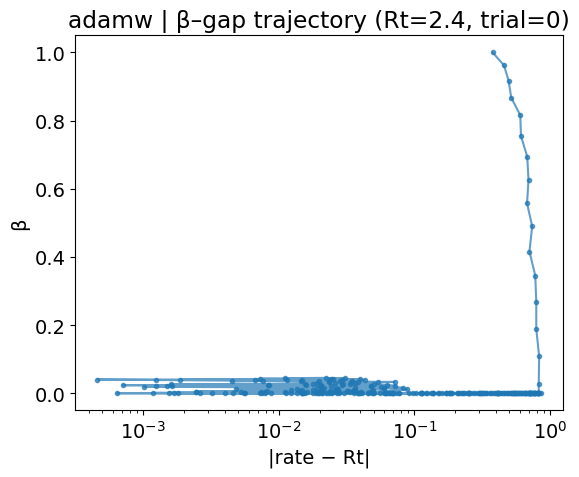

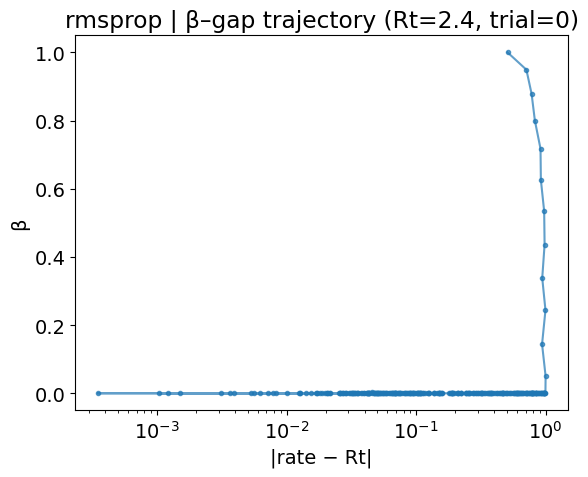

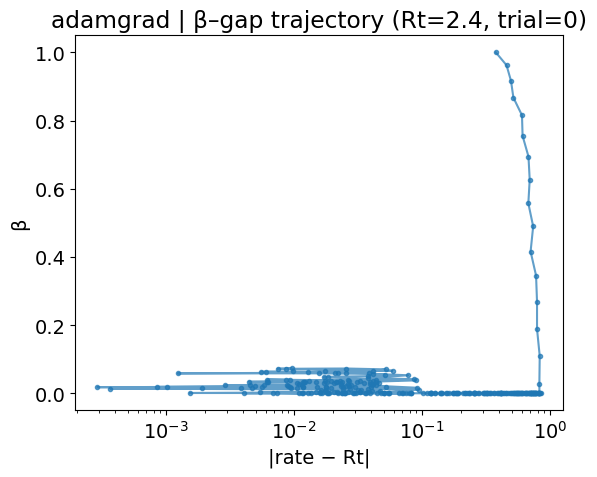

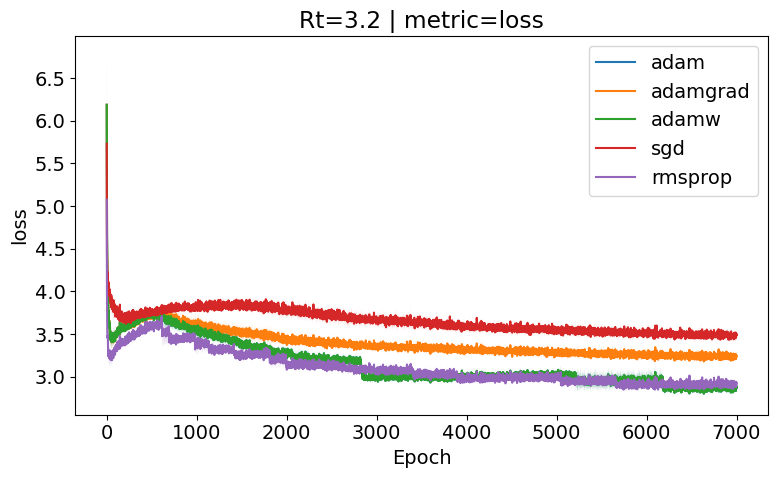

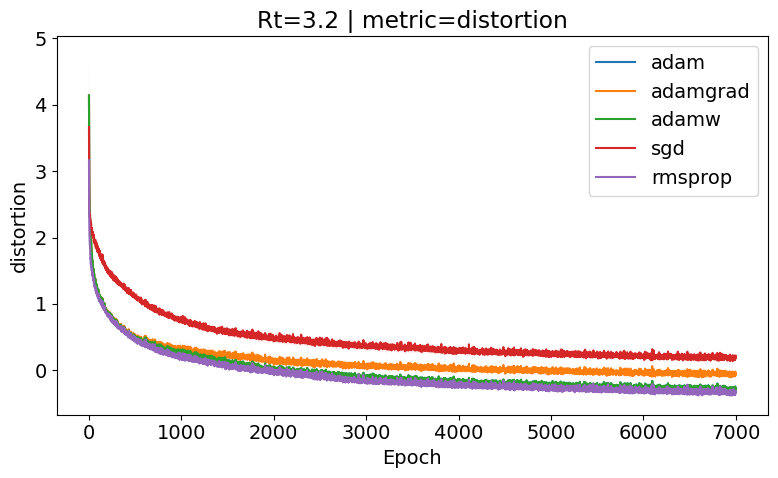

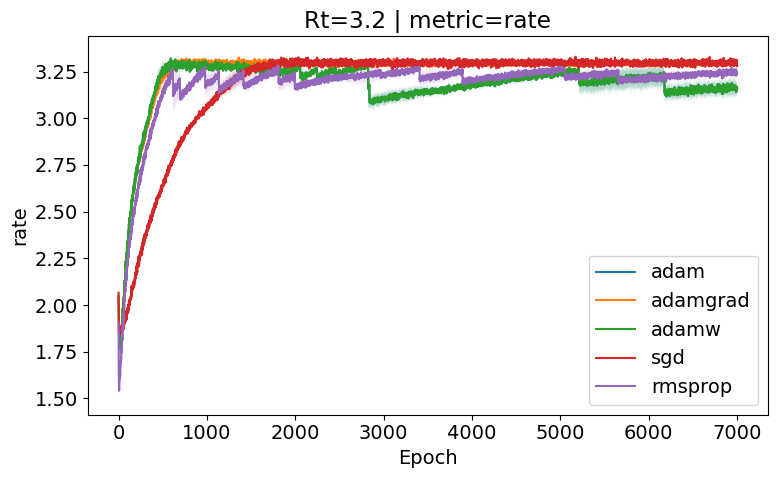

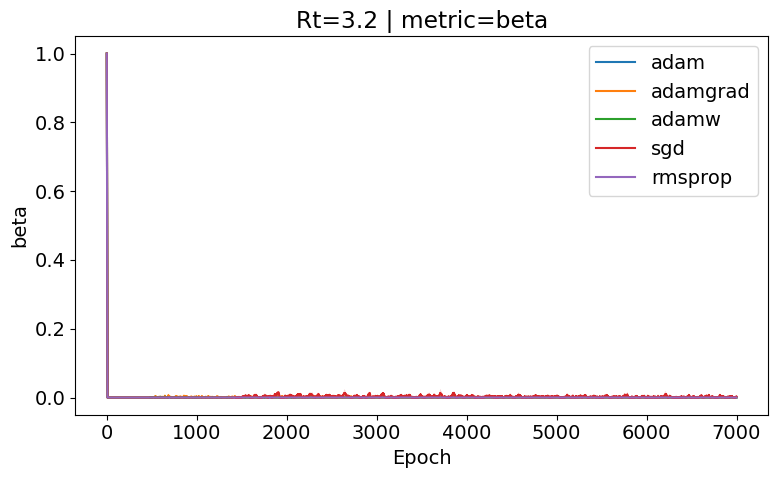

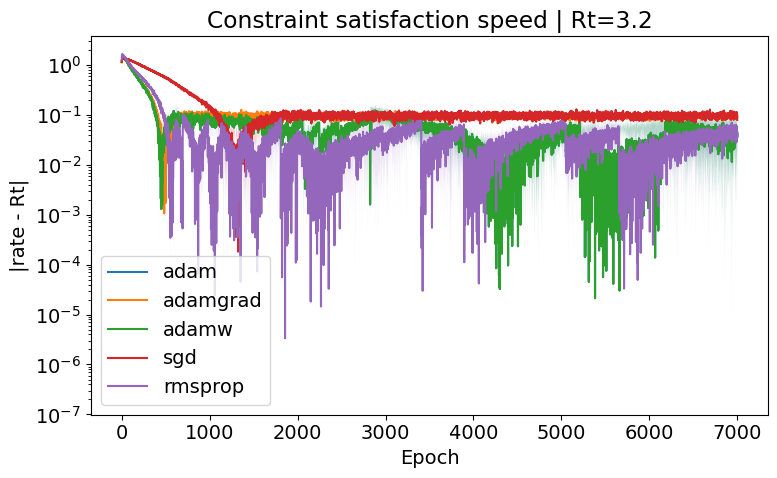

KeyError: 3.2

<Figure size 700x500 with 0 Axes>

In [ ]:
# Draw the plots for a given Rt

PATH = os.getcwd() + f"./data/compare_opts_samples=100_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )


Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 3.2
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

<ipython-input-10-8002f1113ccc>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


optimizers: ['adam', 'adamgrad', 'adamw', 'sgd', 'rmsprop']
example Rts: [0.6, 1.5, 2.4, 3.3]


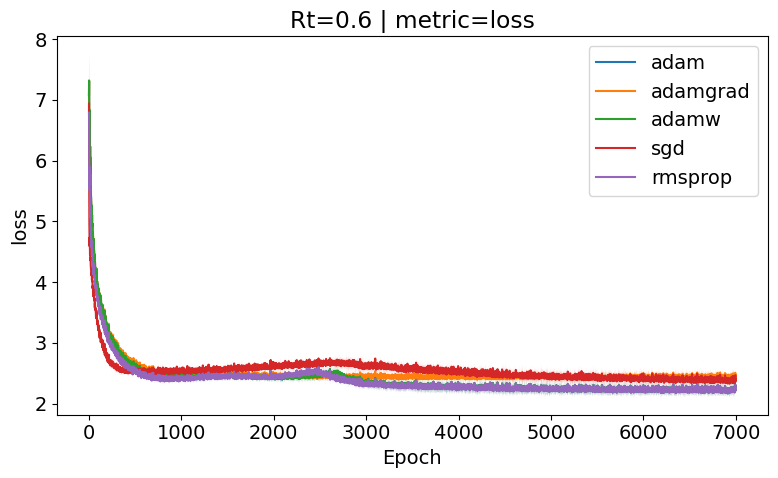

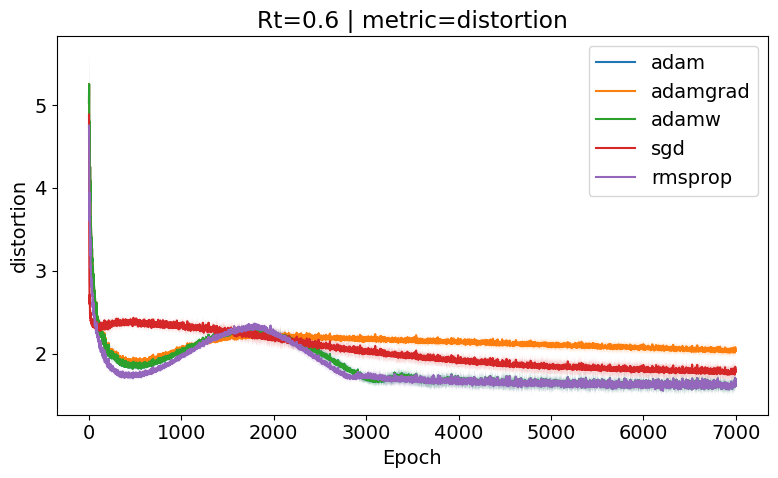

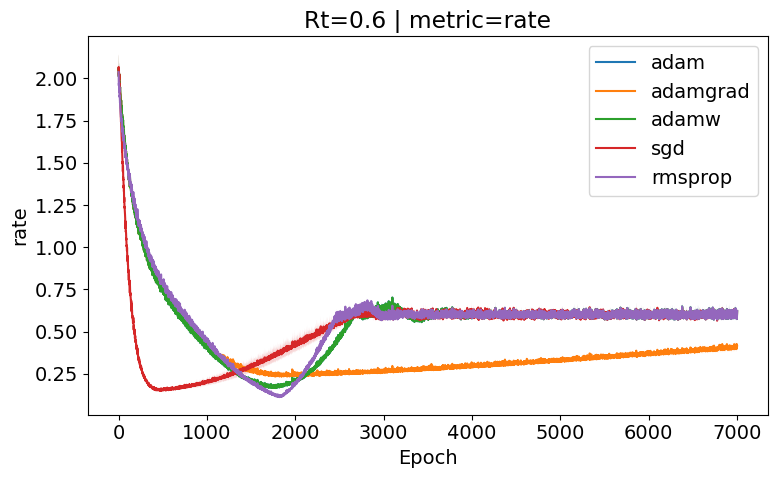

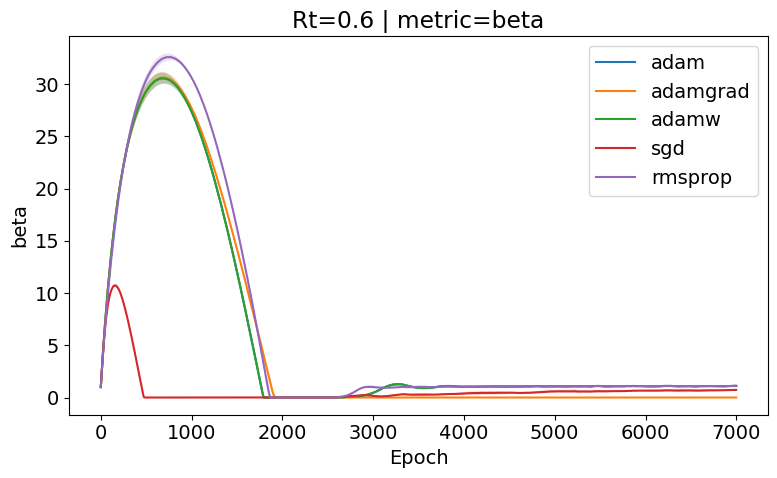

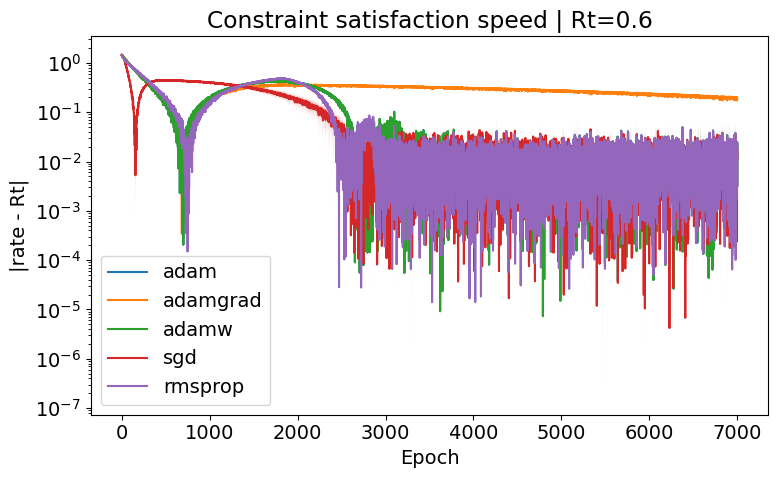

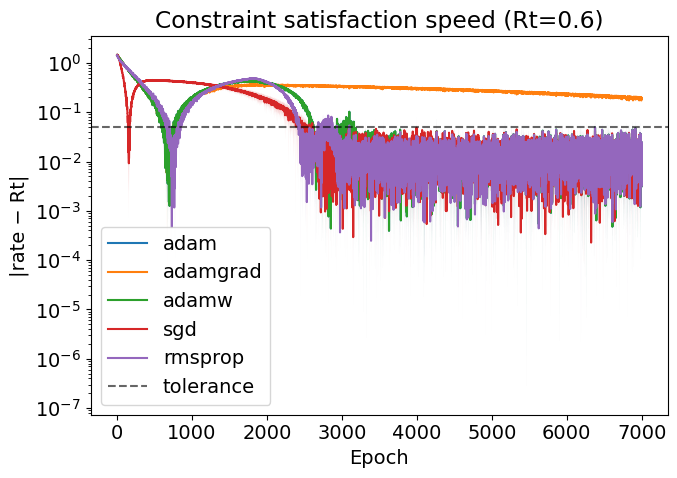

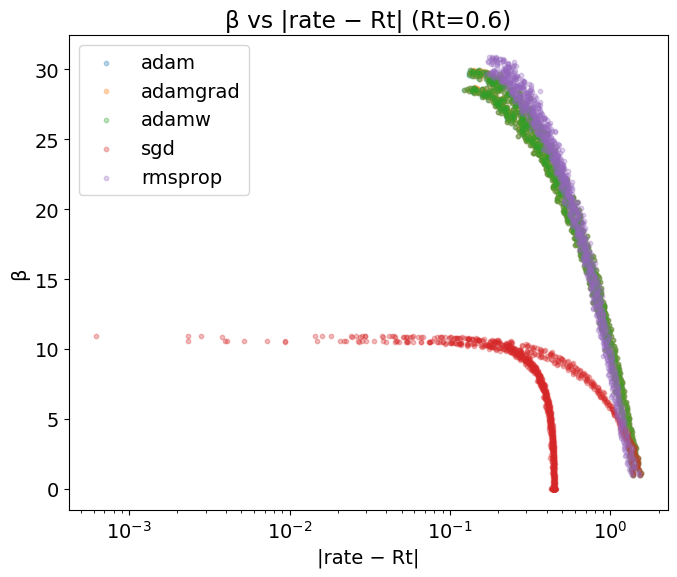

adam 592.0 ± 1.0
adamgrad 592.0 ± 1.0
adamw 592.0 ± 1.0
sgd 142.5 ± 2.5
rmsprop 640.5 ± 1.5
adam: r=0.428, p=0.0e+00
adamgrad: r=-0.447, p=0.0e+00
adamw: r=0.428, p=0.0e+00
sgd: r=0.177, p=1.9e-98
rmsprop: r=0.478, p=0.0e+00


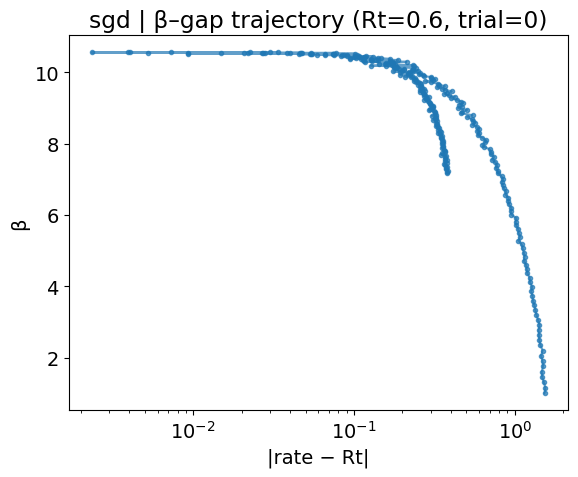

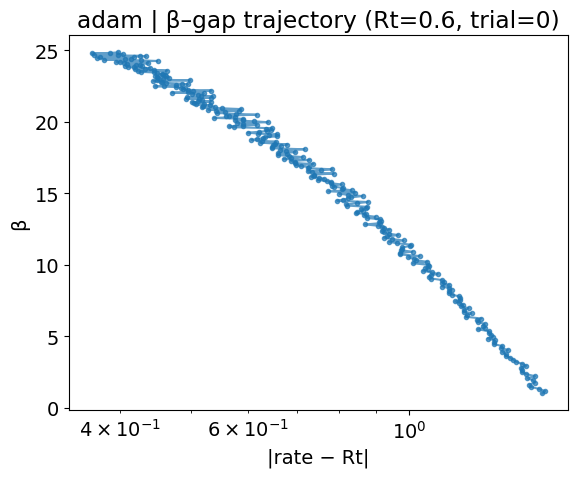

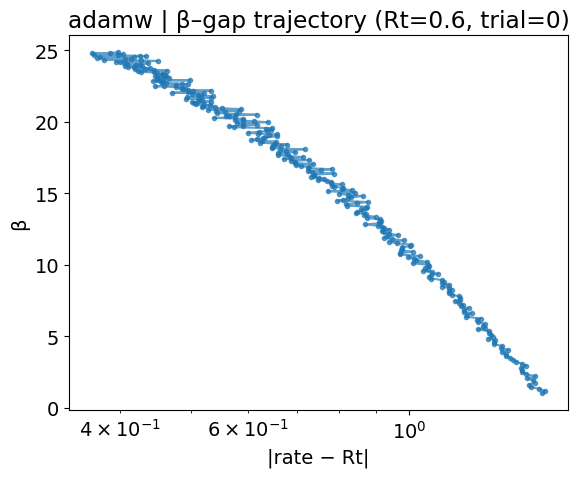

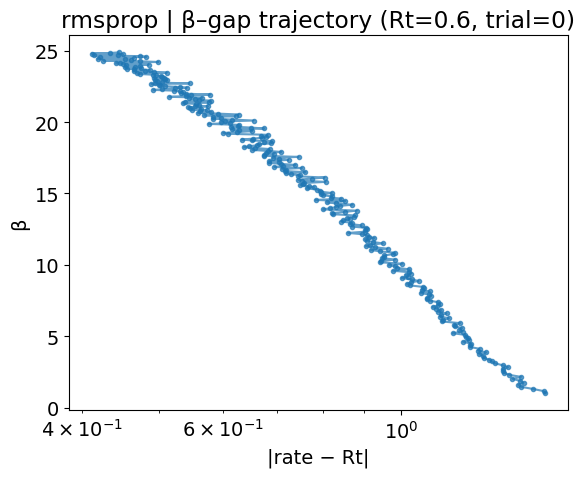

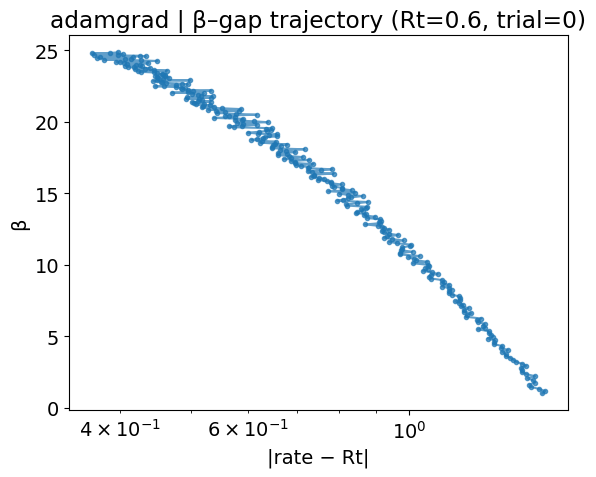

...

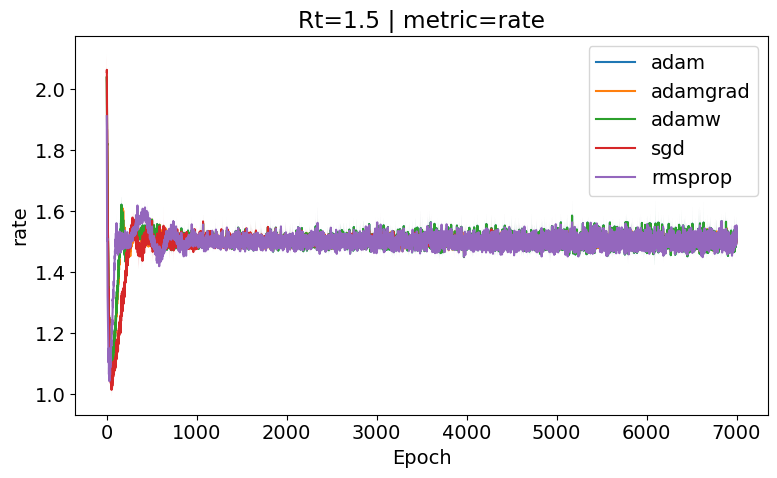

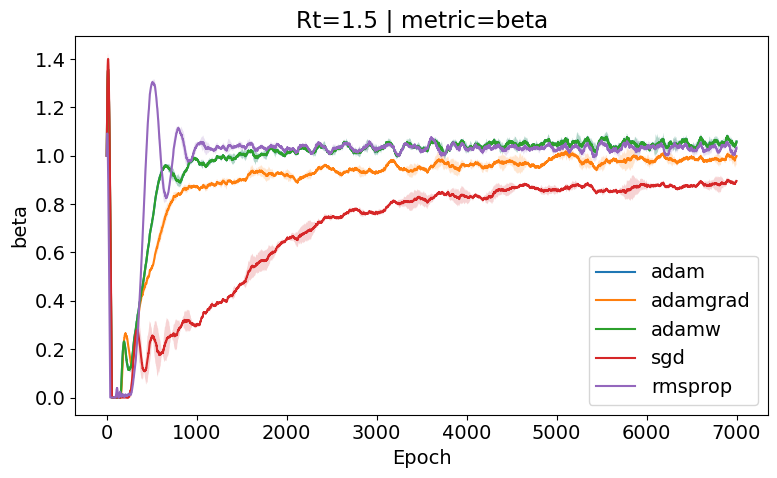

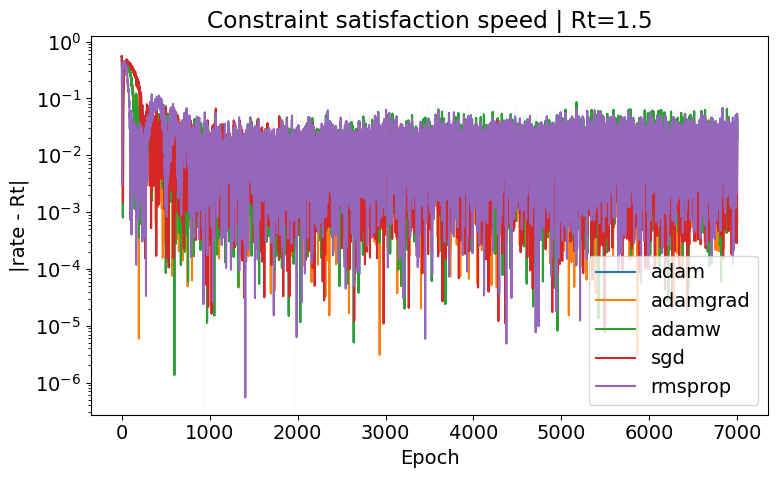

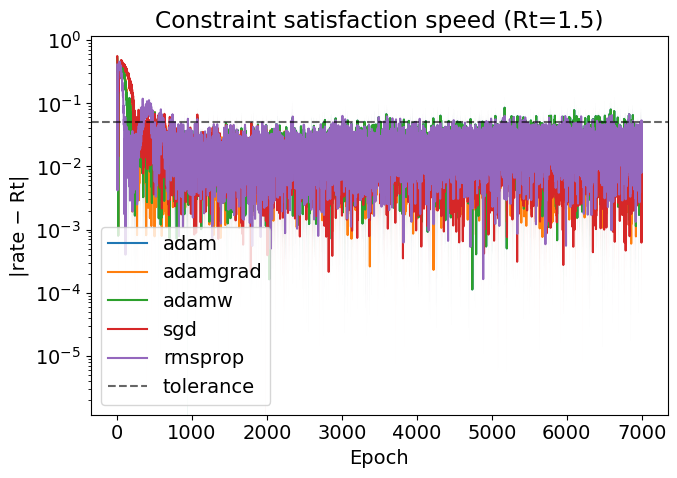

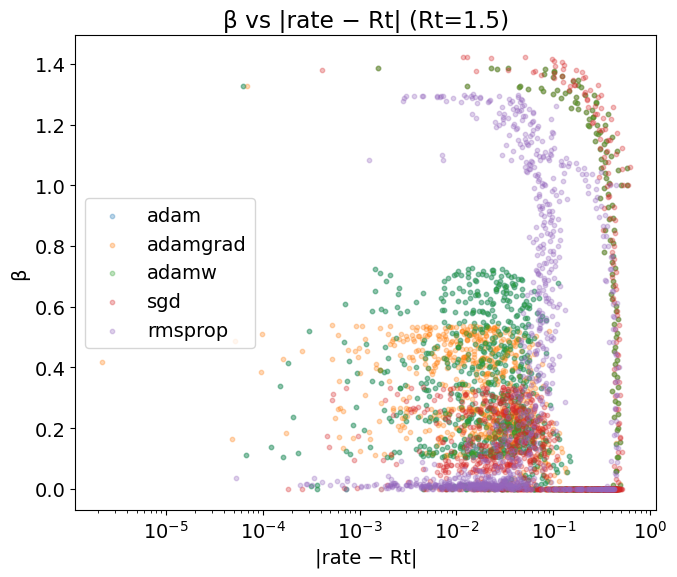

adam 12.5 ± 0.5
adamgrad 12.5 ± 0.5
adamw 12.5 ± 0.5
sgd 13.0 ± 1.0
rmsprop 4.0 ± 0.0
adam: r=-0.189, p=2.0e-112
adamgrad: r=-0.220, p=1.9e-152
adamw: r=-0.189, p=2.0e-112
sgd: r=-0.311, p=7.3e-311
rmsprop: r=-0.154, p=6.1e-75


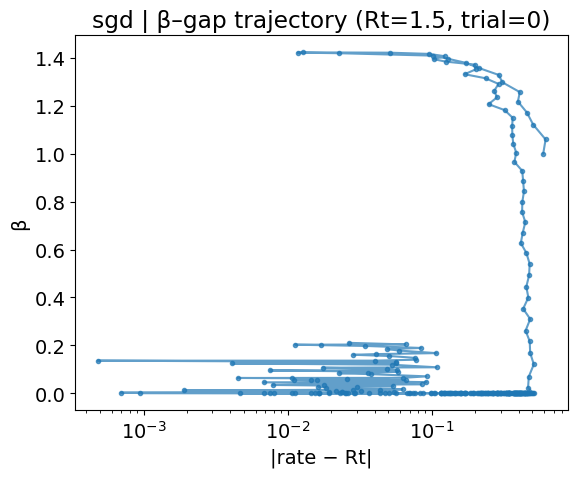

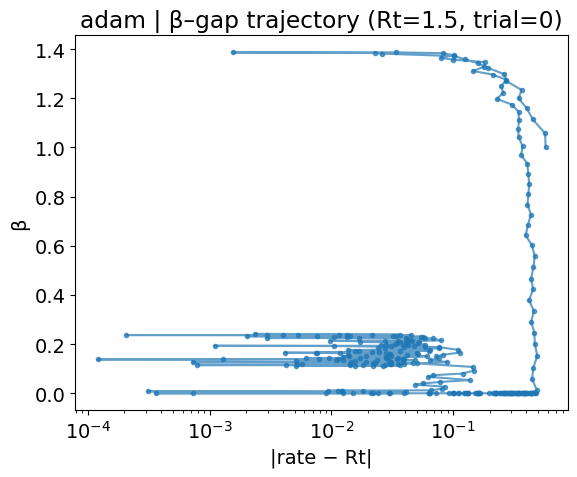

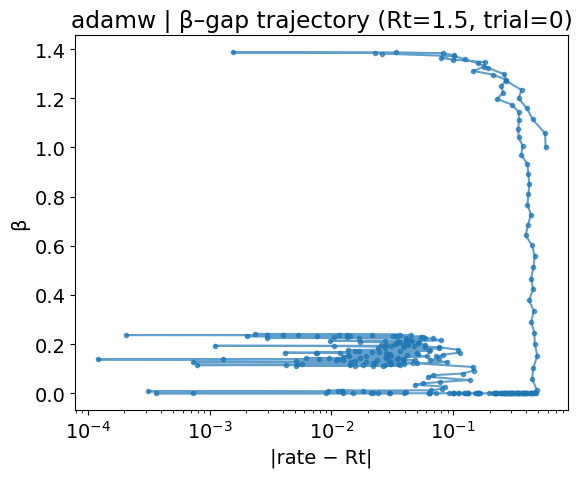

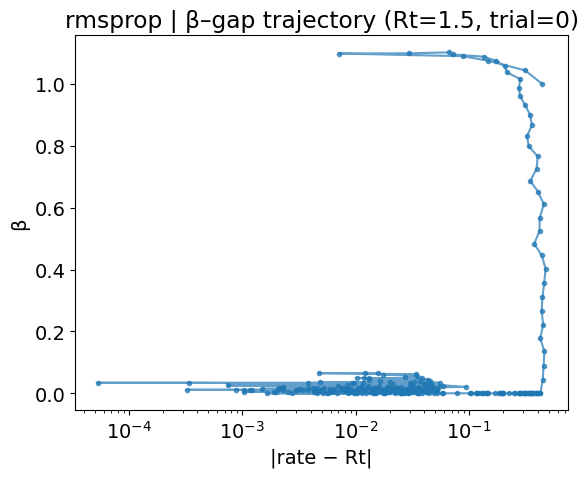

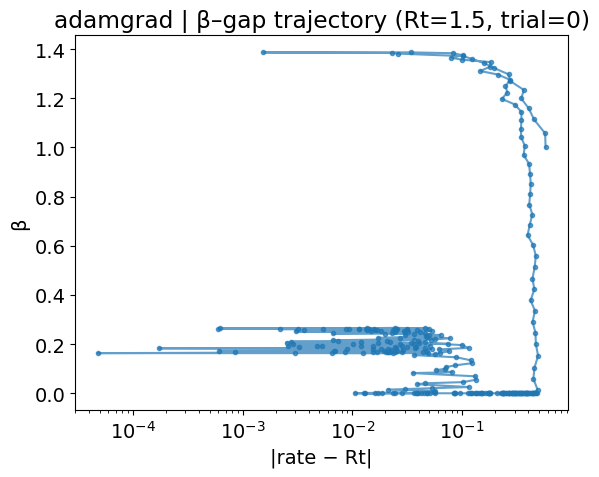

...

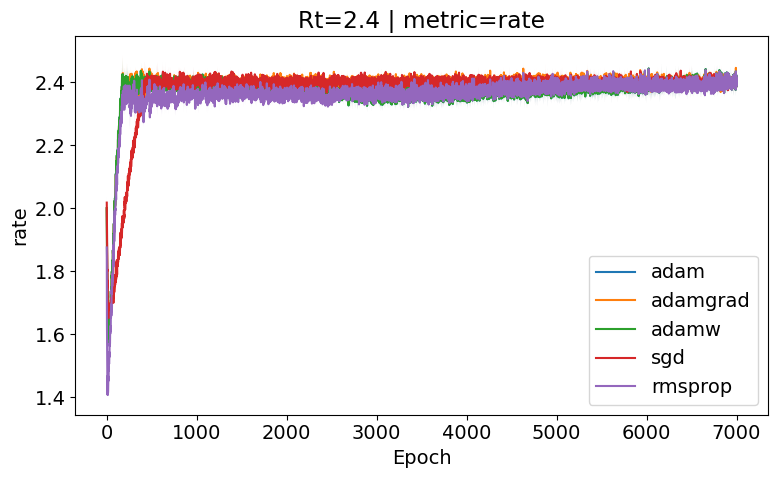

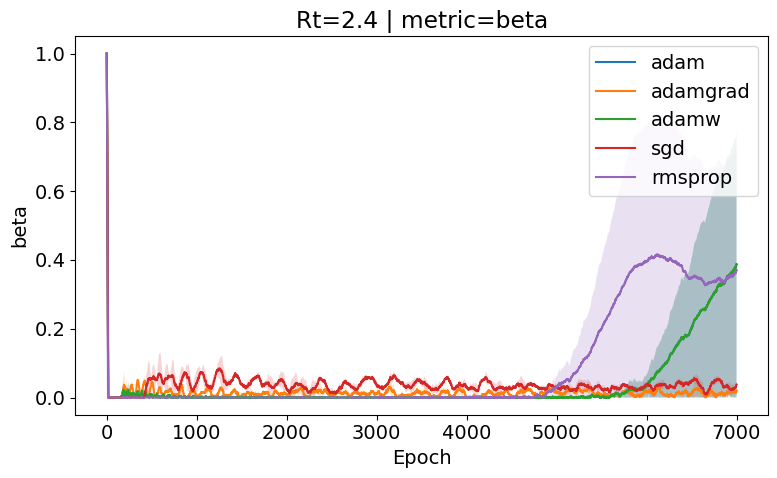

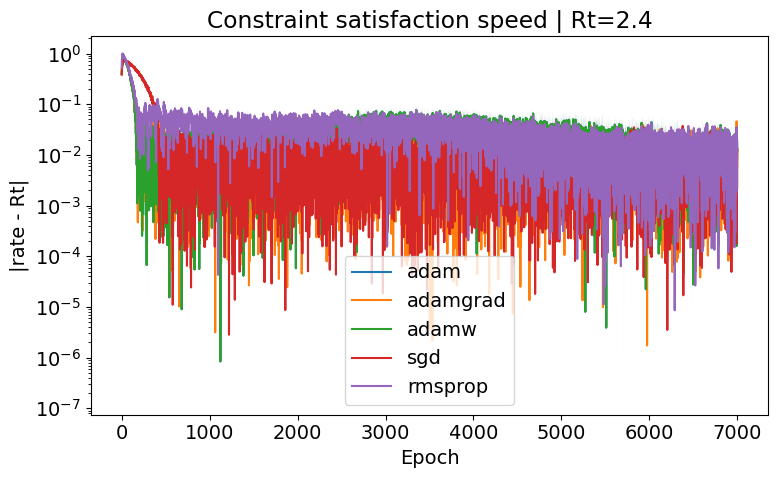

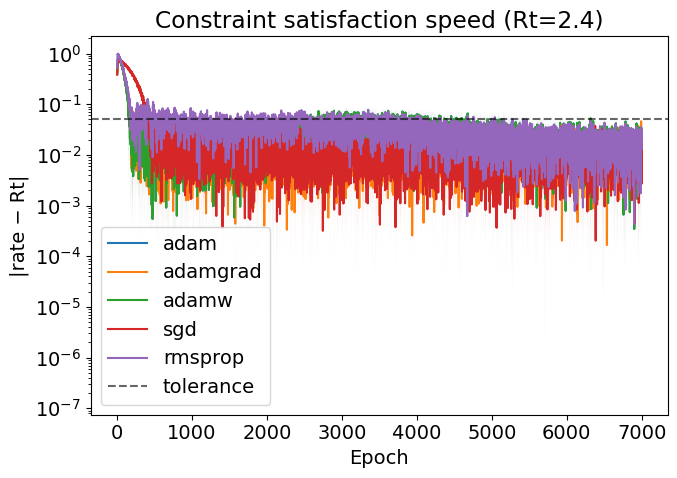

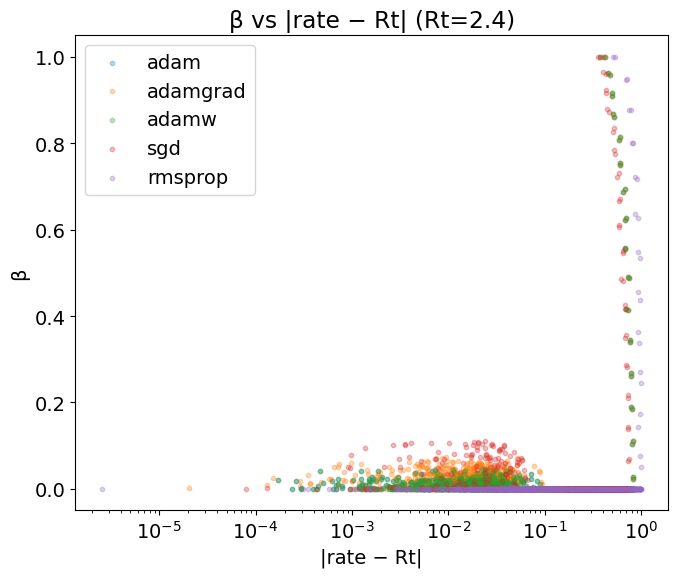

adam 157.5 ± 13.5
adamgrad 159.5 ± 11.5
adamw 157.5 ± 13.5
sgd 381.5 ± 26.5
rmsprop 174.0 ± 13.0
adam: r=-0.124, p=2.3e-49
adamgrad: r=0.111, p=1.1e-39
adamw: r=-0.124, p=2.3e-49
sgd: r=-0.020, p=1.7e-02
rmsprop: r=-0.328, p=0.0e+00


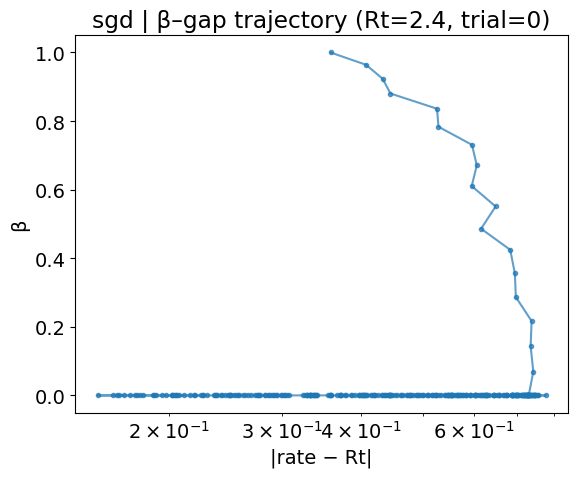

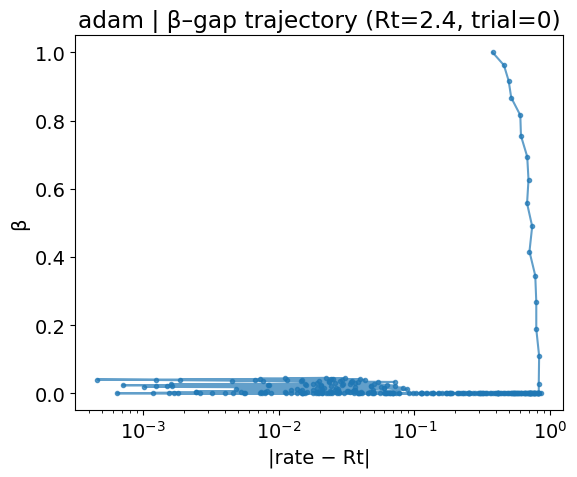

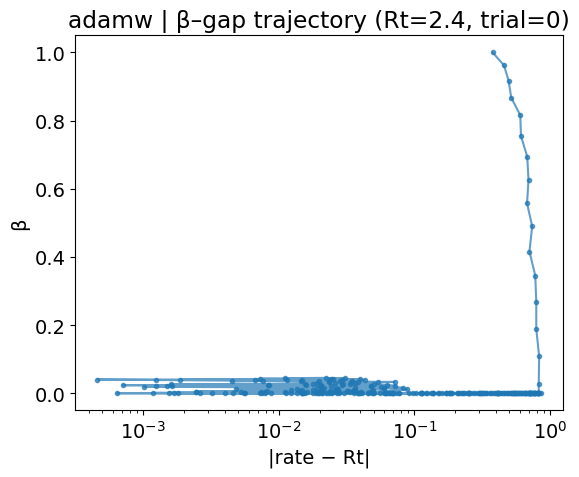

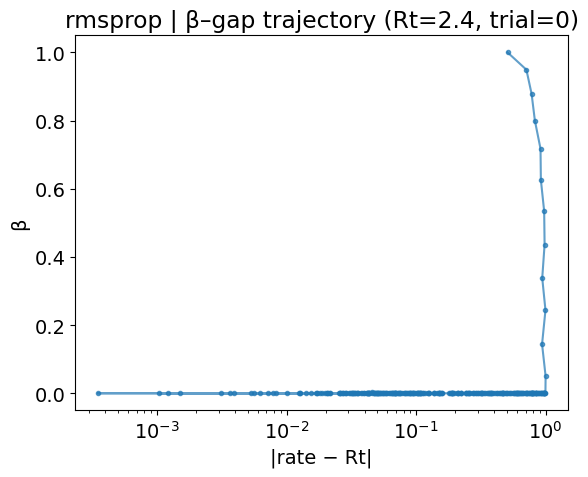

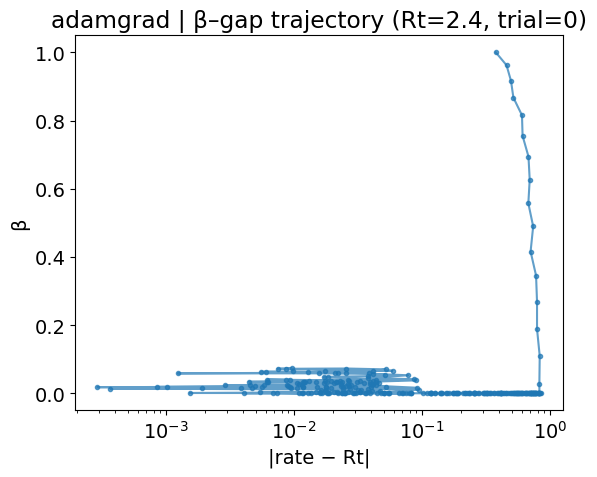

...

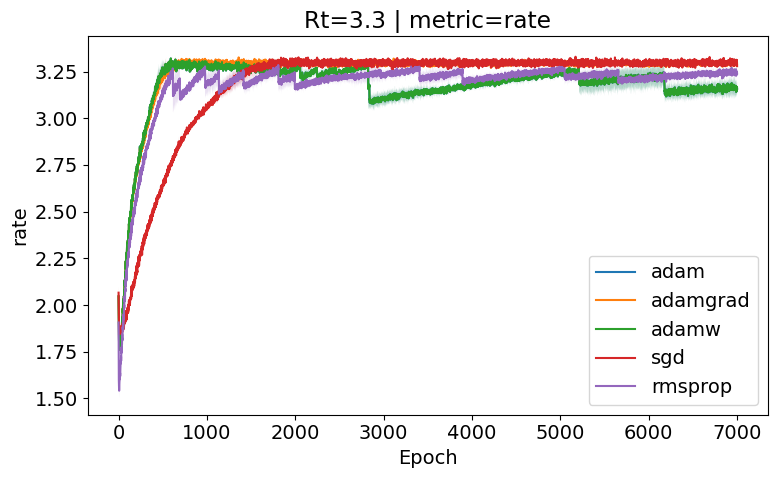

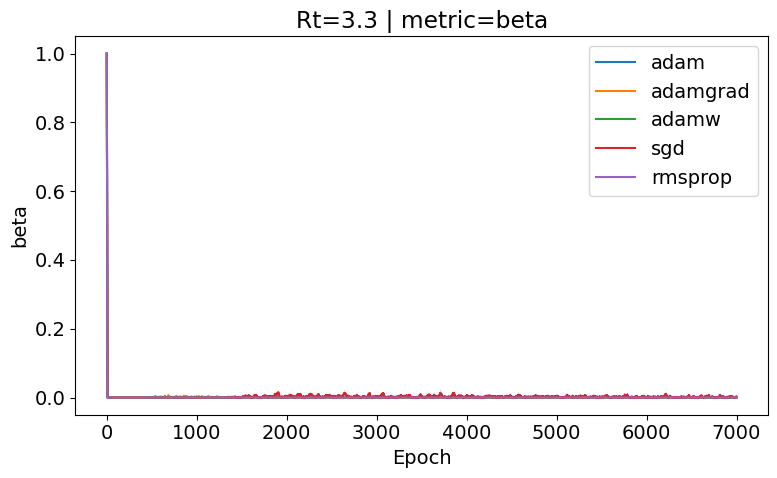

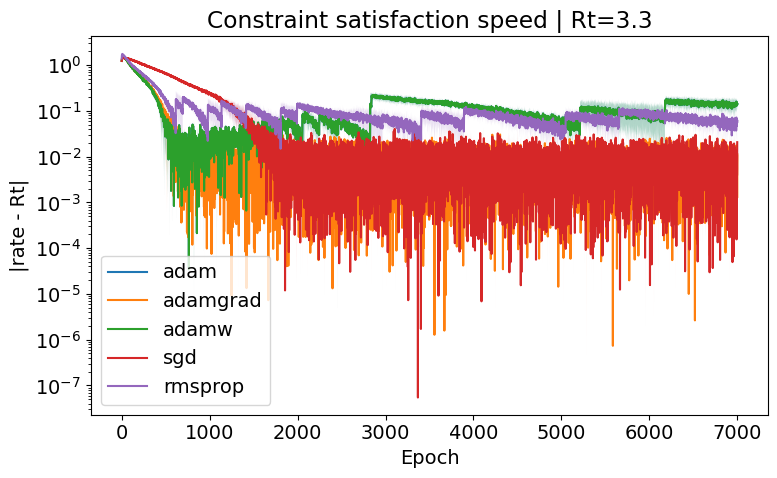

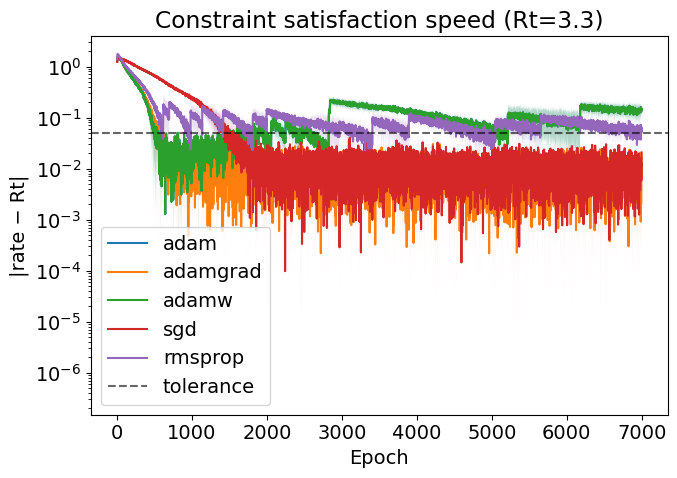

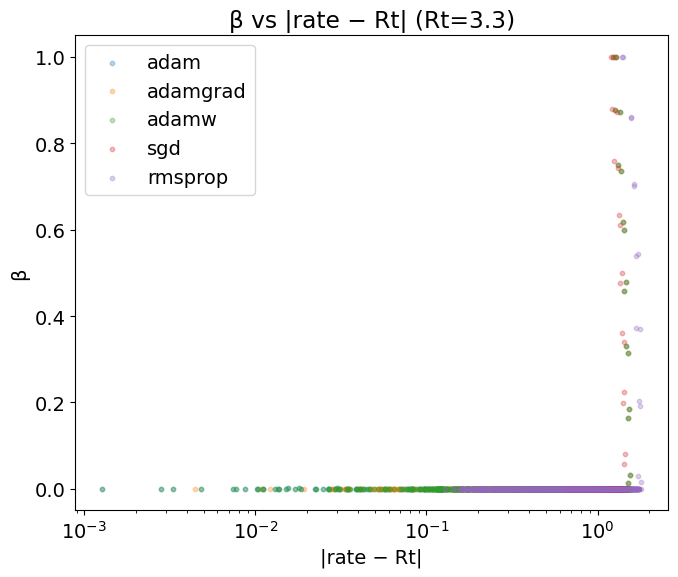

adam 478.0 ± 36.0
adamgrad 522.0 ± 69.0
adamw 478.0 ± 36.0
sgd 1386.5 ± 100.5
rmsprop 598.5 ± 37.5
adam: r=0.078, p=2.7e-20
adamgrad: r=0.089, p=6.6e-26
adamw: r=0.078, p=2.7e-20
sgd: r=0.026, p=1.9e-03
rmsprop: r=0.098, p=2.3e-31


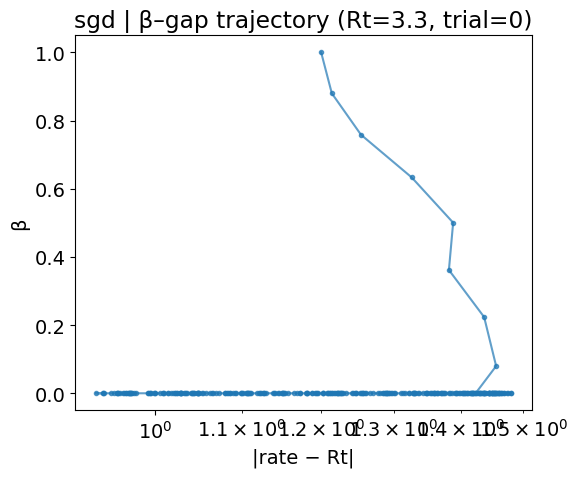

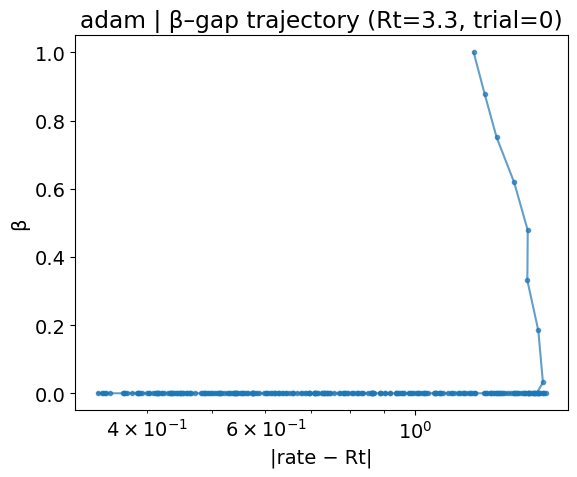

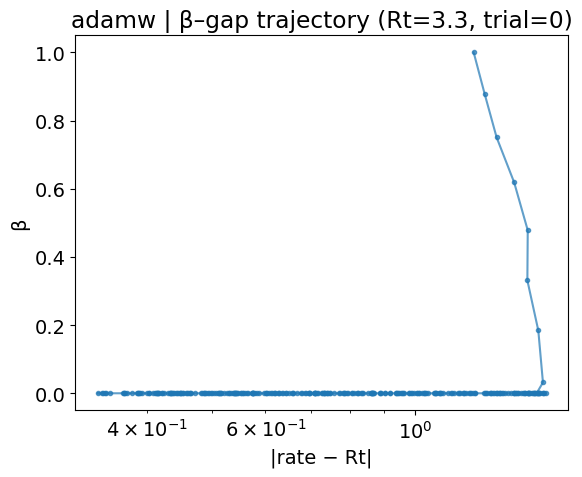

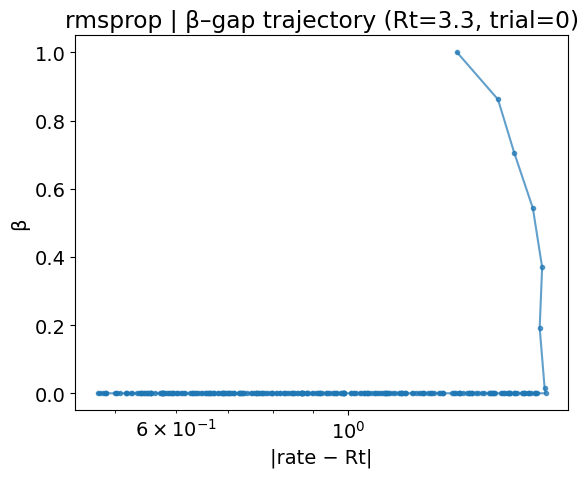

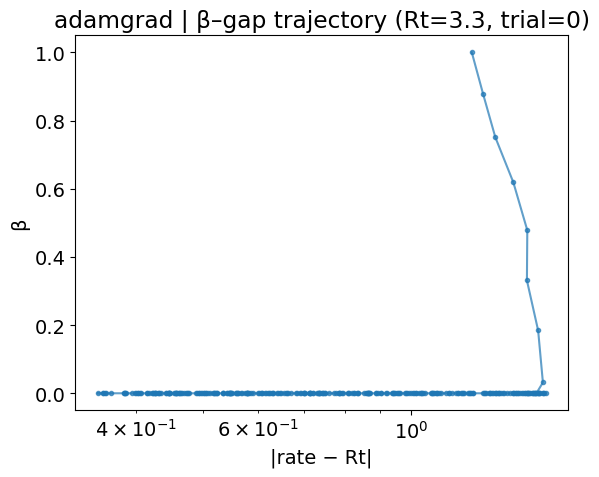

...

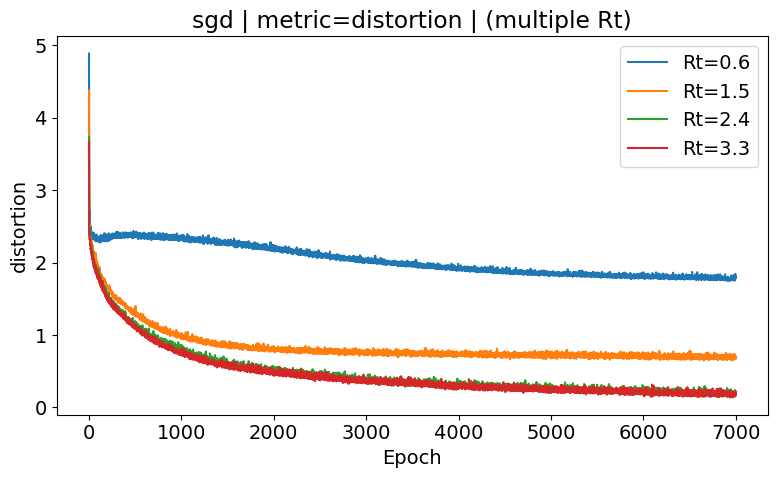

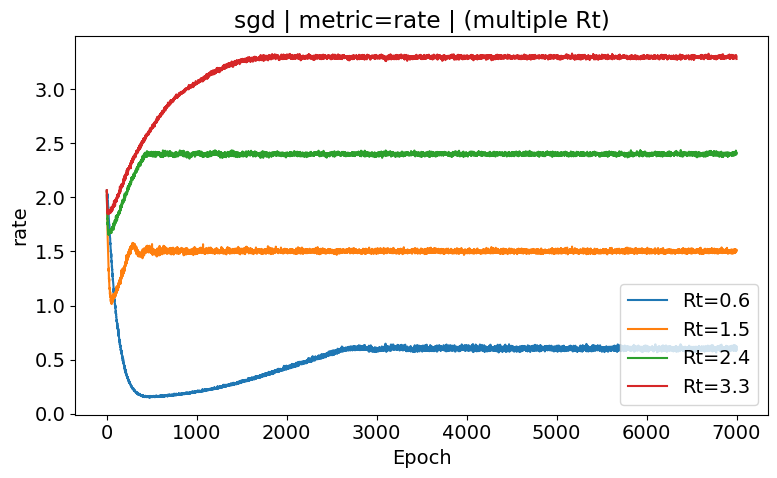

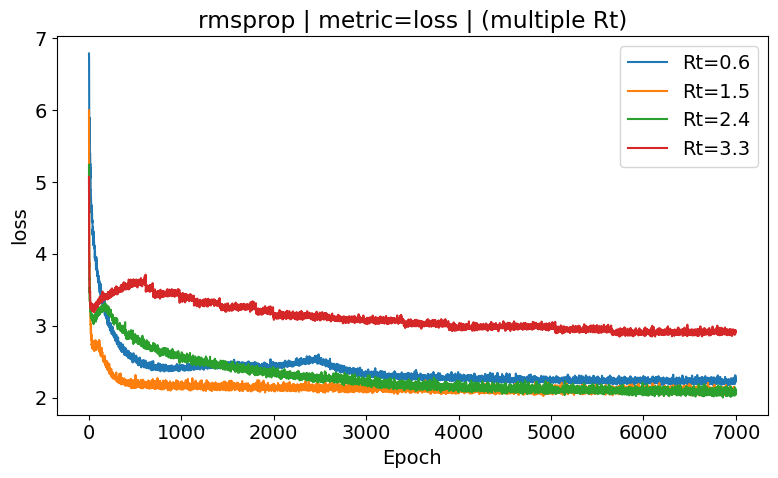

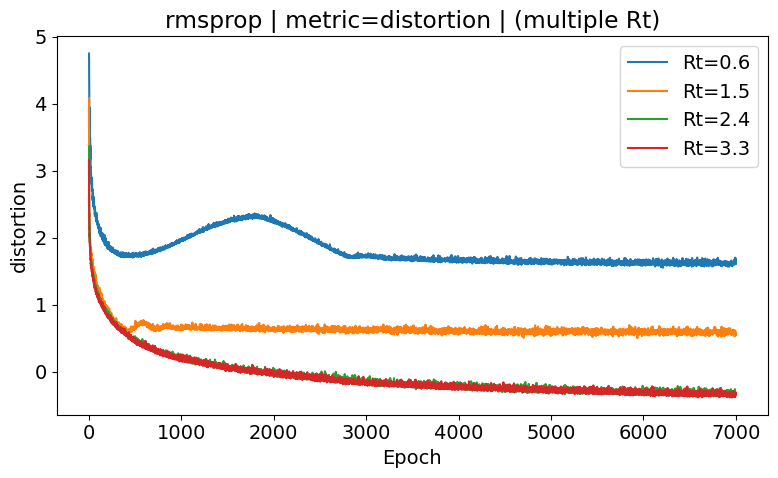

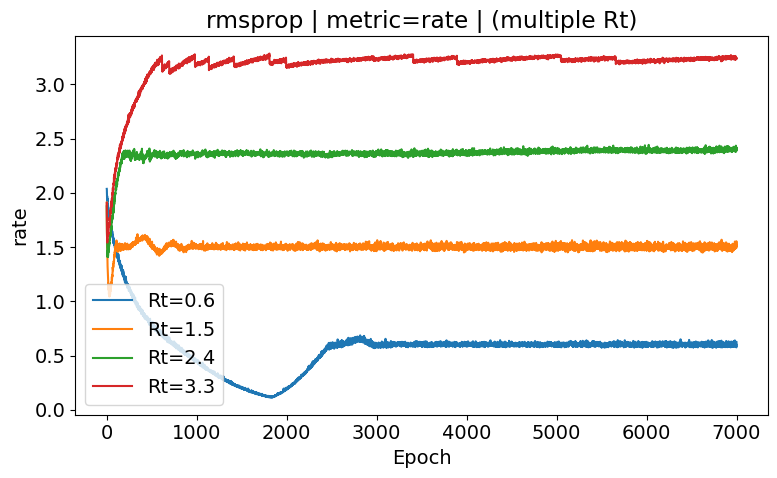

In [ ]:
# Draw the plots for a given Rt

PATH = os.getcwd() + f"./data/compare_opts_samples=100_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )


Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

Rt = 3.3
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

for opt in optimizers:
    plot_beta_gap_trajectory(
        all_results,
        Rt=Rt,
        optimizer=opt,
        trial_idx=trial_idx,
        max_epochs=300   # 초반 dynamics만 보고 싶을 때
    )

# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)

In [ ]:
def train_Rt(enc,dec,q,x_data,x_test,opt,Rt,N_EPOCHS=500,lr_b = 0.1):
    # Train parameters of VAE (enc + dec) stored in opt at a given target rate
    # by minimizing -ELBO (D+R).
    history = { "loss" : [],
                "distortion" : [],
                "rate" : [],
                "beta" : [1] ,
                "distortion_test" : [],
                "rate_test" : []}

    for e in range(N_EPOCHS):
        lav = dav = rav = 0
        beta = history["beta"][-1]
        for x_ in x_data:
            rate = q(enc,x_)
            distortion = distortion_analytical_linear(x_,enc,dec,q.r_all)
            loss =  distortion +beta*rate
            opt.zero_grad()
            loss.backward()
            opt.step()
            lav += distortion + rate
            dav += distortion
            rav += rate
            if torch.isnan(loss):
                break;
        history["loss"].append(lav.item()/len(x_data))
        history["rate"].append(rav.item()/len(x_data))
        history["distortion"].append(dav.item()/len(x_data))
        
        #Update constraint
        beta += lr_b*(history["rate"][-1]-Rt)
        beta = beta if beta>0 else 0
        history["beta"].append(beta)
        if not e % 100:
            # Test decoder on larger set of stimuli
            history["distortion_test"].append(distortion_analytical_linear(x_test,enc,dec,q.r_all).mean().item())
            history["rate_test"].append(q(enc,x_test).mean().item())
        print(f'Epoch: {e} ||Rate: {history["rate"][-1]}||',
            f'ELBO:{history["loss"][-1]}||',
            f'Distortion: {history["distortion"][-1]}||Beta = {history["beta"][-1]}')
    history["beta"].pop()
    return history

def vary_R(RtVec, x_test, p_x, optimizer_name="adamw"):
    resume = {}

    # ✅ 샘플링은 반드시 결과를 변수에 받기
    with torch.no_grad():
        x_samples = p_x.sample((N_SAMPLES,))[:, None].to(device)

    x_sorted, _ = x_samples.sort(dim=0)

    # 🔑 NumPy/encoder용은 CPU로
    x_sorted_cpu = x_sorted.detach().cpu()

    x_min, x_max = x_sorted_cpu[0].item(), x_sorted_cpu[-1].item()

    x_data = DataLoader(x_samples, batch_size=BATCH_SIZE, shuffle=True)

    for Rt in RtVec:
        lr = 1e-4 if Rt < 1.5 else 1e-3
        print(f"Rate = {Rt} || lr = {lr}")
        enc = BernoulliEncoder(
                N,
                x_min - 1,
                x_max + 1,
                x_sorted_cpu,   # 🔑 CPU tensor
                w=2
            ).to(device)

        #enc = BernoulliEncoder(N, x_min-1, x_max+1, x_sorted, w=2).to(device)
        dec = MLPDecoder(N, M).to(device)
        q = rate_ising(N).to(device)

        # 🔥 핵심: r_all 같은 상수 텐서도 같이 이동
        if hasattr(q, "r_all"):
            q.r_all = q.r_all.to(device)

        q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        #q = rate_ising(N).to(device)
        #q.J.register_hook(lambda grad: grad.fill_diagonal_(0))

        params = list(enc.parameters()) + list(dec.parameters()) + list(q.parameters())
        opt = make_optimizer(optimizer_name, params, lr)
        print("Optimizer:", optimizer_name, "| class:", opt.__class__)

        history = train_Rt(enc, dec, q, x_data, x_test, opt, Rt,
                           N_EPOCHS=N_EPOCHS, lr_b=0.1)

        resume[Rt] = {
            'encode': enc.state_dict(),
            'decoder': dec.state_dict(),
            'q': q.state_dict(),
            'history': history,
            'lr': lr
        }
    return resume

def make_optimizer(opt_name, params, lr, weight_decay=0.0):
    opt_name = opt_name.lower()

    if opt_name == "adam":
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay)

    if opt_name == "adamw":
        return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

    # "AdamGrad"는 보통 AMSGrad를 의미하는 경우가 많아서 이렇게 구현
    if opt_name in ["adamgrad", "amsgrad"]:
        return torch.optim.Adam(params, lr=lr, weight_decay=weight_decay, amsgrad=True)

    if opt_name == "sgd":
        # (권장) momentum 사용. nesterov는 취향.
        return torch.optim.SGD(params, lr=lr, momentum=0.9, nesterov=True, weight_decay=weight_decay)

    if opt_name == "rmsprop":
        return torch.optim.RMSprop(params, lr=lr, alpha=0.99, momentum=0.0, weight_decay=weight_decay)

    raise ValueError(f"Unknown optimizer: {opt_name}")

# ---------------------------
# Load
# ---------------------------
def load_results(path):
    obj = torch.load(path, map_location="cpu")
    # 기대: dict(optimizer -> list(trials))
    return obj

# ---------------------------
# Helpers
# ---------------------------
def convergence_epoch(history, Rt, tol=0.05):
    rate = np.array(history["rate"])
    gap = np.abs(rate - Rt)
    idx = np.where(gap < tol)[0]
    if len(idx) == 0:
        return np.inf
    return idx[0]


def _sorted_Rts_from_results(all_results, optimizer=None):
    if optimizer is None:
        optimizer = list(all_results.keys())[0]
    trial0 = all_results[optimizer][0]
    rts = list(trial0.keys())
    rts = [float(r) for r in rts]
    return sorted(rts)

def _get_history(all_results, optimizer, trial_idx, Rt):
    trial = all_results[optimizer][trial_idx]
    keys = [float(k) for k in trial.keys()]
    Rt = float(Rt)
    closest = min(keys, key=lambda x: abs(x - Rt))
    entry = trial[closest]
    return entry["history"]

def _history_to_array(hist, metric):
    arr = np.array(hist[metric], dtype=float)
    return arr

def aggregate_metric(all_results, optimizer, Rt, metric):
    """Return epochs, mean, std across trials for a metric at a given Rt."""
    n_trials = len(all_results[optimizer])
    series = []
    min_len = None

    for t in range(n_trials):
        hist = _get_history(all_results, optimizer, t, Rt)
        arr = _history_to_array(hist, metric)
        if min_len is None:
            min_len = len(arr)
        else:
            min_len = min(min_len, len(arr))
        series.append(arr)

    # 길이가 다르면 최소 길이에 맞춰 자름
    series = np.stack([s[:min_len] for s in series], axis=0)  # (trials, epochs)
    mean = series.mean(axis=0)
    std = series.std(axis=0)
    epochs = np.arange(min_len)
    return epochs, mean, std

# ---------------------------
# Plot 1: "한 Rt"에서 optimizer 비교 (epoch별 비교 플롯)
# ---------------------------
def plot_epochwise_compare(all_results, Rt, metrics=("loss", "distortion", "rate"), 
                           optimizers=None, shade=True, title_prefix=""):
    if optimizers is None:
        optimizers = list(all_results.keys())

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for opt in optimizers:
            epochs, mean, std = aggregate_metric(all_results, opt, Rt, metric)
            plt.plot(epochs, mean, label=f"{opt}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.2)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{title_prefix}Rt={float(Rt):.3g} | metric={metric}")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_optimizer_with_multiple_Rts(all_results, optimizer, Rts=None,
                                     metrics=("loss", "distortion", "rate"),
                                     max_Rts=6, shade=False):
    if Rts is None:
        Rts = _sorted_Rts_from_results(all_results, optimizer)

    # 너무 많으면 일부만 뽑기
    if len(Rts) > max_Rts:
        idx = np.linspace(0, len(Rts)-1, max_Rts).astype(int)
        Rts = [Rts[i] for i in idx]

    for metric in metrics:
        plt.figure(figsize=(8, 5))
        for Rt in Rts:
            epochs, mean, std = aggregate_metric(all_results, optimizer, Rt, metric)
            plt.plot(epochs, mean, label=f"Rt={float(Rt):.2g}")
            if shade:
                plt.fill_between(epochs, mean-std, mean+std, alpha=0.15)
        plt.xlabel("Epoch")
        plt.ylabel(metric)
        plt.title(f"{optimizer} | metric={metric} | (multiple Rt)")
        plt.legend()
        plt.tight_layout()
        plt.show()


def plot_rate_constraint_gap(all_results, Rt, optimizers=None, shade=True):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(8, 5))
    for opt in optimizers:
        epochs, mean_rate, std_rate = aggregate_metric(all_results, opt, Rt, "rate")
        gap = np.abs(mean_rate - float(Rt))
        plt.plot(epochs, gap, label=f"{opt}")
        if shade:
            # std를 gap에 정교하게 반영하려면 trial별로 |.| 계산해야하지만,
            # 간단 비교용으로 rate의 std를 그대로 gap에 사용(근사)
            plt.fill_between(epochs, np.abs((mean_rate-std_rate) - float(Rt)),
                             np.abs((mean_rate+std_rate) - float(Rt)),
                             alpha=0.2)
    plt.xlabel("Epoch")
    plt.ylabel("|rate - Rt|")
    plt.title(f"Constraint satisfaction speed | Rt={float(Rt):.3g}")
    plt.yscale("log")  # 보통 수렴 비교가 더 잘 보임 (원하면 주석)
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_all_for_Rt(all_results, Rt, optimizers=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    # (1) loss/distortion/rate epochwise compare
    plot_epochwise_compare(all_results, Rt, metrics=("loss","distortion","rate","beta"), optimizers=optimizers, shade=True)

    # (2) constraint gap
    plot_rate_constraint_gap(all_results, Rt, optimizers=optimizers, shade=True)

    # (3) rate gap 관련 추가 분석
    plot_rate_gap(all_results, Rt, optimizers=optimizers, tol=0.05)
    plot_beta_vs_rate_gap(all_results, Rt, optimizers=optimizers, max_epochs=500)

 
  


def plot_rate_gap(all_results, Rt, optimizers=None, tol=None):
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,5))

    for opt in optimizers:
        gaps = []
        min_len = None

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            rate = np.array(hist["rate"])
            gap = np.abs(rate - Rt)

            if min_len is None:
                min_len = len(gap)
            else:
                min_len = min(min_len, len(gap))

            gaps.append(gap[:min_len])

        gaps = np.stack(gaps)
        mean_gap = gaps.mean(axis=0)
        std_gap  = gaps.std(axis=0)

        epochs = np.arange(min_len)
        plt.plot(epochs, mean_gap, label=opt)
        plt.fill_between(epochs, mean_gap-std_gap, mean_gap+std_gap, alpha=0.2)

    if tol is not None:
        plt.axhline(tol, color="k", linestyle="--", alpha=0.6, label="tolerance")

    plt.yscale("log")
    plt.xlabel("Epoch")
    plt.ylabel("|rate − Rt|")
    plt.title(f"Constraint satisfaction speed (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def beta_gap_correlation(all_results, Rt):
    summary = {}

    for opt in all_results:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        r, p = pearsonr(np.log(gaps_all + 1e-8), betas_all)
        summary[opt] = {"pearson_r": r, "p_value": p}

    return summary

def _closest_Rt_key(trial_dict, Rt_target):
    """trial_dict: {Rt: {...}}  Rt_target에 가장 가까운 key를 반환"""
    keys = np.array(list(trial_dict.keys()), dtype=float)
    return float(keys[np.argmin(np.abs(keys - float(Rt_target)))])

def _get_hist_safe(trial_dict, Rt_target):
    """Rt_target이 없으면 가장 가까운 Rt로 대체"""
    Rt_target = float(Rt_target)
    if Rt_target in trial_dict:
        return trial_dict[Rt_target]["history"], Rt_target
    Rt_used = _closest_Rt_key(trial_dict, Rt_target)
    return trial_dict[Rt_used]["history"], Rt_used


def plot_beta_gap_trajectory_all_opt(
    all_results,
    Rt,
    optimizers=None,
    trial_idx=0,
    max_epochs=None,
    agg="mean",            # "mean" or "median"
    show_trials=False,     # True면 같은 optimizer의 모든 trial을 얇게 보여줌
    alpha_trials=0.15,
    title=None,
):
    """
    all_results 구조:
      all_results[optimizer] = [trial0, trial1, ...]
      trial = {Rt: {'history': {'beta': [...], 'rate': [...], ...}, ...}, ...}

    x축: |rate - Rt|
    y축: beta
    각 optimizer별로 (epoch trajectory)를 한 그림에 표시
    """

    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure()
    Rt_used_any = None

    for opt in optimizers:
        if opt not in all_results or len(all_results[opt]) == 0:
            continue

        trials = all_results[opt]

        # trial_idx 하나만 보거나, 전체 trial을 overlay할지
        if show_trials:
            per_trial_xy = []
            for tr in trials:
                hist, Rt_used = _get_hist_safe(tr, Rt)
                Rt_used_any = Rt_used_any or Rt_used

                beta = np.array(hist.get("beta", []), dtype=float)
                rate = np.array(hist.get("rate", []), dtype=float)

                L = min(len(beta), len(rate))
                beta, rate = beta[:L], rate[:L]

                if max_epochs is not None:
                    beta, rate = beta[:max_epochs], rate[:max_epochs]

                gap = np.abs(rate - Rt_used)
                per_trial_xy.append((gap, beta))

                plt.plot(gap, beta, linewidth=1, alpha=alpha_trials)

            # 대표 trajectory(평균/중앙값)를 두껍게
            if len(per_trial_xy) > 0:
                minL = min(len(xy[0]) for xy in per_trial_xy)
                gaps = np.stack([xy[0][:minL] for xy in per_trial_xy], axis=0)
                betas = np.stack([xy[1][:minL] for xy in per_trial_xy], axis=0)

                if agg == "median":
                    gap_rep = np.median(gaps, axis=0)
                    beta_rep = np.median(betas, axis=0)
                else:
                    gap_rep = np.mean(gaps, axis=0)
                    beta_rep = np.mean(betas, axis=0)

                plt.plot(gap_rep, beta_rep, linewidth=2.5, label=f"{opt} ({agg})")

        else:
            # 특정 trial_idx만
            if trial_idx >= len(trials):
                continue

            hist, Rt_used = _get_hist_safe(trials[trial_idx], Rt)
            Rt_used_any = Rt_used_any or Rt_used

            beta = np.array(hist.get("beta", []), dtype=float)
            rate = np.array(hist.get("rate", []), dtype=float)

            L = min(len(beta), len(rate))
            beta, rate = beta[:L], rate[:L]

            if max_epochs is not None:
                beta, rate = beta[:max_epochs], rate[:max_epochs]

            gap = np.abs(rate - Rt_used)
            plt.plot(gap, beta, linewidth=2, label=opt)

    plt.xlabel(r"$| \mathrm{rate} - R_t |$")
    plt.ylabel(r"$\beta$")
    Rt_show = Rt_used_any if Rt_used_any is not None else Rt

    if title is None:
        if max_epochs is None:
            title = rf"$\beta$ vs $|rate-R_t|$ trajectory (Rt={Rt_show})"
        else:
            title = rf"$\beta$ vs $|rate-R_t|$ trajectory (Rt={Rt_show}, first {max_epochs} epochs)"
    plt.title(title)

    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

def plot_beta_vs_rate_gap(all_results, Rt, optimizers=None, max_epochs=None):
    """
    Scatter + trajectory plot of beta vs |rate - Rt|
    """
    if optimizers is None:
        optimizers = list(all_results.keys())

    plt.figure(figsize=(7,6))

    for opt in optimizers:
        betas_all = []
        gaps_all  = []

        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            beta = np.array(hist["beta"])
            rate = np.array(hist["rate"])
            gap  = np.abs(rate - Rt)

            L = min(len(beta), len(gap))
            if max_epochs is not None:
                L = min(L, max_epochs)

            betas_all.append(beta[:L])
            gaps_all.append(gap[:L])

        betas_all = np.concatenate(betas_all)
        gaps_all  = np.concatenate(gaps_all)

        plt.scatter(
            gaps_all, betas_all,
            s=10, alpha=0.3, label=opt
        )

    plt.xscale("log")
    plt.xlabel("|rate − Rt|")
    plt.ylabel("β")
    plt.title(f"β vs |rate − Rt| (Rt={Rt})")
    plt.legend()
    plt.tight_layout()
    plt.show()

def summarize_convergence(all_results, Rt, tol=0.05):
    summary = {}

    for opt in all_results:
        epochs = []
        for trial in all_results[opt]:
            hist = trial[float(Rt)]["history"]
            ep = convergence_epoch(hist, Rt, tol)
            epochs.append(ep)

        summary[opt] = {
            "mean_epoch": np.mean(epochs),
            "std_epoch": np.std(epochs),
            "epochs": epochs
        }
    return summary

<ipython-input-13-ce2fa9bd75ff>:127: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  obj = torch.load(path, map_location="cpu")


optimizers: ['adam', 'adamgrad', 'adamw', 'sgd', 'rmsprop']
example Rts: [0.6, 1.5, 2.4, 3.3]


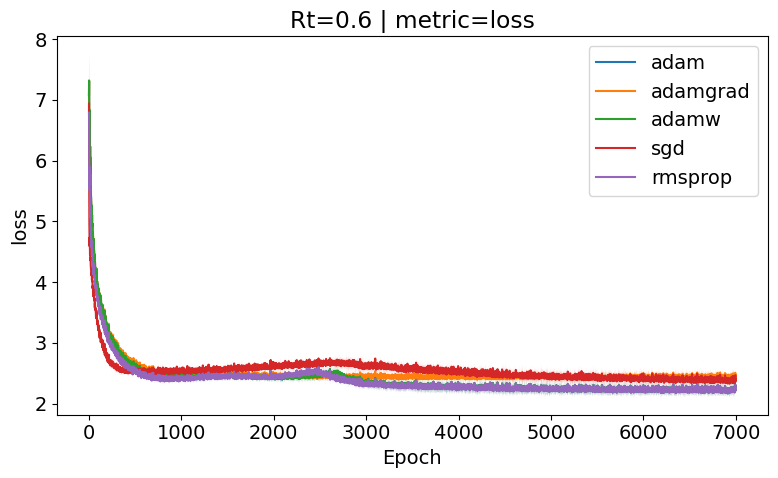

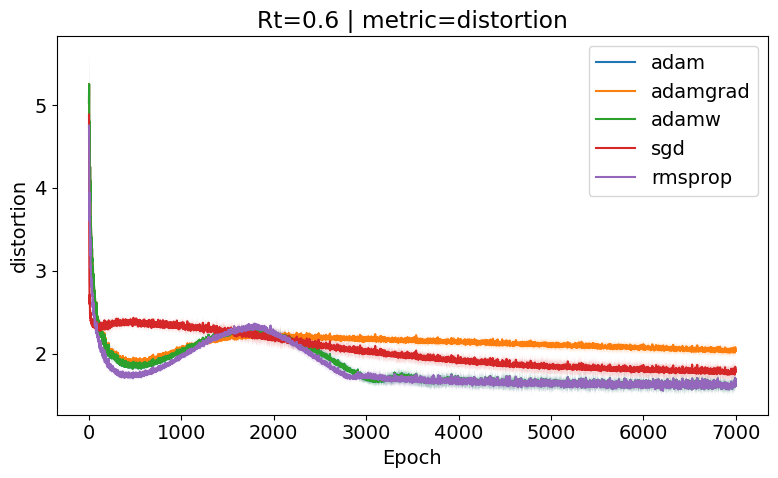

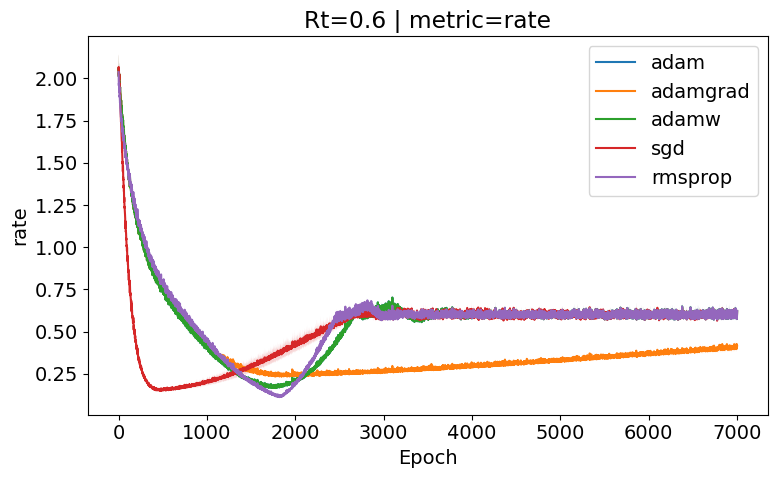

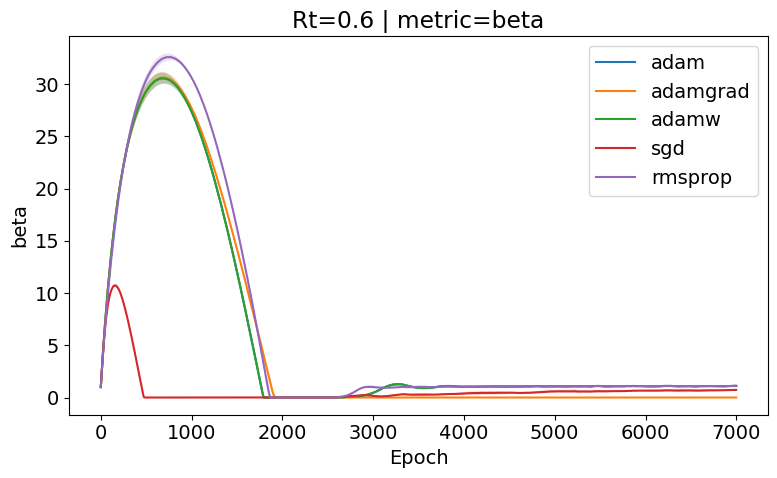

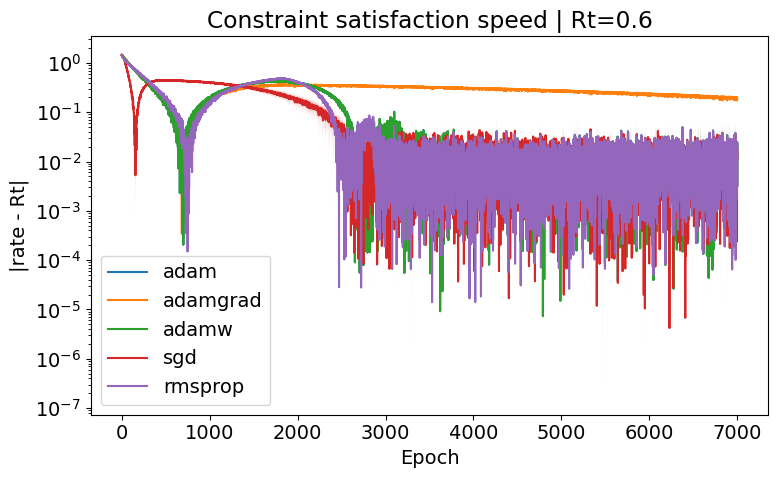

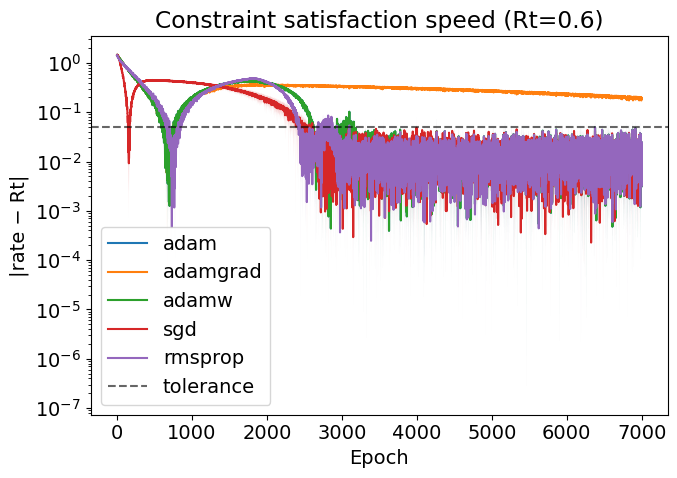

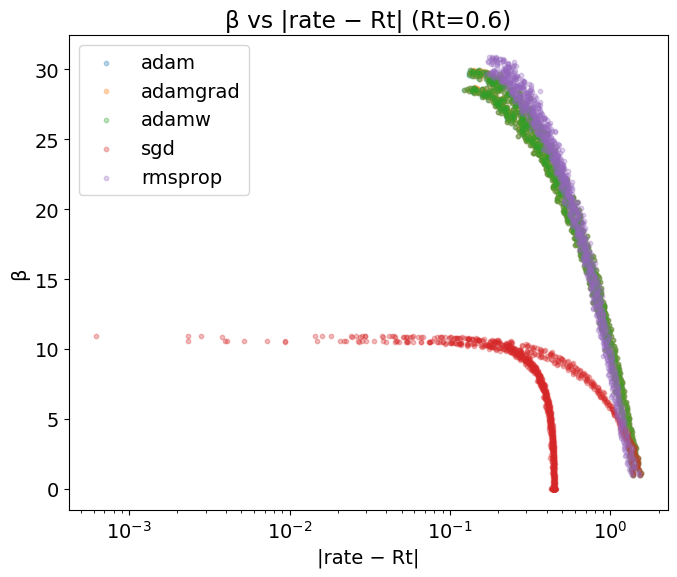

adam 592.0 ± 1.0
adamgrad 592.0 ± 1.0
adamw 592.0 ± 1.0
sgd 142.5 ± 2.5
rmsprop 640.5 ± 1.5
adam: r=0.428, p=0.0e+00
adamgrad: r=-0.447, p=0.0e+00
adamw: r=0.428, p=0.0e+00
sgd: r=0.177, p=1.9e-98
rmsprop: r=0.478, p=0.0e+00


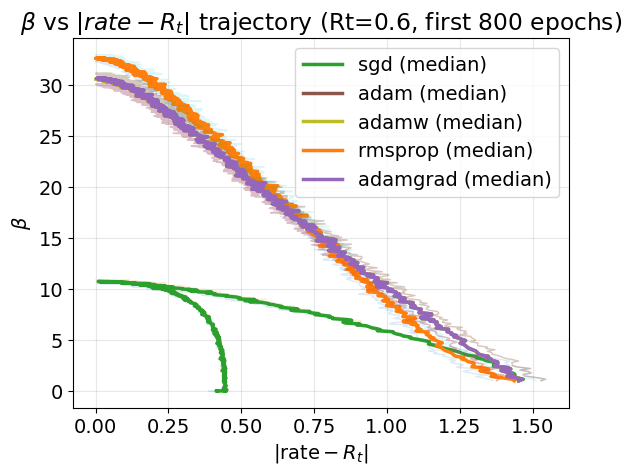

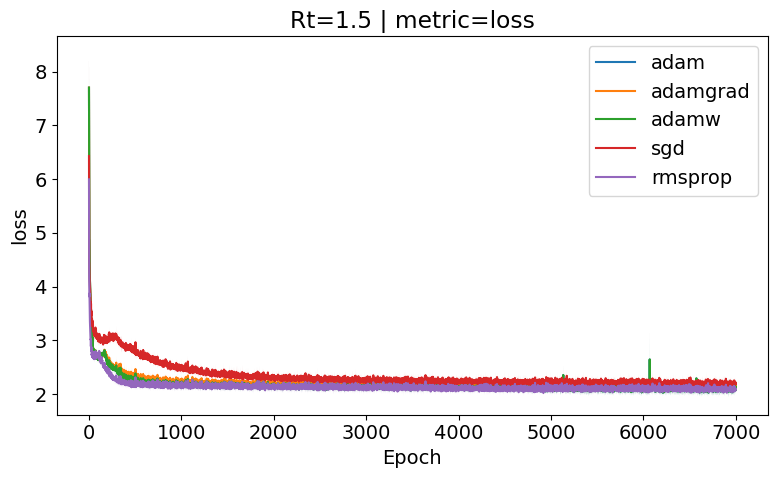

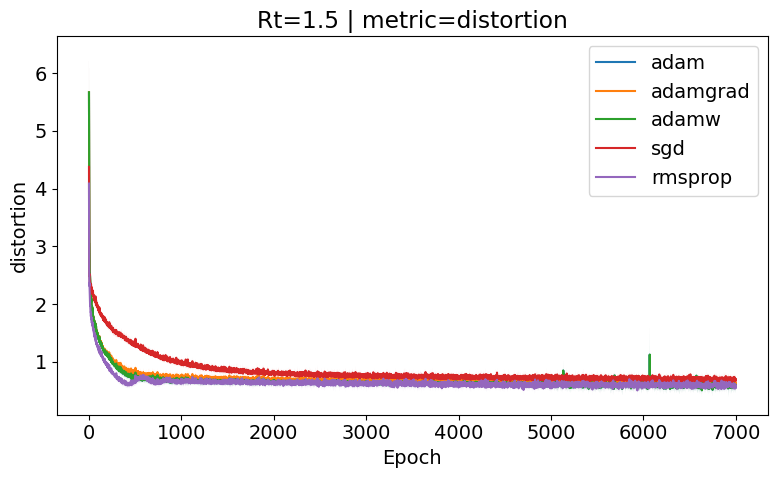

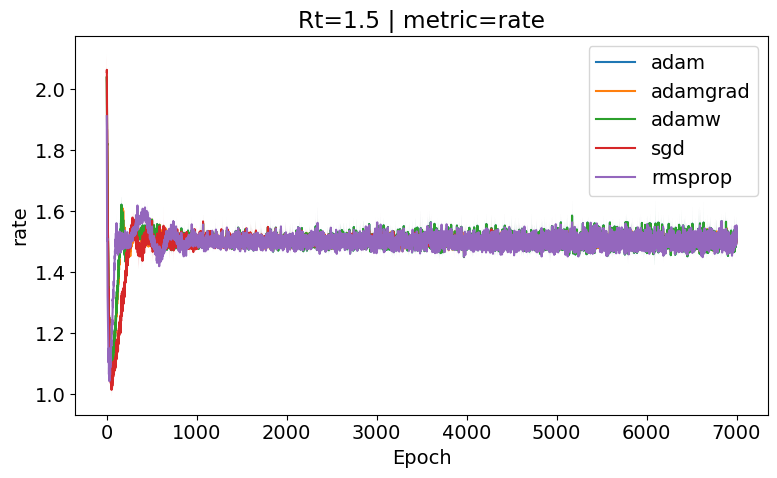

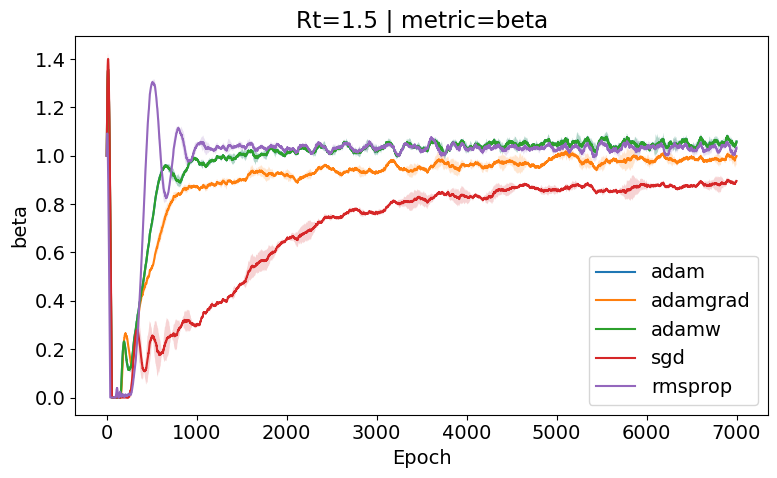

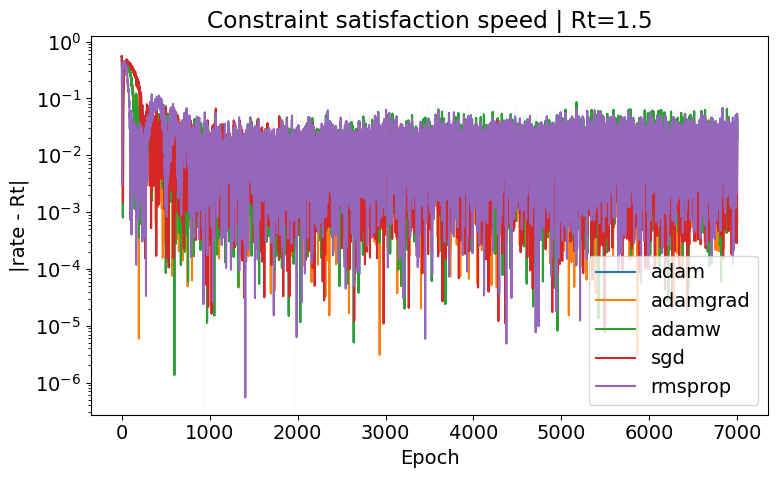

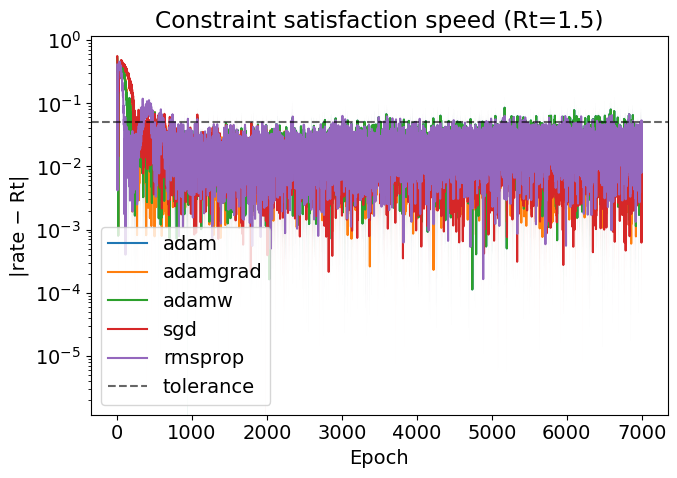

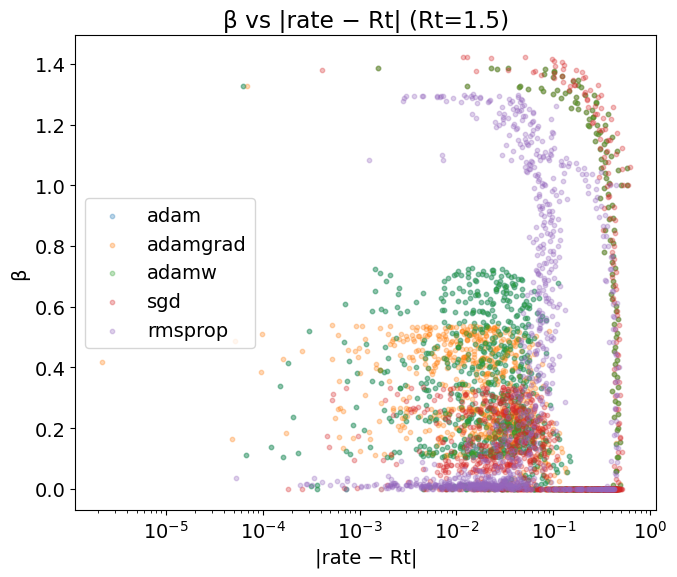

adam 12.5 ± 0.5
adamgrad 12.5 ± 0.5
adamw 12.5 ± 0.5
sgd 13.0 ± 1.0
rmsprop 4.0 ± 0.0
adam: r=-0.189, p=2.0e-112
adamgrad: r=-0.220, p=1.9e-152
adamw: r=-0.189, p=2.0e-112
sgd: r=-0.311, p=7.3e-311
rmsprop: r=-0.154, p=6.1e-75


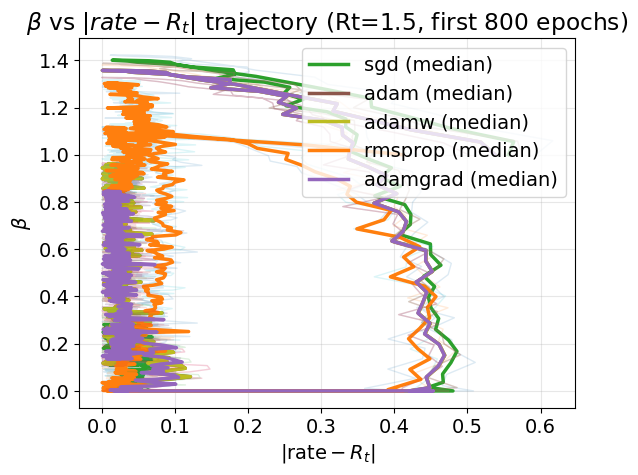

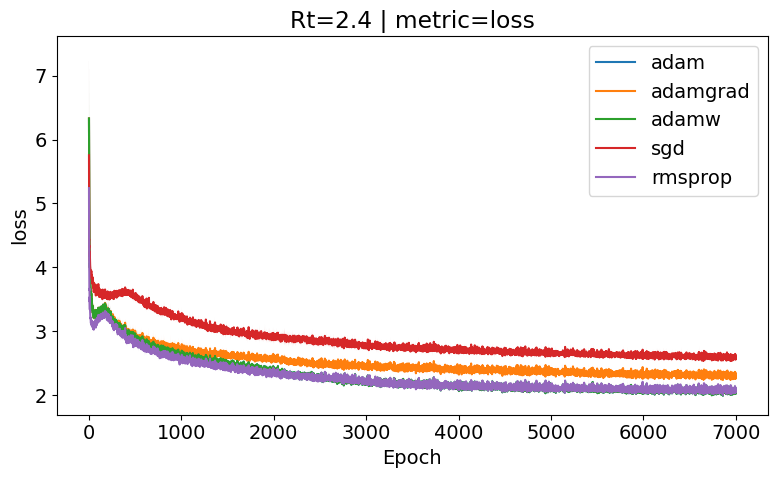

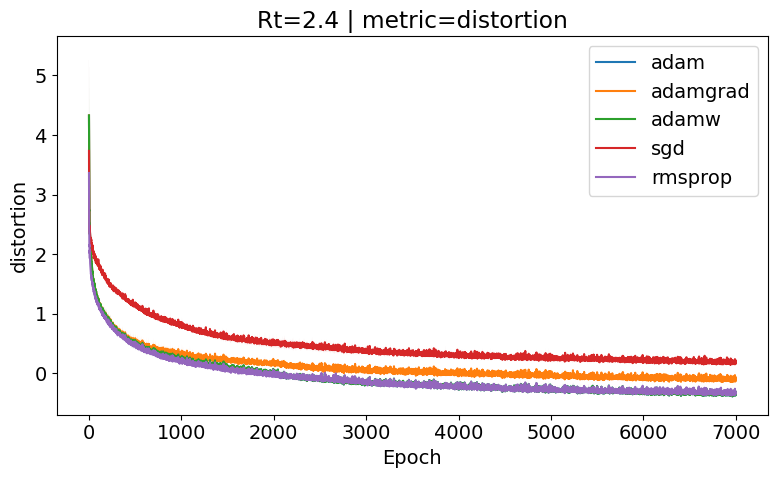

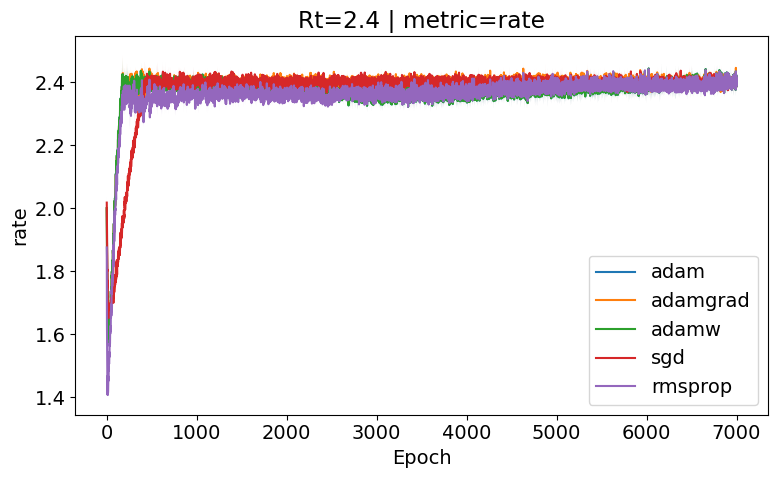

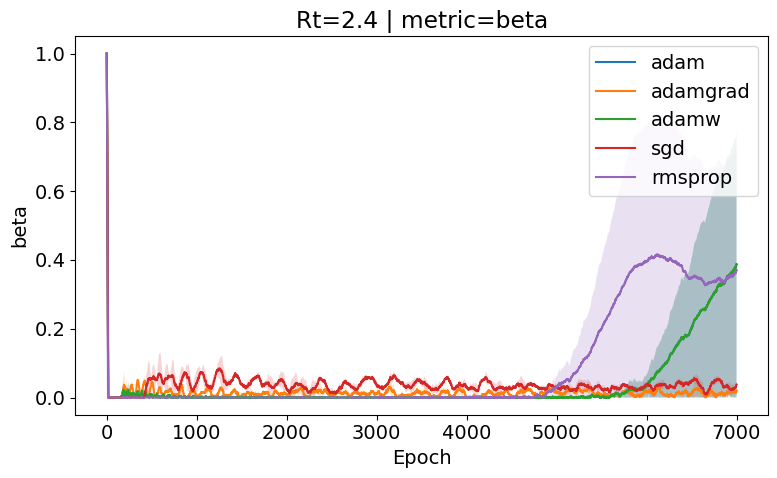

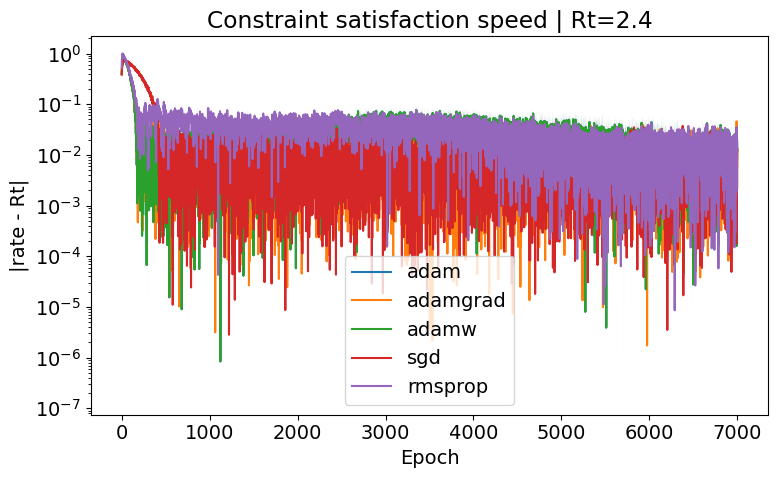

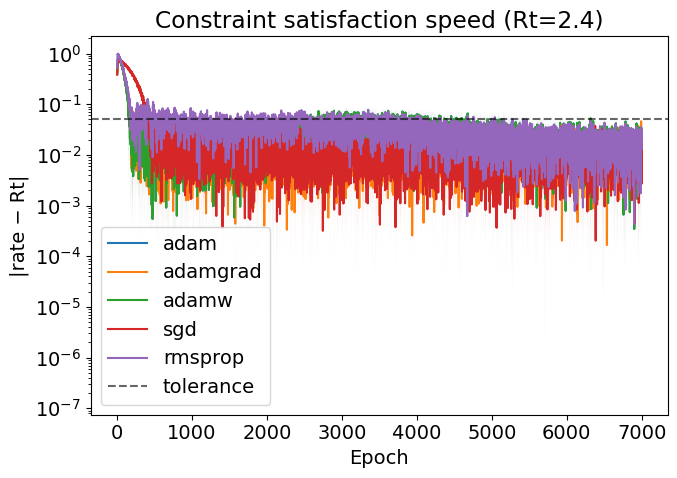

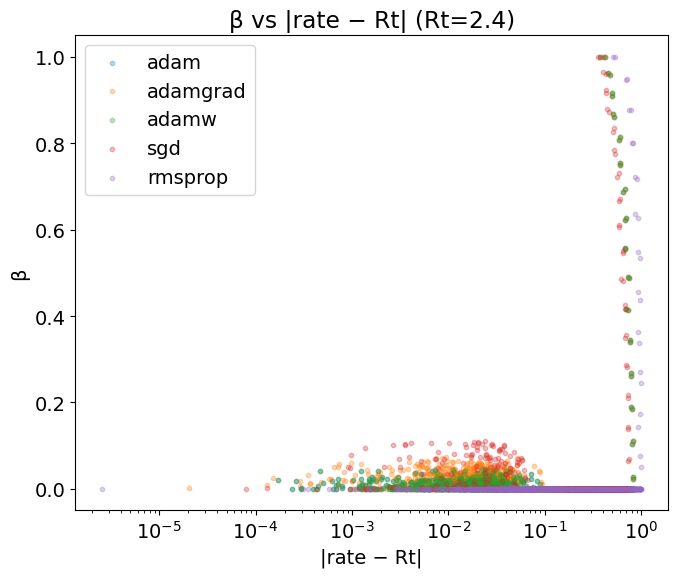

adam 157.5 ± 13.5
adamgrad 159.5 ± 11.5
adamw 157.5 ± 13.5
sgd 381.5 ± 26.5
rmsprop 174.0 ± 13.0
adam: r=-0.124, p=2.3e-49
adamgrad: r=0.111, p=1.1e-39
adamw: r=-0.124, p=2.3e-49
sgd: r=-0.020, p=1.7e-02
rmsprop: r=-0.328, p=0.0e+00


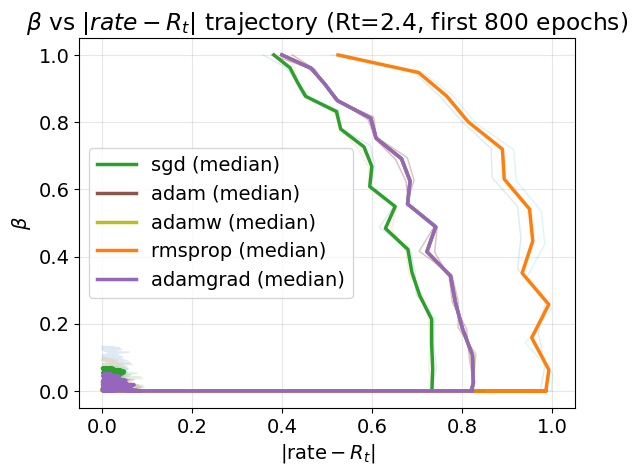

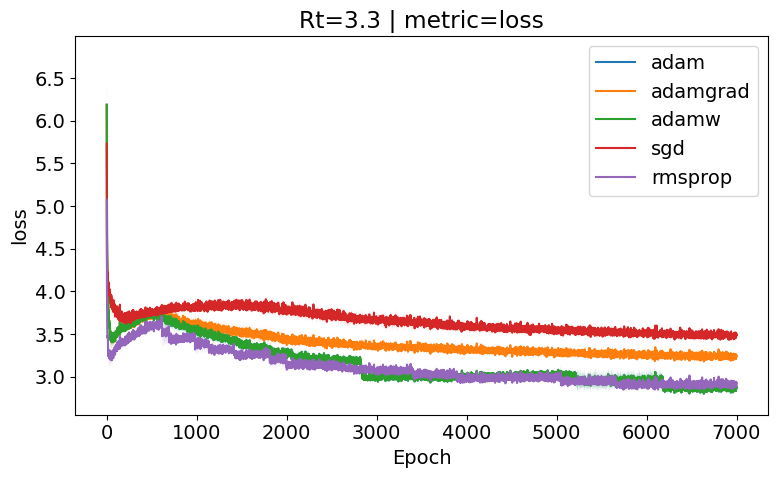

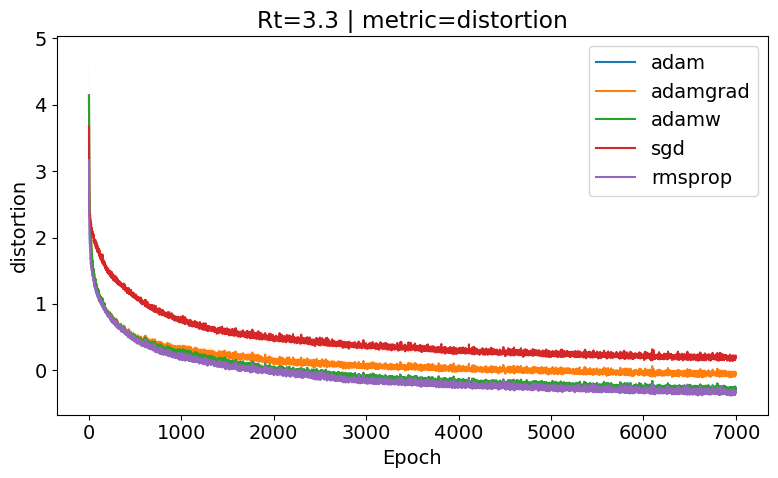

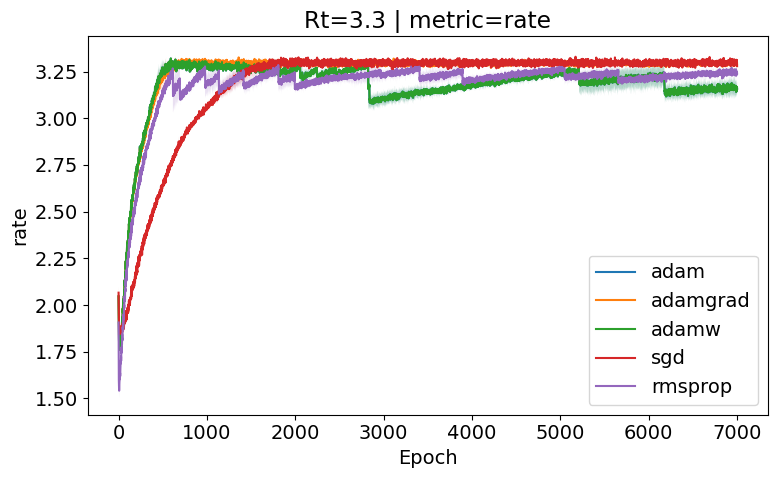

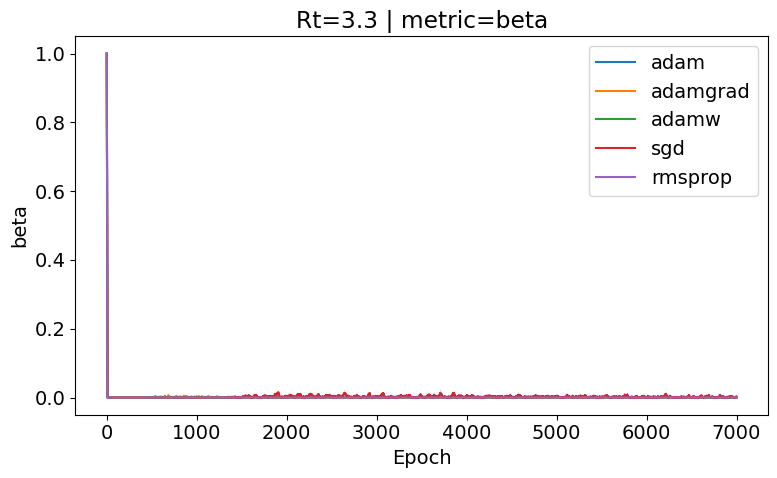

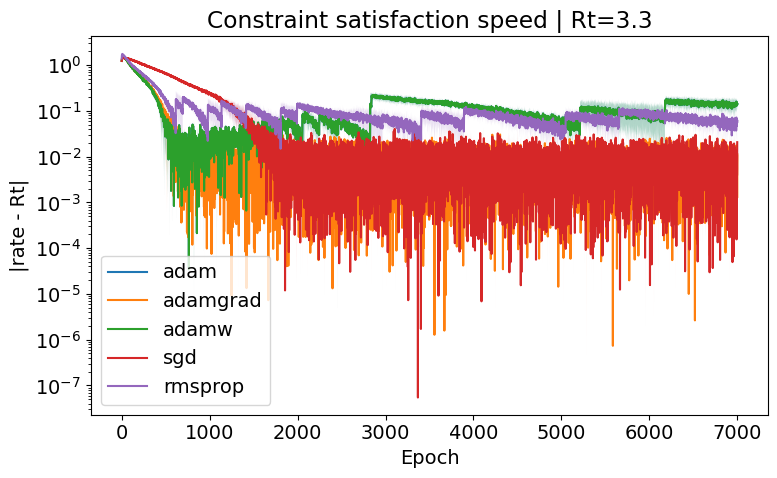

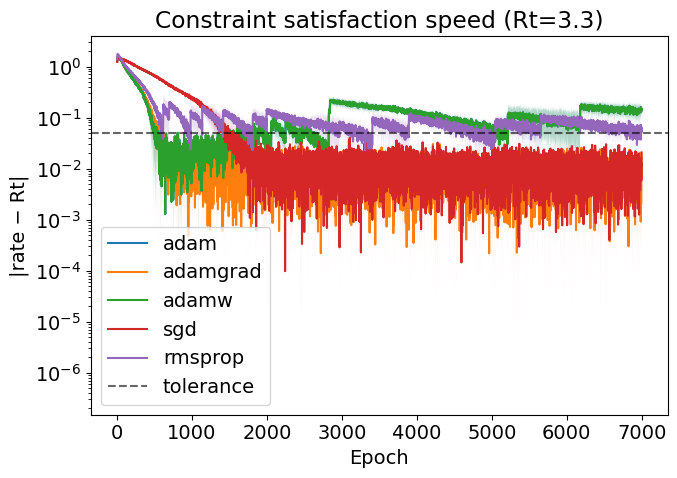

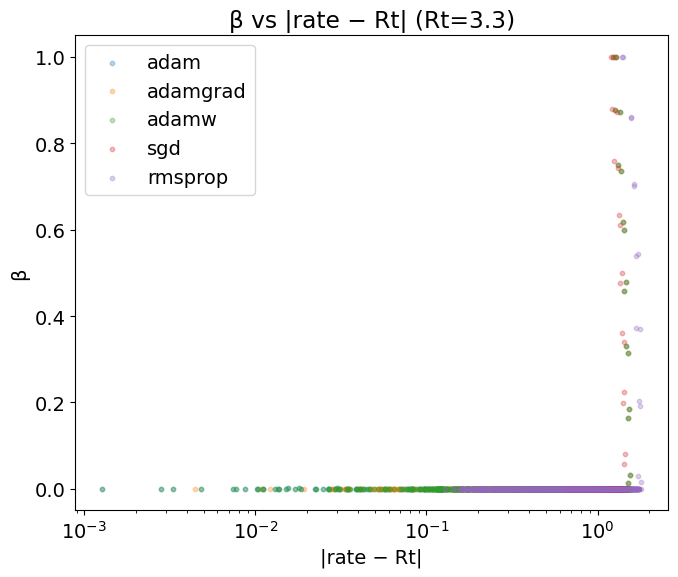

adam 478.0 ± 36.0
adamgrad 522.0 ± 69.0
adamw 478.0 ± 36.0
sgd 1386.5 ± 100.5
rmsprop 598.5 ± 37.5
adam: r=0.078, p=2.7e-20
adamgrad: r=0.089, p=6.6e-26
adamw: r=0.078, p=2.7e-20
sgd: r=0.026, p=1.9e-03
rmsprop: r=0.098, p=2.3e-31


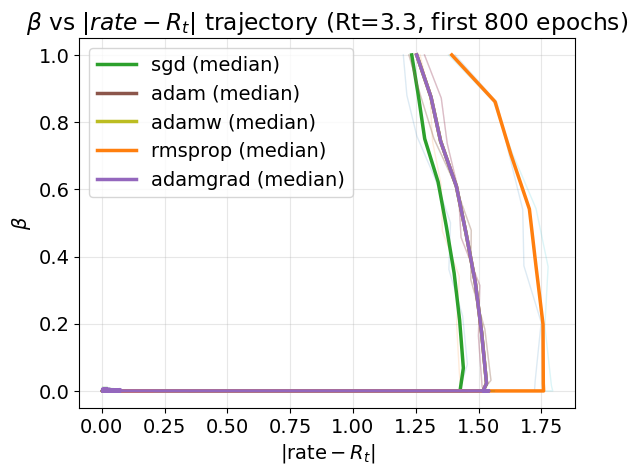

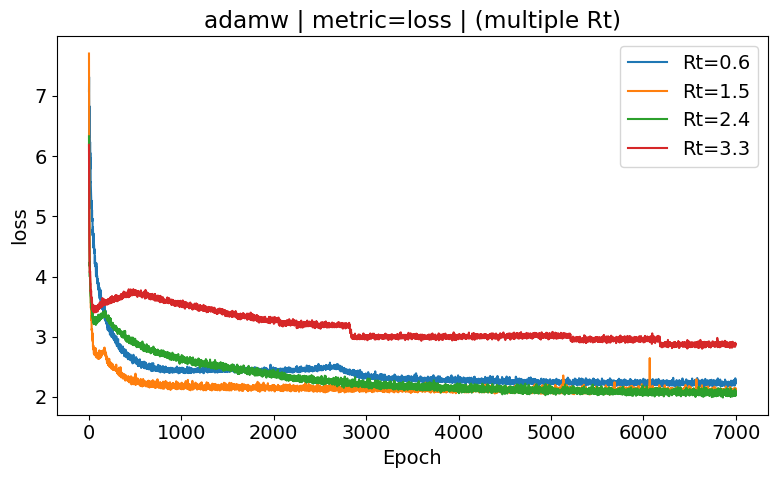

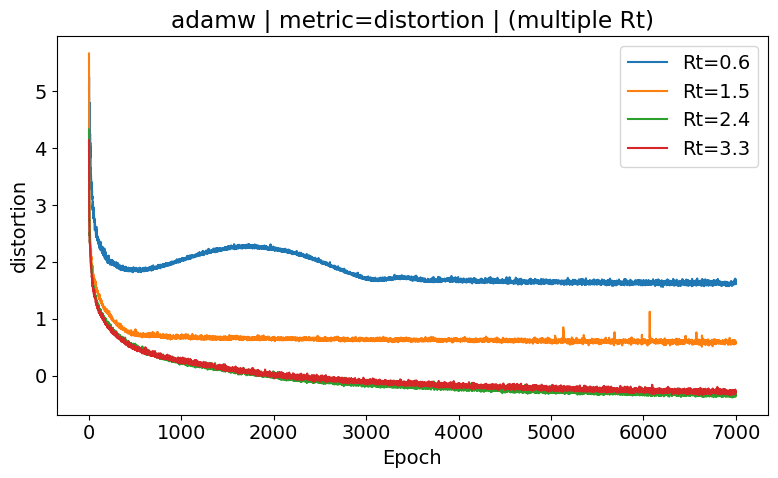

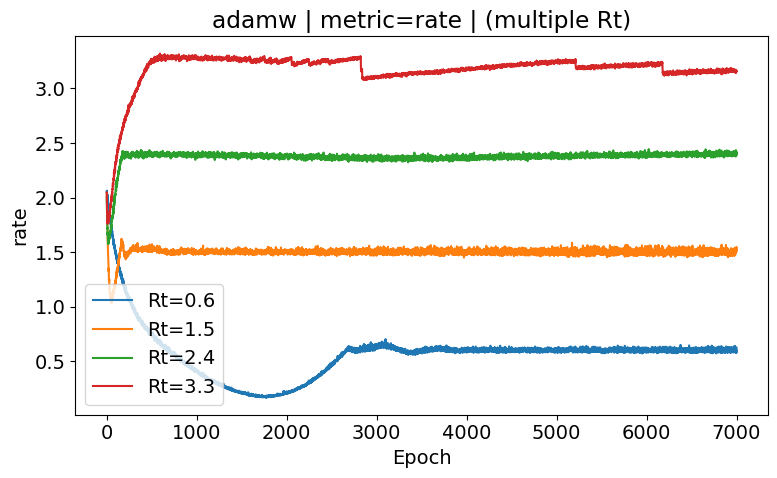

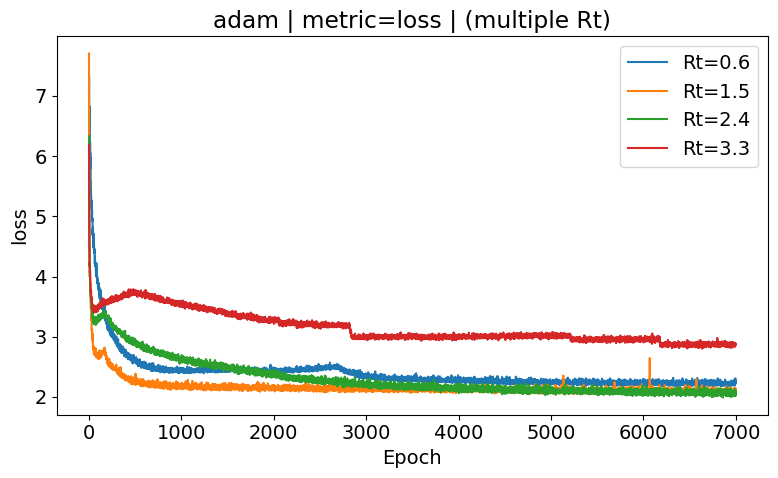

...

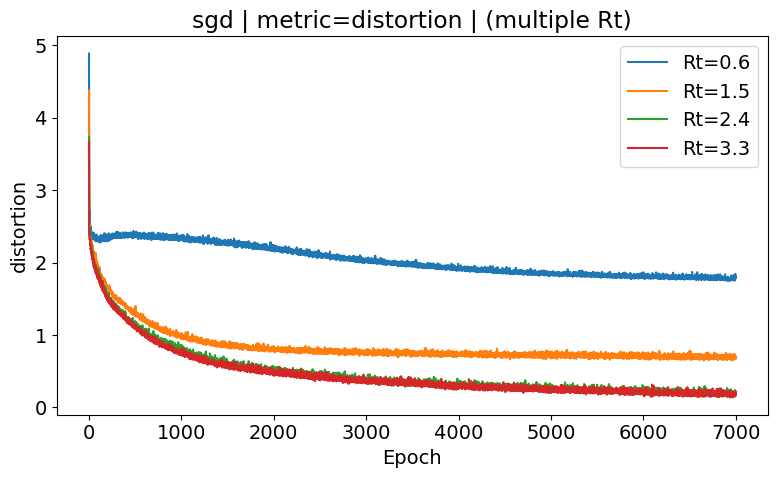

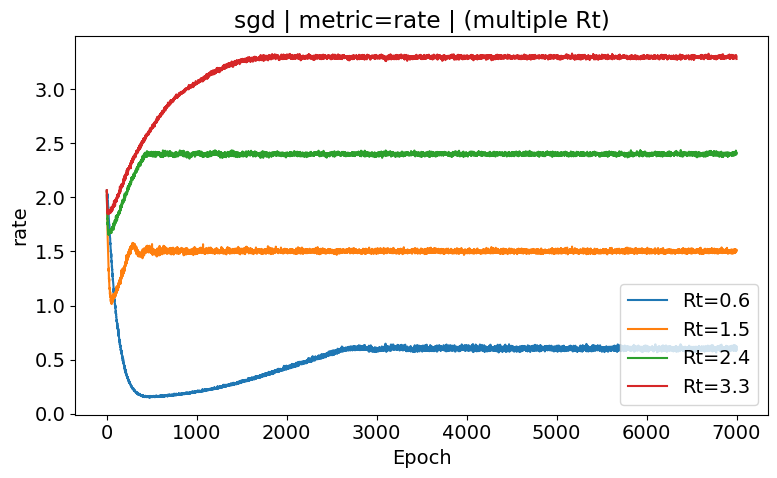

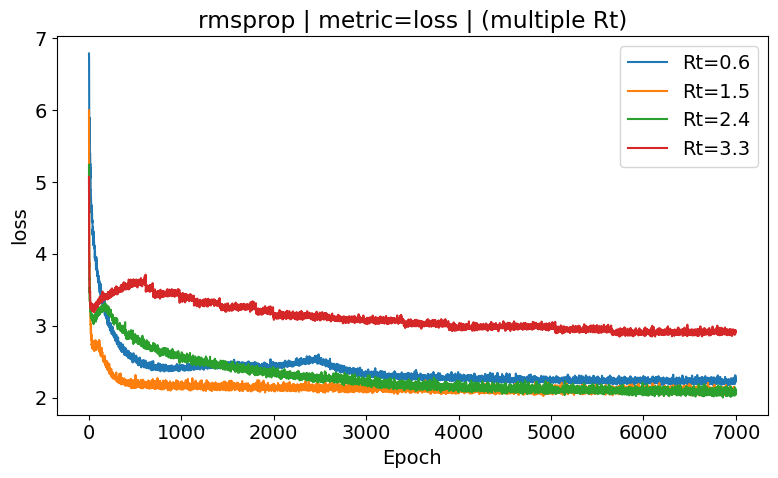

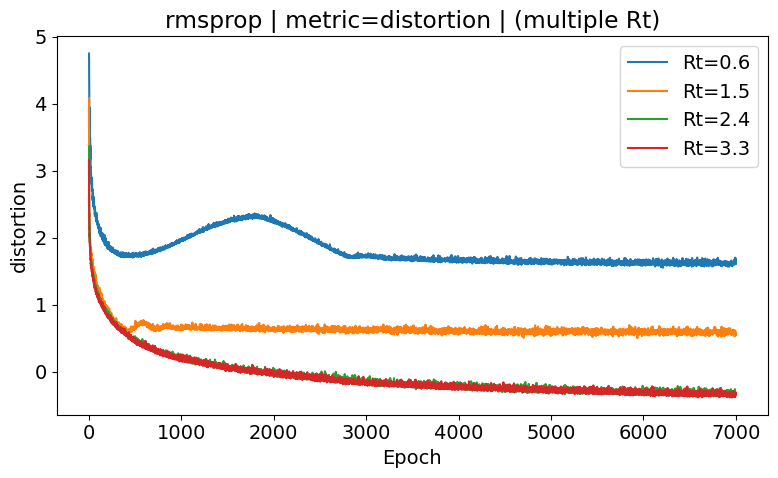

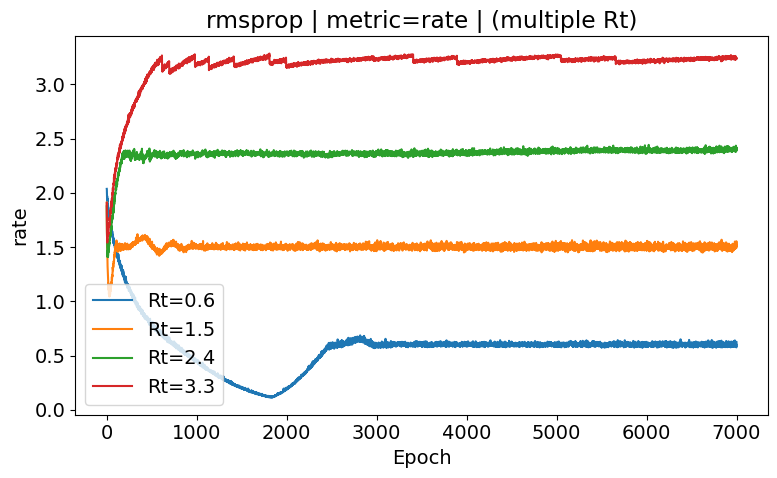

In [ ]:
# Draw the plots for a given Rt

PATH = os.getcwd() + f"./data/compare_opts_samples=100_N=12_q=Ising.pt"  # 네 파일 경로

all_results = load_results(PATH)

# 저장된 Rt 목록 확인
print("optimizers:", list(all_results.keys()))
print("example Rts:", _sorted_Rts_from_results(all_results))

# 원하는 Rt 하나 선택해서 optimizer 3개 비교
Rt = 0.6
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])
Rt = 0.6
trial_idx = 0
optimizers = ["sgd", "adam", "adamw", "rmsprop", "adamgrad"]


for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

plot_beta_gap_trajectory_all_opt(
    all_results,
    Rt=Rt,
    optimizers=optimizers,
    show_trials=True,
    agg="median",
    max_epochs=800
)

Rt = 1.5
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

plot_beta_gap_trajectory_all_opt(
    all_results,
    Rt=Rt,
    optimizers=optimizers,
    show_trials=True,
    agg="median",
    max_epochs=800
)


Rt = 2.4
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

plot_beta_gap_trajectory_all_opt(
    all_results,
    Rt=Rt,
    optimizers=optimizers,
    show_trials=True,
    agg="median",
    max_epochs=800
)


Rt = 3.3
plot_all_for_Rt(all_results, Rt)
corr = beta_gap_correlation(all_results, Rt)
summary = summarize_convergence(all_results, Rt, tol=0.05)

for opt, stats in summary.items():
    print(opt, stats["mean_epoch"], "±", stats["std_epoch"])

for opt, v in corr.items():
    print(f"{opt}: r={v['pearson_r']:.3f}, p={v['p_value']:.1e}")

plot_beta_gap_trajectory_all_opt(
    all_results,
    Rt=Rt,
    optimizers=optimizers,
    show_trials=True,
    agg="median",
    max_epochs=800
)


# optimizer 하나 고르고 Rt 여러 개 곡선 보기
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamw", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adam", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="adamgrad", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="sgd", max_Rts=6, shade=False)
plot_optimizer_with_multiple_Rts(all_results, optimizer="rmsprop", max_Rts=6, shade=False)